In [1]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
from plotly.subplots import make_subplots
import plotly.graph_objects as go
from sklearn.preprocessing import LabelEncoder
from sklearn.preprocessing import MinMaxScaler

import webbrowser
from threading import Timer
from dash import Dash, dcc, html, Input, Output, State
import plotly.express as px

from scipy import stats
from scipy.stats import norm
from scipy.stats import shapiro
from scipy.stats import ttest_ind
from scipy.stats import kruskal

from sklearn.linear_model import LinearRegression 
from sklearn.preprocessing import PolynomialFeatures
from sklearn.neighbors import KNeighborsRegressor
from sklearn.svm import SVR
from sklearn.model_selection import train_test_split, GridSearchCV, cross_val_score, KFold
from sklearn.metrics import mean_squared_error, r2_score
from sklearn.pipeline import Pipeline
from sklearn.model_selection import KFold
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score
from sklearn.decomposition import PCA
from sklearn.svm import SVR
from sklearn.pipeline import Pipeline

import warnings
warnings.filterwarnings("ignore")

# Data Import and Overview:
- In this project, as the first step, I plan to use two datasets with the same shape (i.e., the same number of rows and columns).
- After loading these datasets, I will make adjustments such as dropping columns and converting rows into columns.

In [3]:
df1 = pd.read_csv("dataset1.csv") # Loaded dataset1 via pandas.

In [4]:
df1.head() # Checked columns and first 5 rows of dataset1.

,Domain Code,Domain,Area Code (M49),Area,Element Code,Element,Item Code (CPC),Item,Year Code,Year,Unit,Value,Flag,Flag Description,Note
0,QCL,Crops and livestock products,250,France,5312,Area harvested,115.0,Barley,1961,1961,ha,2259100.0,A,Official figure,NaN
1,QCL,Crops and livestock products,250,France,5412,Yield,115.0,Barley,1961,1961,kg/ha,2396.0,A,Official figure,NaN
2,QCL,Crops and livestock products,250,France,5510,Production,115.0,Barley,1961,1961,t,5412790.0,A,Official figure,NaN
3,QCL,Crops and livestock products,250,France,5312,Area harvested,115.0,Barley,1962,1962,ha,2176500.0,A,Official figure,NaN
4,QCL,Crops and livestock products,250,France,5412,Yield,115.0,Barley,1962,1962,kg/ha,2758.1,A,Official figure,NaN


In [5]:
df1.shape # Checked how many columns and rows dataset1 has. This code returns a tuple with two values.

(8184, 15)

In [6]:
df1.describe(include = object) # Checked descriptive statistics for columns of a DataFrame which contain object data.                             

,Domain Code,Domain,Area,Element,Item,Unit,Flag,Flag Description,Note
count,8184,8184,8184,8184,8184,8060,8060,8060,27
unique,1,1,4,3,11,3,4,4,1
top,QCL,Crops and livestock products,France,Area harvested,Barley,t,A,Official figure,Unofficial figure
freq,8184,8184,2046,2728,744,2727,7480,7480,27


In [7]:
# Some columns are unnecessary, so dropping them will help streamline future processes.
df1 = df1.drop(['Domain Code', 'Domain', 'Area Code (M49)', 'Element Code', 'Item Code (CPC)', 'Year Code',
               'Unit', 'Flag', 'Flag Description', 'Note'], axis = 1)
# I put axis = 1 end of the code line in order to be performed only on columns

In [8]:
df1.head() # Checked columns and first 5 rows of dataset1 after dropping some columns.

,Area,Element,Item,Year,Value
0,France,Area harvested,Barley,1961,2259100.0
1,France,Yield,Barley,1961,2396.0
2,France,Production,Barley,1961,5412790.0
3,France,Area harvested,Barley,1962,2176500.0
4,France,Yield,Barley,1962,2758.1


In [9]:
# The columnd which named "Element" has 4 different unique.I wanted to transfer these rows to columns in order to
# more analysis-friendly format.
df1 = df1.pivot_table(index = ["Year", "Area", "Item"], columns = 'Element',
                      values = 'Value', aggfunc = 'first', dropna = False).reset_index()
# "index" code line helps to keep columns which will not be changed
# "columns" code line helps to split column which called "Element"
# "values" code line means which column's datas will be used.

In [10]:
df1.head() # Checked new columns and first 5 rows of dataset1.

Element,Year,Area,Item,Area harvested,Production,Yield
0,1961,France,Barley,2259100.0,5412790.0,2396.0
1,1961,France,Cabbages,24993.0,596720.0,23875.5
2,1961,France,Carrots and turnips,25402.0,606350.0,23870.2
3,1961,France,Cauliflowers and broccoli,25279.0,429800.0,17002.3
4,1961,France,Leeks and other alliaceous vegetables,13281.0,392370.0,29543.7


In [11]:
df1.shape # Checked how many columns and rows dataset1 has. This code returns a tuple with two values.

(2728, 6)

In [12]:
df2 = pd.read_csv("dataset2.csv") # Loaded dataset2 via pandas.

In [13]:
df2.head() # Checked columns and first 5 rows of dataset2.

,Domain Code,Domain,Area Code (M49),Area,Element Code,Element,Item Code (CPC),Item,Year Code,Year,Unit,Value,Flag,Flag Description,Note
0,TCL,Crops and livestock products,250,France,5610,Import Quantity,115.0,Barley,1961,1961,t,300.0,A,Official figure,NaN
1,TCL,Crops and livestock products,250,France,5622,Import Value,115.0,Barley,1961,1961,1000 USD,40.0,A,Official figure,NaN
2,TCL,Crops and livestock products,250,France,5910,Export Quantity,115.0,Barley,1961,1961,t,1943800.0,A,Official figure,NaN
3,TCL,Crops and livestock products,250,France,5922,Export Value,115.0,Barley,1961,1961,1000 USD,88680.0,A,Official figure,NaN
4,TCL,Crops and livestock products,250,France,5610,Import Quantity,115.0,Barley,1962,1962,t,131000.0,A,Official figure,NaN


In [14]:
df2.shape # Checked how many columns and rows dataset2 has. This code returns a tuple with two values.

(10912, 15)

In [15]:
df2.describe(include = object) # Checked descriptive statistics for columns of a DataFrame which contain object data.

,Domain Code,Domain,Area,Element,Item,Unit,Flag,Flag Description,Note
count,10912,10912,10912,10912,10912,10900,10900,10900,313
unique,1,1,4,4,11,2,4,4,1
top,TCL,Crops and livestock products,France,Import Quantity,Barley,t,A,Official figure,Estimated data using trading partners database
freq,10912,10912,2728,2728,992,5450,10470,10470,313


In [16]:
# Some columns are unnecessary, so dropping them will help streamline future processes.
df2 = df2.drop(['Domain Code', 'Domain', 'Area Code (M49)', 'Element Code', 'Item Code (CPC)', 'Year Code',
               'Unit', 'Flag', 'Flag Description', 'Note'], axis = 1)
# I put axis = 1 end of the code line in order to be performed only on columns

In [17]:
df2.head() # Checked columns and first 5 rows of dataset2 after dropping some columns.

,Area,Element,Item,Year,Value
0,France,Import Quantity,Barley,1961,300.0
1,France,Import Value,Barley,1961,40.0
2,France,Export Quantity,Barley,1961,1943800.0
3,France,Export Value,Barley,1961,88680.0
4,France,Import Quantity,Barley,1962,131000.0


In [18]:
# The columnd which named "Element" has 4 different unique.I wanted to transfer these rows to columns in order to
# more analysis-friendly format
df2 = df2.pivot_table(index = ["Year", "Area", "Item"], columns = 'Element',
                      values = 'Value', aggfunc = 'first', dropna = False).reset_index()
# "index" code line helps to keep columns which will not be changed
# "columns" code line helps to split column which called "Element"
# "values" code line means which column's datas will be used.

In [19]:
df2.head() # Checked columns and first 5 rows of dataset2.

Element,Year,Area,Item,Export Quantity,Export Value,Import Quantity,Import Value
0,1961,France,Barley,1943800.0,88680.0,300.0,40.0
1,1961,France,Cabbages,10534.0,900.0,1625.0,106.0
2,1961,France,Carrots and turnips,8872.0,814.0,7393.0,944.0
3,1961,France,Cauliflowers and broccoli,87561.0,5449.0,71.0,9.0
4,1961,France,Leeks and other alliaceous vegetables,0.0,0.0,0.0,0.0


In [20]:
df2.shape # Checked how many columns and rows dataset2 has. This code returns a tuple with two values.

(2728, 7)

- At the moment, we have two adjusted datasets. Now, I plan to combine them into a single dataset to enable better analysis in the following steps. After that, I will rename some rows with long names to make them more concise.

In [22]:
# Two datasets have been merged using the columns 'Year,' 'Area,' and 'Item' as keys. 
# "outer" join was used to include all rows from both DataFrames.
df3 = pd.merge(df1,df2, on = ["Year", "Area", "Item"], how = "outer")

In [23]:
df3.head() # Checked columns and first 5 rows of new dataset which was merged.

Element,Year,Area,Item,Area harvested,Production,Yield,Export Quantity,Export Value,Import Quantity,Import Value
0,1961,France,Barley,2259100.0,5412790.0,2396.0,1943800.0,88680.0,300.0,40.0
1,1961,France,Cabbages,24993.0,596720.0,23875.5,10534.0,900.0,1625.0,106.0
2,1961,France,Carrots and turnips,25402.0,606350.0,23870.2,8872.0,814.0,7393.0,944.0
3,1961,France,Cauliflowers and broccoli,25279.0,429800.0,17002.3,87561.0,5449.0,71.0,9.0
4,1961,France,Leeks and other alliaceous vegetables,13281.0,392370.0,29543.7,0.0,0.0,0.0,0.0


In [24]:
df3.shape # Checked how many columns and rows merged dataset has. As we see, number of rows is same but number of columns is more than before

(2728, 10)

In [25]:
df3.describe() # Checked statistical summary of the numerical columns in the DataFrame.
              # We can quickly understand the distribution of numerical datas and detect potential anomalies  
             #such as unusually high standard deviation or outlier max values.

Element,Year,Area harvested,Production,Yield,Export Quantity,Export Value,Import Quantity,Import Value
count,2728.000000,2.697000e+03,2.727000e+03,2636.000000,2.722000e+03,2.722000e+03,2.728000e+03,2.728000e+03
mean,1991.500000,3.813647e+05,3.932978e+06,23494.190250,6.492050e+05,1.335063e+05,2.832592e+05,6.208362e+04
std,17.898811,9.144711e+05,7.909568e+06,18721.363298,2.297556e+06,4.990527e+05,6.851825e+05,1.427375e+05
min,1961.000000,0.000000e+00,0.000000e+00,1255.900000,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00
25%,1976.000000,5.710000e+03,1.057880e+05,5666.825000,1.680817e+03,6.352500e+02,4.710000e+03,1.333500e+03
50%,1991.500000,2.370000e+04,4.104900e+05,22504.000000,2.762450e+04,7.301500e+03,4.353996e+04,1.402400e+04
75%,2007.000000,1.790000e+05,3.233596e+06,36297.100000,1.729285e+05,4.325725e+04,1.950802e+05,5.669100e+04
max,2022.000000,5.542247e+06,4.630014e+07,96998.300000,2.108154e+07,7.358185e+06,5.681698e+06,1.477716e+06


In [26]:
df3["Area"].unique() # Checked what "Area" feauture has

array(['France', 'Germany', 'Ireland', 'Netherlands (Kingdom of the)'],
      dtype=object)

In [27]:
df3["Item"].unique() # Checked what "Item" feauture has

array(['Barley', 'Cabbages', 'Carrots and turnips',
       'Cauliflowers and broccoli',
       'Leeks and other alliaceous vegetables', 'Oats',
       'Onions and shallots, dry (excluding dehydrated)', 'Potatoes',
       'Rye', 'Sugar beet', 'Wheat'], dtype=object)

In [28]:
# As we see above, some column indexes are excessively long. Make them short would be better.
df3.rename(columns={'Area harvested': 'Area Harvested'}, inplace=True)
df3["Area"] = df3["Area"].replace('Netherlands (Kingdom of the)','Netherlands') # Replaced string in column
df3["Item"] = df3["Item"].replace({
                                    'Leeks and other alliaceous vegetables' : 'Leeks and allies',
                                    'Onions and shallots, dry (excluding dehydrated)' : 'Onions and shallots'
                                    }) # Replaced multiple values in column using a dictionary.

In [29]:
df3.head() # Checked columns and first 5 rows of new dataset after some values renamed.

Element,Year,Area,Item,Area Harvested,Production,Yield,Export Quantity,Export Value,Import Quantity,Import Value
0,1961,France,Barley,2259100.0,5412790.0,2396.0,1943800.0,88680.0,300.0,40.0
1,1961,France,Cabbages,24993.0,596720.0,23875.5,10534.0,900.0,1625.0,106.0
2,1961,France,Carrots and turnips,25402.0,606350.0,23870.2,8872.0,814.0,7393.0,944.0
3,1961,France,Cauliflowers and broccoli,25279.0,429800.0,17002.3,87561.0,5449.0,71.0,9.0
4,1961,France,Leeks and allies,13281.0,392370.0,29543.7,0.0,0.0,0.0,0.0


In [30]:
df3.info() # Checked the data types of columns to ensure each column has the correct type.

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2728 entries, 0 to 2727
Data columns (total 10 columns):
 #   Column           Non-Null Count  Dtype  
---  ------           --------------  -----  
 0   Year             2728 non-null   int64  
 1   Area             2728 non-null   object 
 2   Item             2728 non-null   object 
 3   Area Harvested   2697 non-null   float64
 4   Production       2727 non-null   float64
 5   Yield            2636 non-null   float64
 6   Export Quantity  2722 non-null   float64
 7   Export Value     2722 non-null   float64
 8   Import Quantity  2728 non-null   float64
 9   Import Value     2728 non-null   float64
dtypes: float64(7), int64(1), object(2)
memory usage: 213.3+ KB


In [31]:
df3["Item"].unique() # Checked what "Item" feauture has

array(['Barley', 'Cabbages', 'Carrots and turnips',
       'Cauliflowers and broccoli', 'Leeks and allies', 'Oats',
       'Onions and shallots', 'Potatoes', 'Rye', 'Sugar beet', 'Wheat'],
      dtype=object)

### Data Dictionary

The dataset contains agricultural data with the following columns:
- `Year` ------ The year of record from 1961 to 2022
- `Area` ------ The region/country where the data is recorded. ( France, Germany, Ireland and Netherlands)
- `Item` ------ The crop or agricultural item. ( Barley, Cabbages, Carrots and turnips, Cauliflowers and broccoli, Leeks and allies, Oats, Onions and                                                    shallots,Potatoes, Rye, Sugar beet, Wheat )

- `Area Harvested` ------ The harvested area in hectares. ( ha )
- `Production` ------ The total production of the crop/item in ton. (t)
- `Yield` ------  It represents the ratio of production to the area harvested for each crop or item. (t/ha)
- `Export Quantity` ------ The quantity of the item exported in ton. (t)
- `Export Value` ------ The value of the exports in monetary terms. (1000 USD)
- `Import Quantity` ------ The quantity of the item imported in ton. (t)
- `Import Value` ------ The value of the imports in monetary terms. (1000 USD)

# Exploratory Data Analysis (EDA)


### Detecting of missing datas

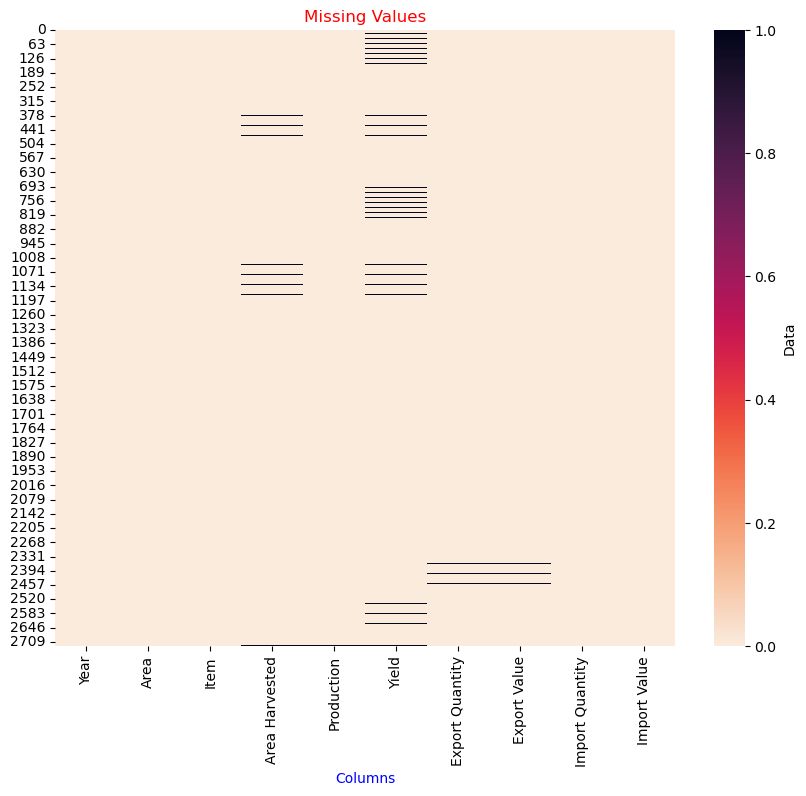

In [35]:
# missing values heatmap was plotted
plt.figure(figsize=(10,8))
sns.heatmap(df3.isnull(), cmap="rocket_r",cbar_kws={'label' : 'Data'})
plt.title('Missing Values', color="red",loc="center")
plt.xlabel('Columns', color="blue")
plt.show()

In [36]:
df3.isnull().sum(0) # Checked how many missing data we have in dataset.
                   # True if the value is NaN. False otherwise.
                  # "sum(0)" means sums the True values (treated as 1) column-wise (axis=0).

Element
Year                0
Area                0
Item                0
Area Harvested     31
Production          1
Yield              92
Export Quantity     6
Export Value        6
Import Quantity     0
Import Value        0
dtype: int64

When we look carefully missing datas details , we will see that the column which is "Yield" has more missing values than other feautures.This is because 'Yield' is calculated as 'Area Harvested' divided by 'Production.' Therefore,
- 1 - If "Production" = 0 ----------> even if "Area Harvested" has a value , "Yield" will be "NaN" value.
- 2 - If both "Area Harvested" and "Production"  = 0 ---------> the result is 0/0, which also returns "NaN" for "Yield".

So, I decided to drop the 'Yield' column before handling the missing data. After filling in the missing values, I will add the 'Yield' column back, calculated as 'Area Harvested' divided by 'Production.

In [38]:
# The column which is "Yield" has been dropped.I put axis = 1 end of the code line in order to be performed only on columns.
df4 = df3.drop(["Yield"], axis = 1)

In [39]:
df4.head() # Checked columns and first 5 rows of dataset after dropped of column.

Element,Year,Area,Item,Area Harvested,Production,Export Quantity,Export Value,Import Quantity,Import Value
0,1961,France,Barley,2259100.0,5412790.0,1943800.0,88680.0,300.0,40.0
1,1961,France,Cabbages,24993.0,596720.0,10534.0,900.0,1625.0,106.0
2,1961,France,Carrots and turnips,25402.0,606350.0,8872.0,814.0,7393.0,944.0
3,1961,France,Cauliflowers and broccoli,25279.0,429800.0,87561.0,5449.0,71.0,9.0
4,1961,France,Leeks and allies,13281.0,392370.0,0.0,0.0,0.0,0.0


### Filling of Datas
"Area Harvested", "Production", "Export Quantity" and "Export Value" columns have missing data. Since these columns contain continuous numerical data, the missing values are less than 5%, and their distributions are right-skewed, we can use mean or median imputation to fill the gaps.

In [41]:
# "mean" and "median" method have been used for filling data
df4["Area Harvested"] = df4["Area Harvested"].fillna(df4["Area Harvested"].mean())
df4["Production"] = df4["Production"].fillna(df4["Production"].mean())
df4["Export Quantity"] = df4["Export Quantity"].fillna(df4["Export Quantity"].median())
df4["Export Value"] = df4["Export Value"].fillna(df4["Export Value"].median())

In [42]:
df4.isnull().sum(0) # After filling data methods, there is no missing data for every column.

Element
Year               0
Area               0
Item               0
Area Harvested     0
Production         0
Export Quantity    0
Export Value       0
Import Quantity    0
Import Value       0
dtype: int64

### Detecting of Outliers

In this step, we will use methods like histograms and boxplots to visualize outliers.
- Histogram helps us see the distribution of numerical columns.
- Boxplots helps us to detect outliers using the IQR method.

In [45]:
df5 = pd.DataFrame(df4)

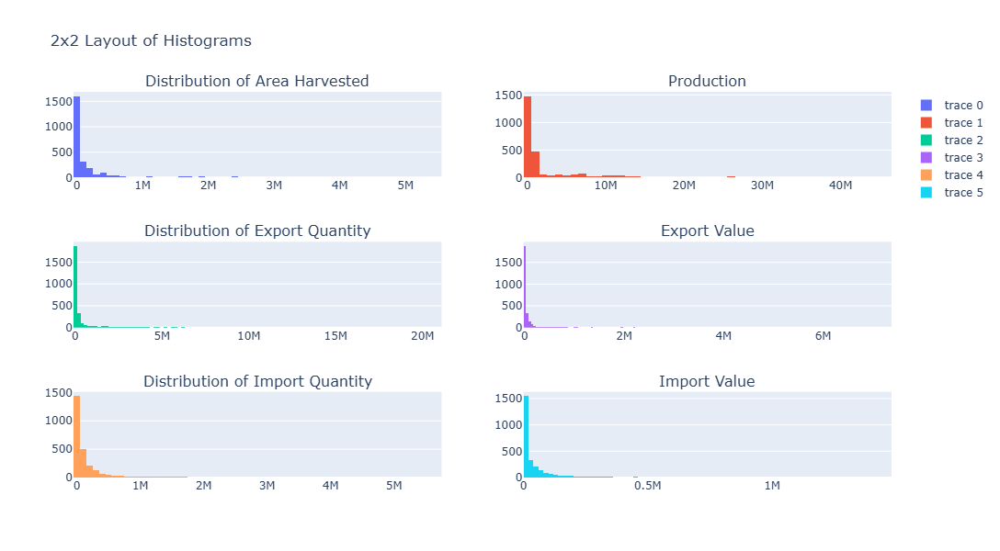

In [46]:
# Create subplots: 2 rows, 3 columns
fig = make_subplots(rows=3, cols=2, subplot_titles=("Distribution of Area Harvested", "Production", 
                                                    "Distribution of Export Quantity", "Export Value",
                                                   "Distribution of Import Quantity", "Import Value"))
# Add histograms to the subplots for each column
fig.add_trace(go.Histogram(x=df5["Area Harvested"]), row=1, col=1)
fig.add_trace(go.Histogram(x=df5["Production"]), row=1, col=2)
fig.add_trace(go.Histogram(x=df5["Export Quantity"]), row=2, col=1)
fig.add_trace(go.Histogram(x=df5["Export Value"]), row=2, col=2)
fig.add_trace(go.Histogram(x=df5["Import Quantity"]), row=3, col=1)
fig.add_trace(go.Histogram(x=df5["Import Value"]), row=3, col=2)

# Update layout
fig.update_layout(height=600, width=1000,title_text="2x2 Layout of Histograms") # Layout name

# Show the figure
fig.show()

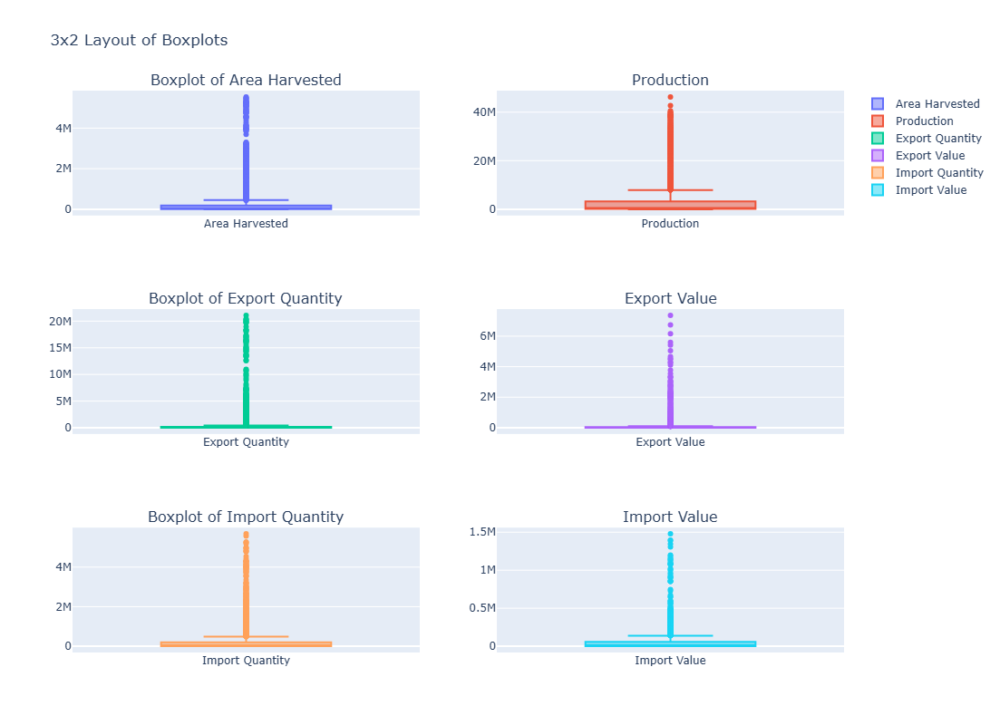

In [47]:
# Create subplots: 2 rows, 3 columns
fig = make_subplots(rows=3, cols=2, subplot_titles=("Boxplot of Area Harvested", "Production", 
                                                    "Boxplot of Export Quantity", "Export Value",
                                                    "Boxplot of Import Quantity", "Import Value"))

# Add boxplots to the subplots for each column
fig.add_trace(go.Box(y=df5["Area Harvested"], name="Area Harvested"), row=1, col=1)
fig.add_trace(go.Box(y=df5["Production"], name="Production"), row=1, col=2)
fig.add_trace(go.Box(y=df5["Export Quantity"], name="Export Quantity"), row=2, col=1)
fig.add_trace(go.Box(y=df5["Export Value"], name="Export Value"), row=2, col=2)
fig.add_trace(go.Box(y=df5["Import Quantity"], name="Import Quantity"), row=3, col=1)
fig.add_trace(go.Box(y=df5["Import Value"], name="Import Value"), row=3, col=2)

# Update layout
fig.update_layout(height=800, width=1000, title_text="3x2 Layout of Boxplots")

# Show the figure
fig.show()

### Adjustment of Outliers

As we can see from the graphs above, there are significant outliers in each column. The distributions of these columns are skewed and not normally distributed. Therefore, I decided to use the IQR method, as it helps adjust extreme outliers that may distort the mean and standard deviation. I avoided using the Z-score, since it is suitable for symmetric, bell-shaped distributions, which these data do not follow.

In [49]:
def find_outliers_IQR(column):
    Q1 = column.quantile(0.25)
    Q3 = column.quantile(0.75)
    IQR = Q3 - Q1
    lower_bound = Q1 - 1.5 * IQR
    upper_bound = Q3 + 1.5 * IQR
    return column[(column < lower_bound) | (column > upper_bound)]

In [50]:
columns_to_check = ["Area Harvested", "Production", "Export Quantity",
                    "Export Value", "Import Quantity", "Import Value"]

outlier_results = []
for column in columns_to_check:
    if column in df5.columns:
        outliers = find_outliers_IQR(df5[column])
        result = {
            "Column": column,
            "Number of Outliers": len(outliers),
            "Max Outlier Value": outliers.max() if not outliers.empty else None,
            "Min Outlier Value": outliers.min() if not outliers.empty else None
        }
        outlier_results.append(result)

# Convert results to a DataFrame and display it
outlier_summary = pd.DataFrame(outlier_results)

outlier_summary

,Column,Number of Outliers,Max Outlier Value,Min Outlier Value
0,Area Harvested,461,5542247.0,454774.00
1,Production,433,46300141.0,7945554.00
2,Export Quantity,468,21081540.0,428840.17
3,Export Value,436,7358185.0,107086.00
4,Import Quantity,362,5681697.5,480769.00
5,Import Value,312,1477716.0,139952.00


In [51]:
df5.shape

(2728, 9)

In [52]:
# a function was written to find outliers and impute of them with mean method.
# Data which lower than q1 - 1.5*iqr or higher than q3 + 1.5*iqr will be adjustment with mean() function.
 
def imputation_outliers_IQR(df5):
   Q1=df5.quantile(0.25)
   Q3=df5.quantile(0.75)
   IQR=Q3-Q1
   upper = Q3+1.5*IQR 
   lower = Q1-1.5*IQR
   df5 = np.where((df5) < lower, lower, np.where((df5) > upper, upper, df5))
   return df5

In [53]:
df5['Area Harvested'] = imputation_outliers_IQR(df5['Area Harvested'])
df5['Production'] = imputation_outliers_IQR(df5['Production'])
df5['Export Quantity'] = imputation_outliers_IQR(df5['Export Quantity'])
df5['Export Value'] = imputation_outliers_IQR(df5['Export Value'])
df5['Import Quantity'] = imputation_outliers_IQR(df5['Import Quantity'])
df5['Import Value'] = imputation_outliers_IQR(df5['Import Value'])

In [54]:
df5.head()

Element,Year,Area,Item,Area Harvested,Production,Export Quantity,Export Value,Import Quantity,Import Value
0,1961,France,Barley,453773.75,5412790.0,428706.53125,88680.0,300.0,40.0
1,1961,France,Cabbages,24993.00,596720.0,10534.00000,900.0,1625.0,106.0
2,1961,France,Carrots and turnips,25402.00,606350.0,8872.00000,814.0,7393.0,944.0
3,1961,France,Cauliflowers and broccoli,25279.00,429800.0,87561.00000,5449.0,71.0,9.0
4,1961,France,Leeks and allies,13281.00,392370.0,0.00000,0.0,0.0,0.0


### Feauture Engineering

- As mentioned earlier, I dropped the 'Yield' column before handling missing data. In this step, we can bring it back by calculating it mathematically as :

    "Yield" = "Production" / "Area Harvested"

- We can create a new column to show the trade ratio, calculated as :

  "Trade Ratio" = "Export Value" / "Import Value"

- Additionally, we can calculate export and import prices to determine the price per kilogram for each product.

  Export Prices = "Export Value" / "Export Quantity"

  Import Prices = "Import Quantity" / "Import Value"

In [57]:
# Created new DataFrame which called "Yield"
df6_yield = pd.DataFrame(df5['Production'] / df5['Area Harvested'], columns=['Yield'])
df6_yield.head()

,Yield
0,11.928389
1,23.875485
2,23.870168
3,17.002255
4,29.543709


In [58]:
# Created new DataFrame which called "Trade Ratio"
df6_trade_ratio = pd.DataFrame(df5['Import Quantity'] / df5['Production'], columns=['Trade Ratio'])
df6_trade_ratio.head()

,Trade Ratio
0,0.000055
1,0.002723
2,0.012193
3,0.000165
4,0.000000


In [59]:
# Created new DataFrame which called "Trade Balance"
df6_trade_balance = pd.DataFrame(df5['Export Value'] - df5['Import Value'], columns=['Trade Balance'])
df6_trade_balance.head()

,Trade Balance
0,88640.0
1,794.0
2,-130.0
3,5440.0
4,0.0


In [60]:
# Created new DataFrame which called "Export Price"
df6_export_price = pd.DataFrame(df5['Export Value']/ df5['Export Quantity'], columns=['Export Price'])
df6_export_price.head()

,Export Price
0,0.206855
1,0.085438
2,0.091749
3,0.062231
4,NaN


In [61]:
# Created new DataFrame which called "Import Price"
df6_import_price = pd.DataFrame(df5['Import Value']/ df5['Import Quantity'], columns=['Import Price'])
df6_import_price.head()

,Import Price
0,0.133333
1,0.065231
2,0.127688
3,0.126761
4,NaN


In [62]:
# Performed One-Hot Encoding for "Area" and "Item" columns.
# "drop_first = True " means encoding starts from 0
# "dtype = int" means encoding uses integer instead of True and False.
df6_encoded = pd.get_dummies(df5, columns=['Area', 'Item'], dtype=int)
# Dropped unnecessary columns
df6_encoded = df6_encoded.drop(['Year', 'Area Harvested', 'Production', 'Export Quantity', 'Export Value', 
                                'Import Quantity','Import Value'], axis = 1)
df6_encoded.head()

,Area_France,Area_Germany,Area_Ireland,Area_Netherlands,Item_Barley,Item_Cabbages,Item_Carrots and turnips,Item_Cauliflowers and broccoli,Item_Leeks and allies,Item_Oats,Item_Onions and shallots,Item_Potatoes,Item_Rye,Item_Sugar beet,Item_Wheat
0,1,0,0,0,1,0,0,0,0,0,0,0,0,0,0
1,1,0,0,0,0,1,0,0,0,0,0,0,0,0,0
2,1,0,0,0,0,0,1,0,0,0,0,0,0,0,0
3,1,0,0,0,0,0,0,1,0,0,0,0,0,0,0
4,1,0,0,0,0,0,0,0,1,0,0,0,0,0,0


For machine learning algorithms, it is important to apply either Min-Max Scaling or Z-Score Normalization:

- Min-Max Scaling is ideal for algorithms like K-Nearest Neighbors, Support Vector Machines, and Neural Networks. It rescales data to the range [0, 1].
- Z-Score Normalization works better for Linear Regression, Logistic Regression, and Support Vector Machines. It centers the data around 0 with a standard deviation of 1.

Z-Score Normalization is suitable for data with a normal (Gaussian) distribution. Since my dataset does not follow a normal distribution, I decided to use Min-Max Scaling.

In [64]:
# Selected the numerical columns for scaling
numerical_columns = ['Area Harvested', 'Production', 'Export Quantity', 
                     'Export Value', 'Import Quantity', 'Import Value']
# Initialize the MinMaxScaler
min_max_scaler = MinMaxScaler()

# Apply the MinMaxScaler to the selected columns
df6_scaled = df5.copy()
df6_scaled[numerical_columns] = min_max_scaler.fit_transform(df5[numerical_columns])

# Dropped unnecessary columns
df6_scaled = df6_scaled.drop(['Year', 'Area', 'Item'], axis = 1)

df6_scaled.head()

Element,Area Harvested,Production,Export Quantity,Export Value,Import Quantity,Import Value
0,1.000000,0.682014,1.000000,0.831123,0.000624,0.000286
1,0.055078,0.075187,0.024572,0.008435,0.003381,0.000759
2,0.055979,0.076400,0.020695,0.007629,0.015382,0.006756
3,0.055708,0.054155,0.204245,0.051069,0.000148,0.000064
4,0.029268,0.049439,0.000000,0.000000,0.000000,0.000000


- I also applied standardization as an alternative for my numerical columns to make it possible to use supervised machine learning algorithms, such as Linear Regression and Logistic Regression. 

In [66]:
from sklearn.preprocessing import StandardScaler

# Selected the numerical columns for scaling
numerical_columns = ['Area Harvested', 'Production', 'Export Quantity', 
                     'Export Value', 'Import Quantity', 'Import Value']
# Initialize the StandardScaler for Z-score normalization
scaler_zscore = StandardScaler()

# Apply Z-score normalization to the selected columns
df6_zscore = df5.copy()
df6_zscore[numerical_columns] = scaler_zscore.fit_transform(df5[numerical_columns])

# Dropped unnecessary columns
df6_zscore = df6_zscore.drop(['Year', 'Area', 'Item'], axis = 1)

df6_zscore.head()

Element,Area Harvested,Production,Export Quantity,Export Value,Import Quantity,Import Value
0,1.885682,1.102504,1.938864,1.507502,-0.767525,-0.782404
1,-0.598201,-0.494612,-0.659542,-0.703418,-0.759664,-0.781018
2,-0.595831,-0.491418,-0.669869,-0.705584,-0.725444,-0.763425
3,-0.596544,-0.549966,-0.180918,-0.588842,-0.768883,-0.783055
4,-0.666047,-0.562379,-0.724997,-0.726086,-0.769305,-0.783244


In [67]:
# Created a new DataFrame by Combining Yield, Trade Ratio, Export Price, Import Price, Encoded and Scaled Columns
df6 = pd.concat([df6_yield, df6_trade_ratio, df6_trade_balance, df6_export_price, df6_import_price, df6_encoded,df6_scaled,df6_zscore], axis=1)

df6.head()

,Yield,Trade Ratio,Trade Balance,Export Price,Import Price,Area_France,Area_Germany,Area_Ireland,Area_Netherlands,Item_Barley,...,Export Quantity,Export Value,Import Quantity,Import Value,Area Harvested,Production,Export Quantity,Export Value,Import Quantity,Import Value
0,11.928389,0.000055,88640.0,0.206855,0.133333,1,0,0,0,1,...,1.000000,0.831123,0.000624,0.000286,1.885682,1.102504,1.938864,1.507502,-0.767525,-0.782404
1,23.875485,0.002723,794.0,0.085438,0.065231,1,0,0,0,0,...,0.024572,0.008435,0.003381,0.000759,-0.598201,-0.494612,-0.659542,-0.703418,-0.759664,-0.781018
2,23.870168,0.012193,-130.0,0.091749,0.127688,1,0,0,0,0,...,0.020695,0.007629,0.015382,0.006756,-0.595831,-0.491418,-0.669869,-0.705584,-0.725444,-0.763425
3,17.002255,0.000165,5440.0,0.062231,0.126761,1,0,0,0,0,...,0.204245,0.051069,0.000148,0.000064,-0.596544,-0.549966,-0.180918,-0.588842,-0.768883,-0.783055
4,29.543709,0.000000,0.0,NaN,NaN,1,0,0,0,0,...,0.000000,0.000000,0.000000,0.000000,-0.666047,-0.562379,-0.724997,-0.726086,-0.769305,-0.783244


### Analyze of agricultural products in Ireland

In this section, we will analyze changes in data for certain agricultural products in Ireland, such as yield and trade ratio, over the years.Various visualization techniques will be used to better understand the relationships within the data.I will use line charts for visualization because they connect data points with lines, making them ideal for illustrating trends and changes over time. The 'Yield' column represents a continuous process, and the line chart effectively emphasizes this continuity. Furthermore, line charts can plot trends for multiple items simultaneously, enabling easy comparison of their changes over time.

`Analyze-1` : I want to analyze the yield of products in Ireland from 1961 to 2022. For this visualization, I will first create a new DataFrame containing the 'Year,' 'Area,' 'Item,' and 'Yield' columns. Then, I will filter the 'Area' column to keep only data for Ireland.

In [71]:
# Created a new DataFrame by Combining Year, Area, Item and Yield Columns
ireland_yield = pd.concat([df5["Year"], df5["Area"], df5["Item"], df6_yield ], axis=1)
ireland_yield.head()

,Year,Area,Item,Yield
0,1961,France,Barley,11.928389
1,1961,France,Cabbages,23.875485
2,1961,France,Carrots and turnips,23.870168
3,1961,France,Cauliflowers and broccoli,17.002255
4,1961,France,Leeks and allies,29.543709


In [72]:
#This line filters the DataFrame to include only rows where the value in the Area column is exactly "Ireland".
ireland_yield = ireland_yield[ireland_yield['Area'] == 'Ireland']
# The .isin() method checks if the values in the Item column are part of the specified list:
ireland_yield = ireland_yield[ireland_yield['Item'].isin(['Barley', 'Cabbages','Carrots and turnips', 'Cauliflowers and broccoli',
                                                         'Potatoes'])]
ireland_yield.head()

,Year,Area,Item,Yield
22,1961,Ireland,Barley,3.521141
23,1961,Ireland,Cabbages,19.230769
24,1961,Ireland,Carrots and turnips,34.000000
25,1961,Ireland,Cauliflowers and broccoli,20.000000
29,1961,Ireland,Potatoes,24.873314


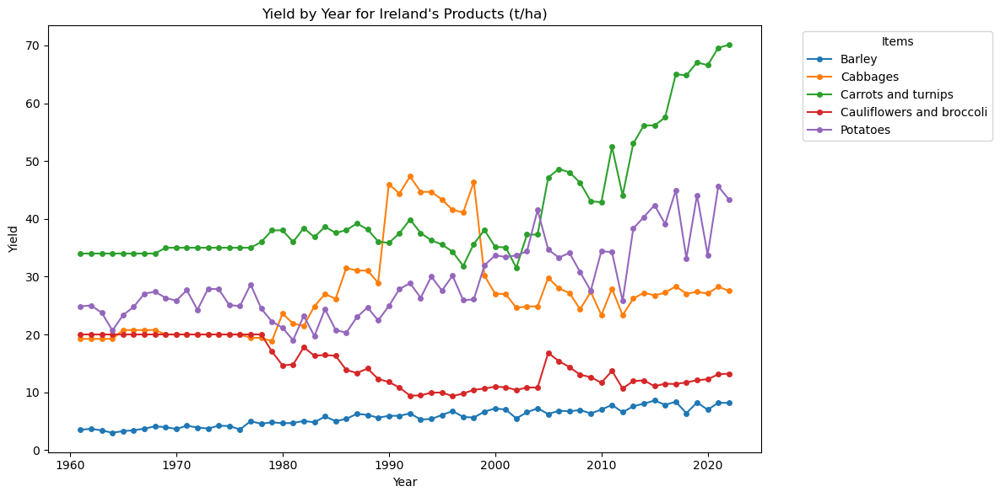

In [73]:
# .groupby() groups the data by the combination of Year and Item and 
#.sum().unstack() Aggregates the Yield column by summing values for each combination of Year and Item.
ireland_yield2 = ireland_yield.groupby(['Year', 'Item'])['Yield'].sum().unstack()
#Create a graph
ireland_yield2.plot(figsize=(12, 6), marker='o', markersize=4, linewidth=1.5, title="Yield by Year for Ireland's Products (t/ha)")
plt.xlabel("Year")
plt.ylabel("Yield")
plt.legend(title="Items", bbox_to_anchor=(1.05, 1), loc='upper left')
plt.tight_layout()
plt.show()

This line graph shows the yield trends of five selected crops in Ireland from 1961 to 2022. Based on the graph:
X-axis shows the timeline from 1961 to 2022.
Y-axis shows the yield in tonnes per hectare (t/ha). 

- `Barley` : Its yield slowly increases over time.
- `Cabbages` : The yield has small ups and downs. There is a peak in the late 1990s, likely due to changes in farming or the environment, but it drops around 2000.
- `Carrots and Turnips` : These have the highest yields among the crops. The yield steadily increases in the 2000s, with some small fluctuations.
- `Cauliflowers and Broccoli` : The yield stays mostly flat, with small improvements after the 1990s. They have lower yields than carrots and potatoes.
- `Potatoes` : The yield changes a lot over the years, with big peaks and dips. Even with the fluctuations, potatoes have higher yields than barley and cabbages.

Overall, while there are fluctuations and trends specific to each crop, carrots and turnips consistently outperform in yield, followed by potatoes..

`Analyze-2` : I want to analyze the trade ratio of products in Ireland from 1961 to 2022. It will show which products Ireland is dependent on foreign countries.

In [76]:
# Created a new DataFrame by Combining Year, Area, Item and Trade Ratio Columns
ireland_trade_ratio = pd.concat([df5["Year"], df5["Area"], df5["Item"], df6_trade_ratio ], axis=1)
ireland_trade_ratio.head()

,Year,Area,Item,Trade Ratio
0,1961,France,Barley,0.000055
1,1961,France,Cabbages,0.002723
2,1961,France,Carrots and turnips,0.012193
3,1961,France,Cauliflowers and broccoli,0.000165
4,1961,France,Leeks and allies,0.000000


In [77]:
#This line filters the DataFrame to include only rows where the value in the Area column is exactly "Ireland".
ireland_trade_ratio = ireland_trade_ratio[ireland_trade_ratio['Area'] == 'Ireland']
# The .isin() method checks if the values in the Item column are part of the specified list:
ireland_trade_ratio = ireland_trade_ratio[ireland_trade_ratio['Item'].isin(['Leeks and allies', 'Oats', 'Onions and shallots',
                                                                           'Wheat'])]
ireland_trade_ratio.head()

,Year,Area,Item,Trade Ratio
26,1961,Ireland,Leeks and allies,NaN
27,1961,Ireland,Oats,0.059848
28,1961,Ireland,Onions and shallots,0.399000
32,1961,Ireland,Wheat,0.558798
70,1962,Ireland,Leeks and allies,NaN


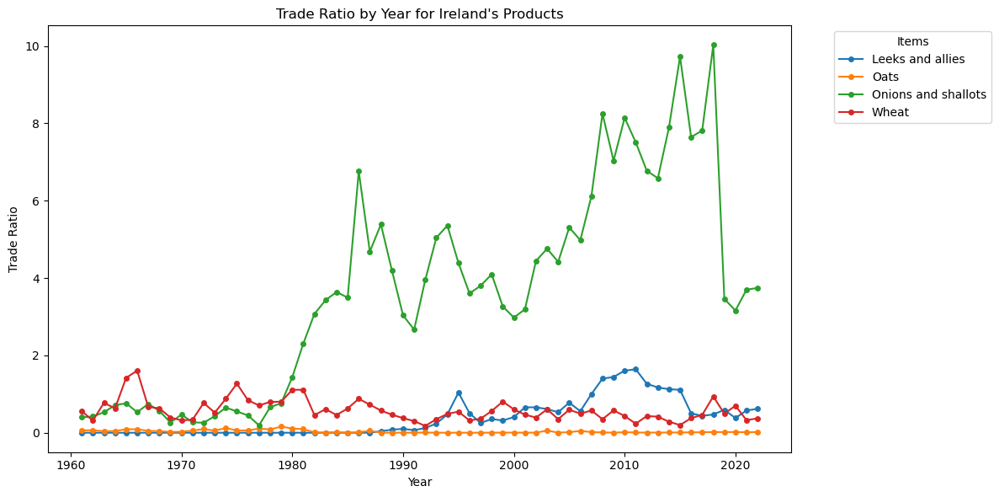

In [78]:
# .groupby() groups the data by the combination of Year and Item and 
#.sum().unstack() Aggregates the Trade Ratio column by summing values for each combination of Year and Item.
ireland_trade_ratio2 = ireland_trade_ratio.groupby(['Year', 'Item'])['Trade Ratio'].sum().unstack()
#Create a graph
ireland_trade_ratio2.plot(figsize=(12, 6), marker='o', markersize=4, linewidth=1.5, title="Trade Ratio by Year for Ireland's Products")
plt.xlabel("Year")
plt.ylabel("Trade Ratio")
plt.legend(title="Items", bbox_to_anchor=(1.05, 1), loc='upper left')
plt.tight_layout()
plt.show()

The chart above shows the trade ratio of some products in Ireland from 1961 to 2022. A trade ratio close to 0 means the country is self-sufficient for that product. A ratio close to or greater than 1 means the country depends a lot on imports. Based on the graph:

X-axis: Shows the years from 1961 to 2022.
Y-axis: Shows the trade ratio for each product.

- `Leeks & Allies, Oats & Wheat` : Their trade ratio stays stable, meaning Ireland is mostly self-sufficient or has minimal import dependence.
- `Onions and Shallots` : Their trade ratio increases a lot, especially from 1990 to end of 2018, showing more dependence on imports.

Big changes in the trade ratio may happen because of policy changes, market shifts, or changes in production, exports, or imports.
d

`Analyze-3` : Additionaly, I want to analyze the export and import prices for some agricultural products in Ireland from 1961 to 2022. It will help to see clearly difference of prices between export and import.

In [81]:
# Created a new DataFrame by Combining Year, Area, Item, Export Price and Import Price Columns
ireland_price = pd.concat([df5["Year"], df5["Area"], df5["Item"], df6_export_price, df6_import_price ], axis=1)
ireland_price.head()

,Year,Area,Item,Export Price,Import Price
0,1961,France,Barley,0.206855,0.133333
1,1961,France,Cabbages,0.085438,0.065231
2,1961,France,Carrots and turnips,0.091749,0.127688
3,1961,France,Cauliflowers and broccoli,0.062231,0.126761
4,1961,France,Leeks and allies,NaN,NaN


In [82]:
# This line filters the DataFrame to include only rows where the value in the Area column is exactly "Ireland".
ireland_price = ireland_price[ireland_price['Area'] == 'Ireland']
# The .isin() method checks if the values in the Item column are part of the specified list:
ireland_price = ireland_price[ireland_price['Item'].isin(['Onions and shallots', 'Potatoes','Oats'])]
ireland_price.head()

,Year,Area,Item,Export Price,Import Price
27,1961,Ireland,Oats,0.057078,0.074915
28,1961,Ireland,Onions and shallots,0.073171,0.105979
29,1961,Ireland,Potatoes,0.050691,NaN
71,1962,Ireland,Oats,0.063315,0.073734
72,1962,Ireland,Onions and shallots,0.102128,0.143637


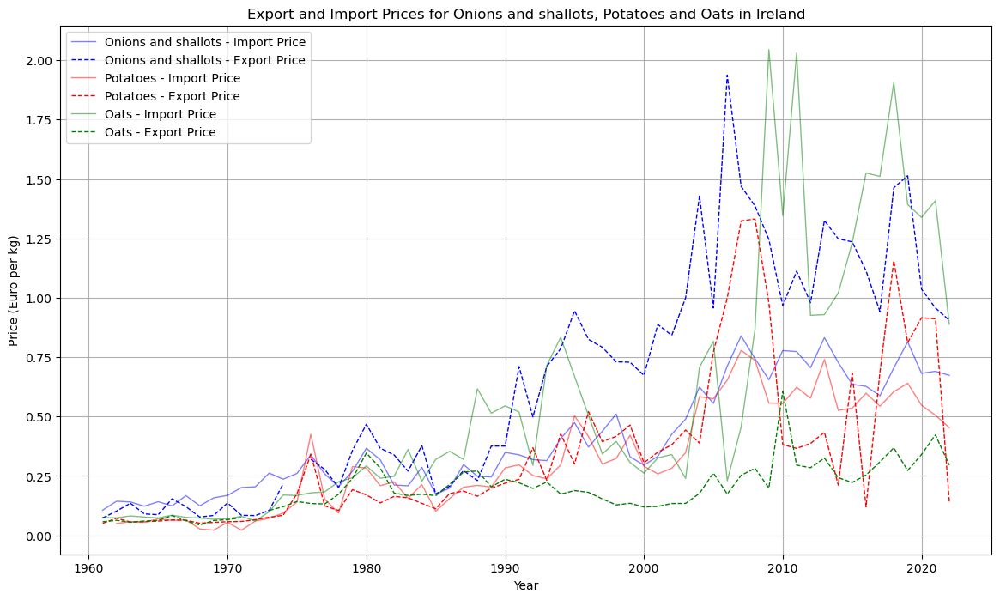

In [83]:
# Graph size
plt.figure(figsize=(14, 8))
# Create a list which include products
items = ['Onions and shallots', 'Potatoes', 'Oats']
# Create a dictionary which include colors
colors = {'Onions and shallots': 'blue', 'Potatoes': 'red', 'Oats' : 'green'}

for item in items:
    subset = ireland_price[ireland_price['Item'] == item]
    
    # Plot Export Price
    plt.plot(subset['Year'], subset['Import Price'], label=f'{item} - Import Price', color=colors[item], alpha=0.5, linewidth=1, linestyle='-')
     
    # Plot Import Price
    plt.plot(subset['Year'], subset['Export Price'], label=f'{item} - Export Price', color=colors[item], linewidth=1, linestyle='--')


# Customize the chart
plt.title("Export and Import Prices for Onions and shallots, Potatoes and Oats in Ireland")
plt.xlabel("Year")
plt.ylabel("Price (Euro per kg)")
plt.legend()
plt.grid()
plt.show()

The chart shows the export and import prices of some products in Ireland from 1961 to 2022, measured in euros per kilogram.

X-axis: Shows the years from 1961 to 2022.
Y-axis: Shows the prices in euros per kilogram for each product.

- `Onions and Shallots` : Import prices rise steadily from the 1960s to 2020, with a big increase after 2000, peaking around 2010–2020. Export prices were higher than import prices until the 1990s. After 2000, export prices fluctuate a lot and fall below import prices in recent years, showing possible trade issues or reduced competitiveness.
- `Potatoes` : Import prices rise steadily, with spikes in the 1980s and 2000s, but are lower than onions and oats most years. Export prices are slightly higher than import prices until the 1990s, but the difference becomes smaller in recent years, showing more balanced trade.
- `Oats` : Import prices increase steadily but have big ups and downs after the 1990s. Peaks happen between 2000–2010, showing higher import costs. Export prices are close to import prices early on but rise sharply after the 1990s. After 2000, export prices vary a lot and sometimes go very high, suggesting oats became a premium export product.

Import prices for all crops are rising, which may be due to higher global trade costs or lower domestic production. Export prices, especially for oats and onions, fluctuate a lot, showing market or trade changes..

### Comparing of agricultural products in Europe

In this section, we will compare certain agricultural data in Ireland with selected European countries, focusing on metrics such as yield and trade balance over the years. Various visualization techniques will be employed to better understand the relationships within the data. For visualization, I will use a bar chart. Bar charts are effective for comparing production across countries in specific years. They emphasize the magnitude of differences by focusing on the heights of the bars, making them suitable for highlighting variations in production rather than trends over time.The bar chart works well when focusing on discrete comparisons, like every 5 years.

`Compare -1` : I aim to compare the changes in production value and yield of potatoes in Ireland with those in France, Germany, and the Netherlands between 2000 and 2020. To visualize this, I will first create a new DataFrame containing the columns: 'Year,' 'Area,' 'Item,' 'Production,' and 'Yield.' Then, I will filter the 'Item' column to retain only data related to potatoes. I will also adjust the dataset to include only data within the 2000-2020 time interval.

In [88]:
# Create a DataFrame which include some columns.
europe_yield = pd.concat([df5["Year"], df5["Area"], df5["Item"], df5["Production"], df6_yield], axis=1)
europe_yield.head()

,Year,Area,Item,Production,Yield
0,1961,France,Barley,5412790.0,11.928389
1,1961,France,Cabbages,596720.0,23.875485
2,1961,France,Carrots and turnips,606350.0,23.870168
3,1961,France,Cauliflowers and broccoli,429800.0,17.002255
4,1961,France,Leeks and allies,392370.0,29.543709


In [89]:
# Chose specific item in selected column
europe_yield = europe_yield[europe_yield['Item'] == 'Potatoes']
# Sdjust the year interval from 2000 to 2025, with steps of 5 years, 
europe_yield = europe_yield[europe_yield['Year'].isin(range(2000, 2025, 5))]
europe_yield.head()

,Year,Area,Item,Production,Yield
1723,2000,France,Potatoes,6440483.100,39.598652
1734,2000,Germany,Potatoes,7936480.875,26.074252
1745,2000,Ireland,Potatoes,454800.000,33.688889
1756,2000,Netherlands,Potatoes,7936480.875,44.042624
1943,2005,France,Potatoes,6604600.000,42.222691


In [90]:
# Groups the data by the combination of Year and Area and aggregates the Production column by summing values for each combination of Year and Area.
europe_production_filtered = europe_yield.groupby(['Year', 'Area'])['Production'].sum().unstack()
# Groups the data by the combination of Year and Area and aggregates the Yield column by summing values for each combination of Year and Area.
europe_yield_filtered = europe_yield.groupby(['Year', 'Area'])['Yield'].sum().unstack()

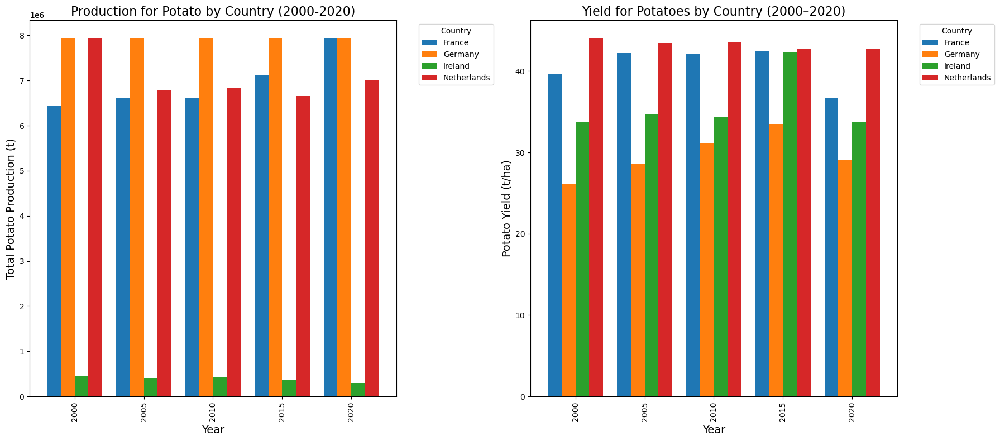

In [91]:
# Create a figure with two subplots (1 row, 2 columns) and set the figure size
fig, axes = plt.subplots(nrows=1, ncols=2, figsize=(18, 8))

# Plot the production data on the left subplot
europe_production_filtered.plot(
    kind='bar', ax=axes[0], width=0.8  # Create a bar chart with specified bar width
)
axes[0].set_title('Production for Potato by Country (2000-2020)', fontsize=16)  # Set the title of the left plot
axes[0].set_xlabel('Year', fontsize=14)  # Label the x-axis
axes[0].set_ylabel('Total Potato Production (t)', fontsize=14)  # Label the y-axis
axes[0].legend(title='Country', bbox_to_anchor=(1.05, 1), loc='upper left')  # Place the legend outside the plot

# Plot the yield data on the right subplot
europe_yield_filtered.plot(
    kind='bar', ax=axes[1], width=0.8  # Create a bar chart with specified bar width
)
axes[1].set_title('Yield for Potatoes by Country (2000–2020)', fontsize=16)  # Set the title of the right plot
axes[1].set_xlabel('Year', fontsize=14)  # Label the x-axis
axes[1].set_ylabel('Potato Yield (t/ha)', fontsize=14)  # Label the y-axis
axes[1].legend(title='Country', bbox_to_anchor=(1.05, 1), loc='upper left')  # Place the legend outside the plot

# Adjust the layout to prevent overlap of plot elements
plt.tight_layout()

# Display the plots
plt.show()

- `Graph - 1` : This graph shows the total potato production (measured in tons) over time for four countries. Ireland has the lowest total potato production compared to the other countries throughout the years from 2000 to 2020. While other countries (like Germany and France) have significantly higher production values, Ireland's potato production remains relatively stable and low in comparison.
-  `Graph - 2` : This graph illustrates potato yield (measured in tons per hectare) for the same countries over time. Ireland's potato yield appears consistently lower than that of the Netherlands and France. However, it is higher than or comparable to Germany's yield during certain years.The yield per hectare is moderate, indicating reasonable efficiency in potato farming but limited production capacity, possibly due to smaller agricultural land devoted to potatoes. 

`Compare -2` : I plan to focus on the trade balance of countries' products, specifically "Rye" and "Sugar Beet," between 2000 and 2020. The goal is to compare their trade balance trends over this period.

In [94]:
# Combine relevant columns and data into a single DataFrame for Europe trade balance
europe_trade_balance = pd.concat([df5["Year"], df5["Area"], df5["Item"], df6_trade_balance], axis=1)
europe_trade_balance.head()

,Year,Area,Item,Trade Balance
0,1961,France,Barley,88640.0
1,1961,France,Cabbages,794.0
2,1961,France,Carrots and turnips,-130.0
3,1961,France,Cauliflowers and broccoli,5440.0
4,1961,France,Leeks and allies,0.0


In [95]:
# Filter rows where 'Item' is either 'Rye' or 'Sugar beet'
europe_trade_balance  = europe_trade_balance[europe_trade_balance['Item'].isin(['Rye', 'Sugar beet'])]
# Filter rows where 'Year' is in the range 2000 to 2020, stepping by 5 years
europe_trade_balance  = europe_trade_balance [europe_trade_balance ['Year'].isin(range(2000, 2020, 5))]
europe_trade_balance.head()

,Year,Area,Item,Trade Balance
1724,2000,France,Rye,2891.0
1725,2000,France,Sugar beet,582.0
1735,2000,Germany,Rye,102316.0
1736,2000,Germany,Sugar beet,172.0
1746,2000,Ireland,Rye,-92.0


In [96]:
# Select Rye item in the Item column and groups the data by the combination of Year and Area and 
# aggregates the Trade Balance column by summing values for each combination of Year and Area.
europe_trade_balance_rye = (europe_trade_balance[europe_trade_balance['Item'] == 'Rye'].groupby(['Year', 'Area'])['Trade Balance'].sum().unstack())
# Select Sugar beet item in the Item column and groups the data by the combination of Year and Area and 
# aggregates the Trade Balance column by summing values for each combination of Year and Area.
europe_trade_balance_sugar_beet = (europe_trade_balance[europe_trade_balance['Item'] == 'Sugar beet'].groupby(['Year', 'Area'])['Trade Balance'].sum().unstack())

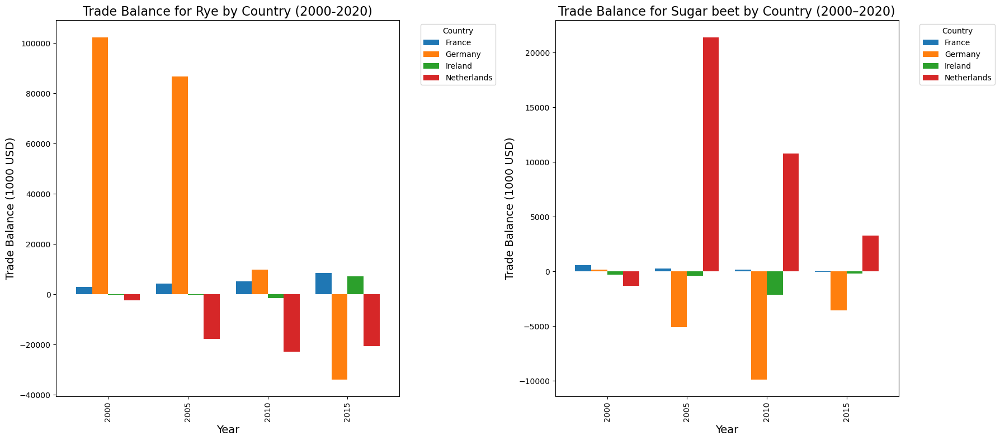

In [97]:
# Create a new figure for trade balance plots
fig, axes = plt.subplots(nrows=1, ncols=2, figsize=(18, 8))

# Plot trade balance for Rye
europe_trade_balance_rye.plot(
    kind='bar', ax=axes[0], width=0.8  # Create a bar chart with specified bar width
)
axes[0].set_title('Trade Balance for Rye by Country (2000-2020)', fontsize=16)  # Set the title of the left plot
axes[0].set_xlabel('Year', fontsize=14)  # Label the x-axis
axes[0].set_ylabel('Trade Balance (1000 USD)', fontsize=14)  # Label the y-axis
axes[0].legend(title='Country', bbox_to_anchor=(1.05, 1), loc='upper left')  # Place the legend outside the plot

# Plot trade balance for Sugar beet
europe_trade_balance_sugar_beet.plot(
    kind='bar', ax=axes[1], width=0.8  # Create a bar chart with specified bar width
)
axes[1].set_title('Trade Balance for Sugar beet by Country (2000–2020)', fontsize=16)  # Set the title of the right plot
axes[1].set_xlabel('Year', fontsize=14)  # Label the x-axis
axes[1].set_ylabel('Trade Balance (1000 USD)', fontsize=14)  # Label the y-axis
axes[1].legend(title='Country', bbox_to_anchor=(1.05, 1), loc='upper left')  # Place the legend outside the plot

# Adjust the layout to prevent overlap of plot elements
plt.tight_layout()

# Display the plots
plt.show()


- `Graph - 1` : This graph shows how much money each country made or lost trading rye from 2000 to 2020. Ireland's trade balance is very small compared to other countries. It stays close to zero, meaning Ireland neither makes much profit nor suffers big losses from rye trade. Germany shows the largest trade balance, with big profits, especially in earlier years. The Netherlands often shows losses, with its trade balance going below zero.
- `Graph - 2` :This graph shows the money made or lost trading sugar beet from 2000 to 2020.Ireland has a very small trade balance, again close to zero, meaning sugar beet trade is not a major activity for the country.The Netherlands shows very high trade profits, especially in the middle years.Germany has negative trade balances (losses) in several years.

  Overall, This indicates that rye and sugar beet are not major agricultural products for Ireland compared to its European neighbors.Ireland’s agricultural trade strategy appears to focus on other sectors rather than competing in the rye and sugar beet markets.ars.ero.ro.

`Compare -3` : Additionally, I want to compare the export and import prices of cabbages across all countries between 2000 and 2020, at 5-year intervals.

In [100]:
# Combine relevant columns into a single DataFrame for Europe price data.
europe_price = pd.concat([df5["Year"], df5["Area"], df5["Item"], df6_export_price, df6_import_price], axis=1) # Concatenate along the columns
europe_price.head()

,Year,Area,Item,Export Price,Import Price
0,1961,France,Barley,0.206855,0.133333
1,1961,France,Cabbages,0.085438,0.065231
2,1961,France,Carrots and turnips,0.091749,0.127688
3,1961,France,Cauliflowers and broccoli,0.062231,0.126761
4,1961,France,Leeks and allies,NaN,NaN


In [101]:
# Filter rows where the 'Item' column is equal to 'Cabbages'
europe_price  = europe_price[europe_price['Item'] == 'Cabbages']
# Filter rows where 'Year' is in the range 2000 to 2023, stepping by 5 years (2000, 2005, 2010, 2020)
europe_price  = europe_price [europe_price ['Year'].isin(range(2000, 2023, 5))]
europe_price.head()

,Year,Area,Item,Export Price,Import Price
1717,2000,France,Cabbages,0.643076,0.397808
1728,2000,Germany,Cabbages,0.229280,0.562088
1739,2000,Ireland,Cabbages,0.511278,0.445921
1750,2000,Netherlands,Cabbages,0.360783,0.554617
1937,2005,France,Cabbages,0.866423,0.683892


In [102]:
# Groups the data by the combination of Year and Area and aggregates the Export Price column by summing values for each combination of Year and Area.
europe_export_price = europe_price.groupby(['Year', 'Area'])['Export Price'].sum().unstack()
# Groups the data by the combination of Year and Area and aggregates the Import Price column by summing values for each combination of Year and Area.
europe_import_price = europe_price.groupby(['Year', 'Area'])['Import Price'].sum().unstack()

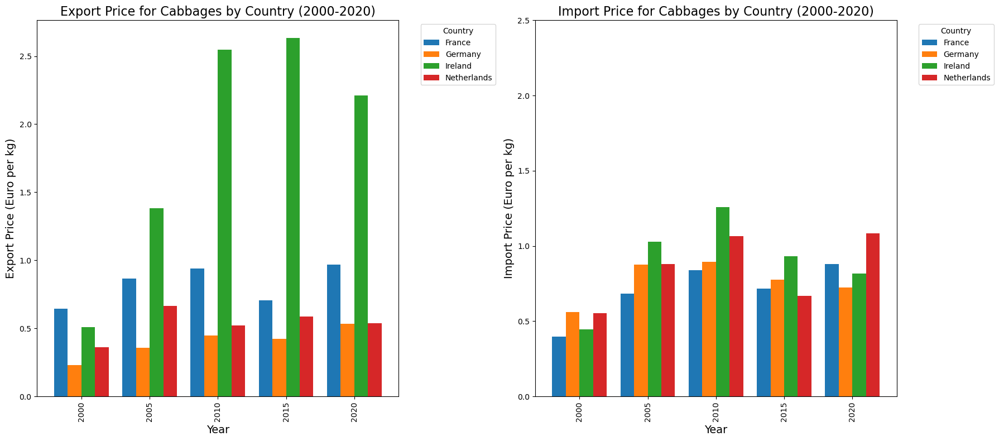

In [103]:
# Create a new figure for export and import price plots
fig, axes = plt.subplots(nrows=1, ncols=2, figsize=(18, 8))

# Plot export price for Cabbages
europe_export_price.plot(
    kind='bar', ax=axes[0], width=0.8  # Create a bar chart with specified bar width
)
axes[0].set_title('Export Price for Cabbages by Country (2000-2020)', fontsize=16)  # Set the title of the left plot
axes[0].set_xlabel('Year', fontsize=14)  # Label the x-axis
axes[0].set_ylabel('Export Price (Euro per kg)', fontsize=14)  # Label the y-axis
axes[0].legend(title='Country', bbox_to_anchor=(1.05, 1), loc='upper left')  # Place the legend outside the plot

# Plot import price for Cabbages
europe_import_price.plot(
    kind='bar', ax=axes[1], width=0.8  # Create a bar chart with specified bar width
)
axes[1].set_title('Import Price for Cabbages by Country (2000-2020)', fontsize=16)  # Set the title of the right plot
axes[1].set_xlabel('Year', fontsize=14)  # Label the x-axis
axes[1].set_ylabel('Import Price (Euro per kg)', fontsize=14)  # Label the y-axis
axes[1].set_ylim(0, 2.5)  # Set y-axis limits for better visualization
axes[1].legend(title='Country', bbox_to_anchor=(1.05, 1), loc='upper left')  # Place the legend outside the plot

# Adjust the layout to prevent overlap of plot elements
plt.tight_layout()

# Display the plots
plt.show()


- `Graph - 1` : Ireland, especially after 2005, has had the highest export price for cabbage in most years compared to France, Germany, and the Netherlands.This suggests that Irish cabbages may be of higher quality, in greater demand, or involve higher production/export costs.The high price could also indicate that Ireland exports smaller quantities but demands a premium for its cabbages.
- `Graph - 2` : Ireland's cabbage import price is moderate compared to other countries. Most years, it is close to or slightly higher than France and Germany.This means Ireland exports cabbages at a high price but imports them at an average or low price.
This might be to balance local supply and demand by buying cheaper cabbages.This could reflect a trade strategy where premium goods are sold abroad while  more affordable options are importe.d

### Checking for Correlation in Statistical Columns

- In this section, I focus on numerical columns to explore the relationships between them. First, I use a heatmap to visualize the correlation between each pair of columns. After identifying columns with strong correlations, I will examine them in detail using scatter plots.
I chose scatter plots because they effectively show the direction of relationships, whether positive or negative. Additionally, scatter plots can reveal nonlinear patterns, such as curves or clusters, that might be overlooked with numerical summaries alone. They also make it easy to identify outliers—data points that deviate from the general trend.

                 Area Harvested  Production  Export Quantity  Export Value  \
Area Harvested         1.000000    0.832746         0.504559      0.383087   
Production             0.832746    1.000000         0.606076      0.494774   
Export Quantity        0.504559    0.606076         1.000000      0.909649   
Export Value           0.383087    0.494774         0.909649      1.000000   
Import Quantity        0.421401    0.470340         0.582564      0.513649   
Import Value           0.257761    0.345250         0.543357      0.556040   
Yield                 -0.295258    0.062908         0.070219      0.123909   
Trade Ratio           -0.161022   -0.160565        -0.117468     -0.115499   
Trade Balance          0.070250    0.076649         0.245215      0.316687   
Export Price          -0.315356   -0.283283        -0.247006     -0.113002   
Import Price          -0.321239   -0.295699        -0.193446     -0.008968   

                 Import Quantity  Import Value     Yield  Trade

<Axes: >

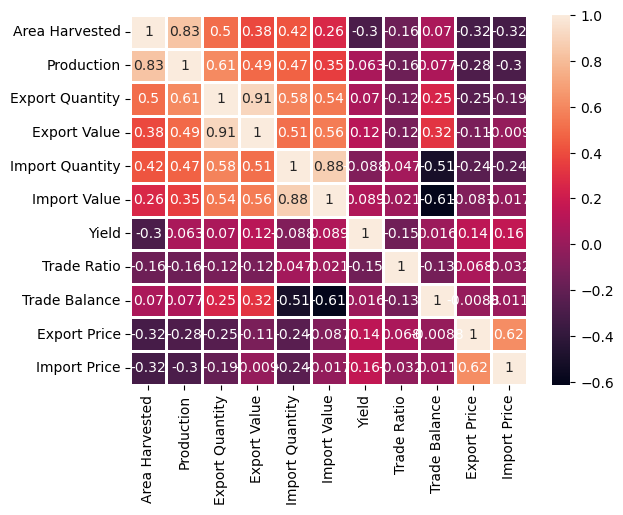

In [107]:
# Combine along columns
coralation = pd.concat([df5["Area Harvested"], df5["Production"], df5["Export Quantity"], 
                        df5["Export Value"], df5["Import Quantity"], df5["Import Value"],df6_yield,
                       df6_trade_ratio, df6_trade_balance, df6_export_price, df6_import_price], axis=1).corr()
 # Checked relationship between two variables
print(coralation)
sns.heatmap(coralation,annot=True,lw=1)

`Area Harvested and Production (0.83)` : As more land is used for farming, production tends to increase.

`Export Quantity and Export Value (0.91)` : Higher quantities of exported goods strongly lead to higher export revenues.

`Import Quantity and Import Value (0.88)` : A similar relationship exists for imports.


**Trade Strategy** : Ireland can improve trade by exporting high-value products and managing imports wisely to save money.

**Efficient Land Use** : Since higher yields are linked to smaller farmland, Ireland should focus on farming more efficiently instead of using more land.

**Market Dynamics** : Export prices can change with production levels, so Ireland needs to balance how much it produces with market demand to stay profitable.

`Correlation - 1  : Production and Area Harvested`

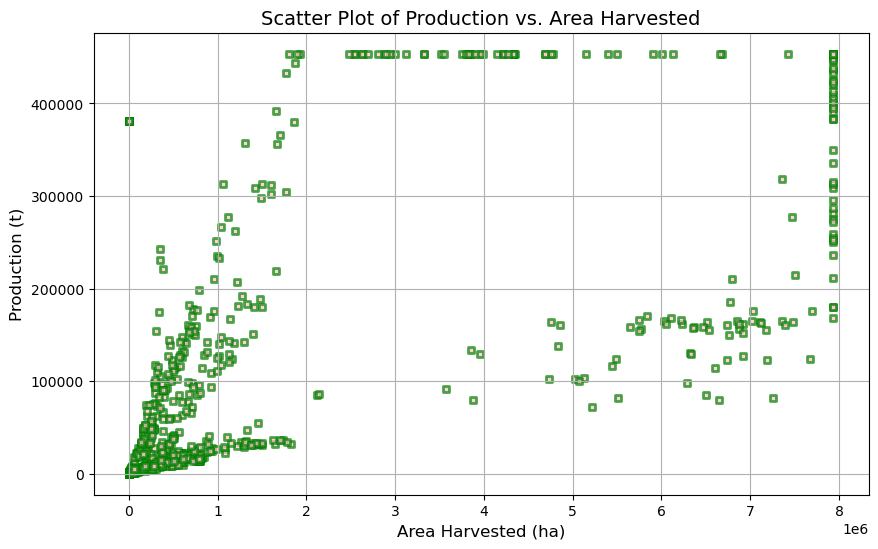

In [110]:
# Set the figure size for the plot
plt.figure(figsize=(10, 6))

# Create a scatter plot with 1000 random samples from 'Production' and 'Area Harvested' columns
plt.scatter(
    df5.sample(n=1000, random_state=42)["Production"],  # X-axis: Production data
    df5.sample(n=1000, random_state=42)["Area Harvested"],  # Y-axis: Area Harvested data
    alpha=0.7,  # Set transparency of points
    c="pink",  # Set the color of points to pink
    linewidths=2,  # Width of marker edges
    marker="s",  # Use square markers for points
    edgecolor="green",  # Set edge color of the markers to green
    s=15  # Size of each marker
)

# Set the title of the scatter plot
plt.title("Scatter Plot of Production vs. Area Harvested", fontsize=14)

# Label the X-axis
plt.xlabel("Area Harvested (ha)", fontsize=12)

# Label the Y-axis
plt.ylabel("Production (t)", fontsize=12)

# Add a grid to the plot for better readability
plt.grid(True)

# Display the plot
plt.show()


- This scatter plot shows the relationship between Production (in tons) and Area Harvested (in hectares).There is a general positive relationship: as the area harvested increases, production also tends to increase. This makes sense because more land used for farming typically leads to higher output.However, as the harvested area gets very large (closer to the right side of the x-axis), the increase in production slows down. This might mean that adding more land doesn't always lead to much higher production.

`Correlation - 2  : Export Quantity and Export Value`

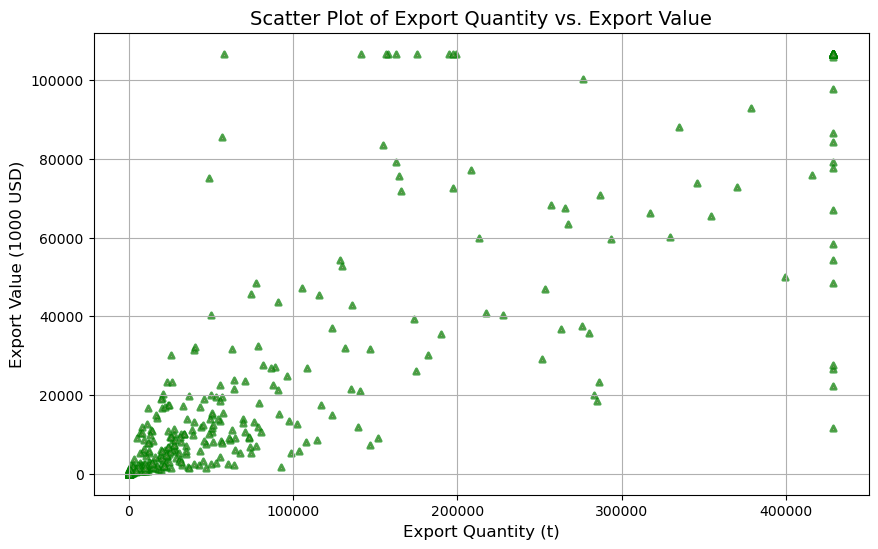

In [113]:
# Set the figure size for the plot
plt.figure(figsize=(10, 6))

# Create a scatter plot with 500 random samples from 'Export Quantity' and 'Export Value' columns
plt.scatter(
    df5.sample(n=500, random_state=42)["Export Quantity"],  # X-axis: Export Quantity data
    df5.sample(n=500, random_state=42)["Export Value"],  # Y-axis: Export Value data
    alpha=0.7,  # Set transparency of points
    c="pink",  # Set the color of points to pink
    linewidths=2,  # Width of marker edges
    marker="^",  # Use triangle markers for points
    edgecolor="green",  # Set edge color of the markers to green
    s=15  # Size of each marker
)

# Set the title of the scatter plot
plt.title("Scatter Plot of Export Quantity vs. Export Value", fontsize=14)

# Label the X-axis
plt.xlabel("Export Quantity (t)", fontsize=12)

# Label the Y-axis
plt.ylabel("Export Value (1000 USD)", fontsize=12)

# Add a grid to the plot for better readability
plt.grid(True)

# Display the plot
plt.show()


- This scatter plot shows the relationship between Export Quantity (in tons) and Export Value (in 1000 USD).There is a general upward trend: as export quantity increases, the export value also increases. This indicates a positive relationship between the two variables.For smaller export quantities (left side of the graph, below 100,000 tons), there is a lot of variation in export value. Some points show high export values even with lower quantities, which could be due to higher prices or premium products.As export quantities increase beyond 300,000 tons, export values tend to stabilize at higher levels, suggesting bulk exports with relatively lower prices per unit.

`Correlation - 3  : Import Quantity and Import Value`

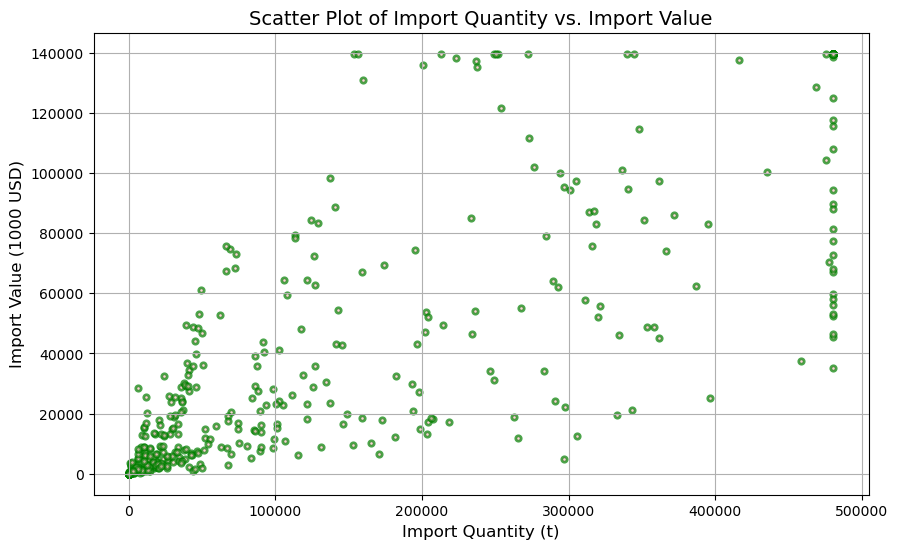

In [116]:
# Set the figure size for the plot
plt.figure(figsize=(10, 6))

# Create a scatter plot with 500 random samples from 'Import Quantity' and 'Import Value' columns
plt.scatter(
    df5.sample(n=500, random_state=42)["Import Quantity"],  # X-axis: Import Quantity data
    df5.sample(n=500, random_state=42)["Import Value"],  # Y-axis: Import Value data
    alpha=0.7,  # Set transparency of points
    c="pink",  # Set the color of points to pink
    linewidths=2,  # Width of marker edges
    marker="o",  # Use circular markers for points
    edgecolor="green",  # Set edge color of the markers to green
    s=15  # Size of each marker
)

# Set the title of the scatter plot
plt.title("Scatter Plot of Import Quantity vs. Import Value", fontsize=14)

# Label the X-axis
plt.xlabel("Import Quantity (t)", fontsize=12)

# Label the Y-axis
plt.ylabel("Import Value (1000 USD)", fontsize=12)

# Add a grid to the plot for better readability
plt.grid(True)

# Display the plot
plt.show()


- This scatter plot shows the relationship between Import Quantity (in tons) and Import Value (in 1000 USD).There is a general upward trend, showing that as import quantity increases, the import value also rises.This is expected because importing larger quantities usually leads to higher total costs.
For lower import quantities (on the left side of the graph, under 100,000 tons), there is significant variation in import value.
Some points show very high import values despite smaller quantities, suggesting:

  - High-priced or premium goods are being imported in small amounts.
  - These might be specialty products or items with high per-unit costs.

In [118]:
#pip install dash plotly pandas

### European Agriculture Statistics Map Over Year

In [120]:
# Initialize the app
app = Dash(__name__)

# Filter data for European countries
european_countries = [
    "Austria", "Belgium", "Bulgaria", "Croatia", "Czech Republic", "Denmark", 
    "Estonia", "Finland", "France", "Germany", "Greece", "Hungary", 
    "Ireland", "Italy", "Latvia", "Lithuania", "Luxembourg", 
    "Malta", "Netherlands", "Poland", "Portugal", "Romania", "Slovakia", 
    "Slovenia", "Spain", "Sweden"
]
europe_data = df5[df5['Area'].isin(european_countries)]

# List of columns to choose from
columns = [
    "Area Harvested", "Production", "Export Quantity", 
    "Export Value", "Import Quantity", "Import Value"
]

# Save a static graph to HTML
def save_static_html(selected_metric="Production"):
    fig = px.scatter_geo(
        europe_data,
        locations='Area',               # Name of countries
        locationmode='country names',   # Match country names to geographical data
        size=selected_metric,           # Circle size based on the selected metric
        color=selected_metric,          # Color based on the selected metric
        animation_frame='Year',         # Add Year for animated visualization
        color_continuous_scale='Viridis', # Color scale
        title=f'{selected_metric} in Europe Over Years',
        labels={selected_metric: f'{selected_metric} (units)'}
    )
    fig.update_geos(
        showcountries=True,
        scope='europe',  # Focus on Europe
        showcoastlines=True,
        coastlinecolor="Black",
        showland=True,
        landcolor="LightGrey",
        showframe=False
    )
    fig.write_html("europe_agriculture_statistics.html")
    print("HTML file saved as 'europe_agriculture_statistics.html'.")

# Call the function to save as HTML
save_static_html()

# Layout of the app
app.layout = html.Div([
    html.H1("European Agriculture Statistics Map"),
    html.Label("Select a Metric:"),
    dcc.Dropdown(
        id='metric-dropdown',
        options=[{'label': col, 'value': col} for col in columns],
        value='Production'  # Default selected value
    ),
    dcc.Graph(
        id='map-graph',
        style={'width': '100%', 'height': '900px'}  # Full width and large height
    )
])

# Callback to update the map based on the selected metric
@app.callback(
    Output('map-graph', 'figure'),
    [Input('metric-dropdown', 'value')]
)
def update_map(selected_metric):
    fig = px.scatter_geo(
        europe_data,
        locations='Area',               # Name of countries
        locationmode='country names',   # Match country names to geographical data
        size=selected_metric,           # Circle size based on the selected metric
        color=selected_metric,          # Color based on the selected metric
        animation_frame='Year',         # Add Year for animated visualization
        color_continuous_scale='Viridis', # Color scale
        title=f'{selected_metric} in Europe Over Years',
        labels={selected_metric: f'{selected_metric} (units)'}
    )
    fig.update_geos(
        showcountries=True,
        scope='europe',  # Focus on Europe
        showcoastlines=True,
        coastlinecolor="Black",
        showland=True,
        landcolor="LightGrey",
        showframe=False
    )
    # Update layout to enlarge the map
    fig.update_layout(
        width=1100,   # Width of the map in pixels
        height=650,   # Height of the map in pixels
        title={
            'x': 0.5,  # Center the title
            'xanchor': 'center'
        }
    )
    return fig

# Function to open the browser
def open_browser():
    webbrowser.open_new("http://127.0.0.1:8051/")

# Run the app with the browser opening automatically
if __name__ == '__main__':
    Timer(1, open_browser).start()  # Open the browser after a 1-second delay
    app.run_server(debug=True, port=8051)

HTML file saved as 'europe_agriculture_statistics.html'.


### European Agriculture Item's Map Over Year

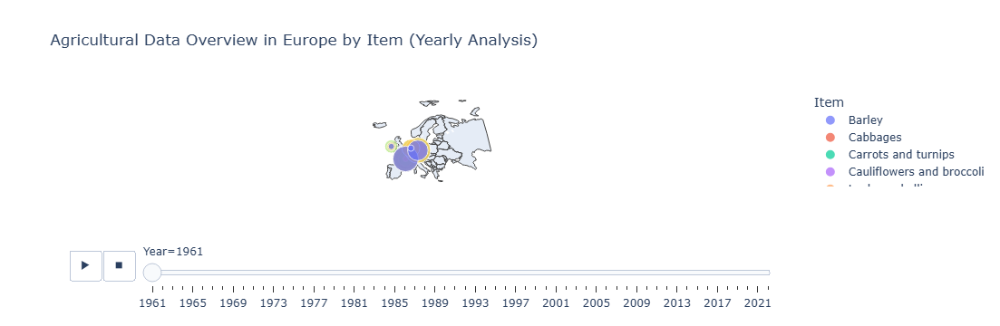

True

In [122]:
# Filter data for European countries
european_countries = [
    "Austria", "Belgium", "Bulgaria", "Croatia", "Czech Republic", "Denmark", 
    "Estonia", "Finland", "France", "Germany", "Greece", "Hungary", 
    "Ireland", "Italy", "Latvia", "Lithuania", "Luxembourg", 
    "Malta", "Netherlands", "Poland", "Portugal", "Romania", "Slovakia", 
    "Slovenia", "Spain", "Sweden"
]
europe_selected_countries = [ "Ireland", "Germany", "Netherlands", "France" ]
europe_data = df5[df5['Area'].isin(europe_selected_countries)]

# Create a map with item as a selectable category
fig_europe_item = px.scatter_geo(
    europe_data,
    locations="Area",  # Column used for geographic locations
    locationmode="country names",  # Mode to interpret locations as country names
    size="Production",  # Bubble size based on production values
    color="Item",  # Bubble color representing the item type
    animation_frame="Year",  # Creates a slider for year-based animation
    hover_name="Area",  # Area name appears on hover
    hover_data={  # Additional details shown on hover
        "Area Harvested": True,  # Include 'Area Harvested' in hover
        "Production": True,  # Include 'Production' in hover
        "Export Quantity": True,  # Include 'Export Quantity' in hover
        "Export Value": True,  # Include 'Export Value' in hover
        "Import Quantity": True,  # Include 'Import Quantity' in hover
        "Import Value": True,  # Include 'Import Value' in hover
        "Area": False,  # Exclude 'Area' from hover
        "Year": False,  # Exclude 'Year' from hover
        "Item": True  # Include 'Item' in hover
    },
    title="Agricultural Data Overview in Europe by Item (Yearly Analysis)",  # Map title
    projection="natural earth"  # Uses a "natural earth" map projection
)

fig_europe_item.update_layout(
    legend_title="Item",  # Title for the legend
    geo_scope="europe",  # Restricts map view to Europe
    legend=dict(orientation="v", x=1.05, y=1)  # Positions the legend outside the plot
)
#import webbrowser
fig_europe_item.show()
fig_europe_item.write_html("europe_agriculture_items.html")

# Function to open the browser
webbrowser.open("europe_agriculture_items.html")

# Descriptive Statistics


In this step , we focus on descriptive statistics of out dataset. Descriptive statistics are used to summarize and describe the essential features of a dataset. They provide a simple way to understand and present the key aspects of the data, enabling informed decision-making and further analysis.

In [125]:
# Select all columns with numerical data types (integers, floats, etc.)
numerical_features = df5.select_dtypes(include=[np.number])
# Select all columns with non-numerical data types (e.g., strings, objects, or categories)
categorical_features = df5.select_dtypes(exclude=[np.number])
# Count the number of numerical columns and print the result
print(f'Numerical Features: {len(numerical_features.columns)}')
# Count the number of categorical columns and print the result
print(f'Categorical Features: {len(categorical_features.columns)}')

Numerical Features: 7
Categorical Features: 2


In [126]:
df5.head() # Checked first 5 rows of DataFrame with columns.

Element,Year,Area,Item,Area Harvested,Production,Export Quantity,Export Value,Import Quantity,Import Value
0,1961,France,Barley,453773.75,5412790.0,428706.53125,88680.0,300.0,40.0
1,1961,France,Cabbages,24993.00,596720.0,10534.00000,900.0,1625.0,106.0
2,1961,France,Carrots and turnips,25402.00,606350.0,8872.00000,814.0,7393.0,944.0
3,1961,France,Cauliflowers and broccoli,25279.00,429800.0,87561.00000,5449.0,71.0,9.0
4,1961,France,Leeks and allies,13281.00,392370.0,0.00000,0.0,0.0,0.0


In [127]:
# Create a new DataFrame by copying the existing DataFrame 'df5'
df5_filtered = pd.DataFrame(df5)
# Drop the columns "Area" and "Item" from the DataFrame
df5_filtered = df5_filtered.drop(columns=["Area", "Item"])

In [128]:
df5_filtered.head() # Checked first 5 rows and columns of DataFrame after dropping.

Element,Year,Area Harvested,Production,Export Quantity,Export Value,Import Quantity,Import Value
0,1961,453773.75,5412790.0,428706.53125,88680.0,300.0,40.0
1,1961,24993.00,596720.0,10534.00000,900.0,1625.0,106.0
2,1961,25402.00,606350.0,8872.00000,814.0,7393.0,944.0
3,1961,25279.00,429800.0,87561.00000,5449.0,71.0,9.0
4,1961,13281.00,392370.0,0.00000,0.0,0.0,0.0


## Measures of Central Tendency

Measures of Central Tendency are statistical tools used to identify the central point or typical value within a dataset. They summarize the data with a single value that represents the center of the distribution. The most common measures of central tendency are:

`Mean` : The sum of all values divided by the total number of values.

`Median` : The middle number in an ordered dataset.

`Mode` : The most frequent value.

In [131]:
# Compute the mean of each column in the filtered DataFrame
mean_values = df5_filtered.mean()
# Compute the median of each column in the filtered DataFrame
median_values = df5_filtered.median()
# Compute the mode of each column in the filtered DataFrame
# .iloc[0] selects the first row since .mode() can return multiple values
mode_values = df5_filtered.mode().iloc[0]
# Combine mean, median, and mode into a single DataFrame
measures_of_central_tendency = pd.DataFrame({
    'Mean': mean_values,  # Add the mean values
    'Median': median_values,  # Add the median values
    'Mode': mode_values  # Add the mode values
})
# Display the first 7 rows of the resulting DataFrame
measures_of_central_tendency.head(7)

,Mean,Median,Mode
Element,,,
Year,1.991500e+03,1991.500,1.961000e+03
Area Harvested,1.282575e+05,24681.500,4.537738e+05
Production,2.088211e+06,410720.000,7.936481e+06
Export Quantity,1.166769e+05,27624.500,4.287065e+05
Export Value,2.882776e+04,7301.500,1.066990e+05
Import Quantity,1.296716e+05,43539.965,4.806356e+05
Import Value,3.730727e+04,14024.000,1.397272e+05


Area Harvested - Mean: 128257.51, Median: 24681.50, Mode: 453773.75
Production - Mean: 2088211.15, Median: 410720.00, Mode: 7936480.88
Export Quantity - Mean: 116676.89, Median: 27624.50, Mode: 428706.53
Export Value - Mean: 28827.76, Median: 7301.50, Mode: 106699.00
Import Quantity - Mean: 129671.55, Median: 43539.96, Mode: 480635.56
Import Value - Mean: 37307.27, Median: 14024.00, Mode: 139727.25


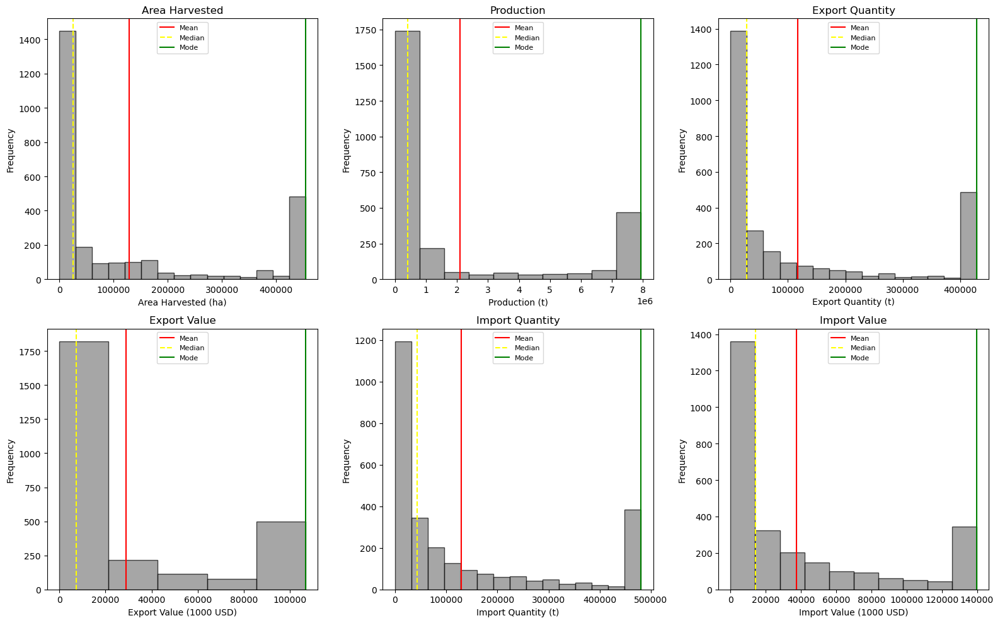

In [132]:
# Define the column names from the DataFrame to be used in the histograms
columns_name = ["Area Harvested", "Production", "Export Quantity",
                "Export Value", "Import Quantity", "Import Value"]

# Define x-axis labels corresponding to each column
x_labels = [
    "Area Harvested (ha)",  # Label for Area Harvested
    "Production (t)",       # Label for Production
    "Export Quantity (t)",  # Label for Export Quantity
    "Export Value (1000 USD)",  # Label for Export Value
    "Import Quantity (t)",  # Label for Import Quantity
    "Import Value (1000 USD)"  # Label for Import Value
]

# Specify the number of bins for each histogram (controls granularity of the histogram)
bins = [15, 10, 15, 5, 15, 10]

# Create a 2x3 grid of subplots for the histograms
fig, axs = plt.subplots(2, 3, figsize=(16, 10))  # Adjusted figure size for better visualization

# Loop through each subplot, column name, and associated settings
for i, ax in enumerate(axs.flat):  # Enumerate through each subplot (flatten the 2D array)
    # Extract the relevant data from the DataFrame for the current column
    data = df5_filtered[columns_name[i]]
    
    # Calculate measures of central tendency for the current column
    mean = data.mean()  # Calculate the mean
    median = data.median()  # Calculate the median
    mode = data.mode().iloc[0]  # Get the first mode (most frequent value)

    # Print Mean, Median, and Mode for the current column
    print(f"{columns_name[i]} - Mean: {mean:.2f}, Median: {median:.2f}, Mode: {mode:.2f}")

    # Plot the histogram for the current column
    ax.hist(data, bins=bins[i], color='grey', alpha=0.7, edgecolor='black')  # Histogram with styling

    # Add vertical lines for Mean, Median, and Mode on the histogram
    ax.axvline(mean, color='red', label='Mean', linewidth=1.5)  # Mean in red
    ax.axvline(median, color='yellow', linestyle='--', label='Median', linewidth=1.5)  # Median in yellow, dashed line
    ax.axvline(mode, color='green', label='Mode', linewidth=1.5)  # Mode in green

    # Add labels and a legend to each subplot
    ax.set_xlabel(x_labels[i], fontsize=10)  # Set the x-axis label
    ax.set_ylabel('Frequency', fontsize=10)  # Set the y-axis label
    ax.set_title(columns_name[i], fontsize=12)  # Set the title of the subplot
    ax.legend(fontsize=8)  # Add a legend with reduced font size

# Adjust the layout of the plot to avoid overlapping elements
plt.tight_layout()

# Display the plot with all histograms and annotations
plt.show()

- The six histograms above show the distribution of data for the specified columns. Red, yellow, and green lines overlay each plot, representing the mean, median, and mode, respectively. I chose to use histograms because they effectively display how data values are distributed across intervals.
From the graphs, we can observe that all histograms are **right-skewed**, as the median is less than the mean. In each graph, the mode appears at the end of the histogram (mode = maximum value). This is due to the adjustment of outliers. The code I wrote to handle outliers reduced most of them to the maximum value. Additionally, we can see that most values are clustered either near the lower or the higher end of the distributions.

## Measure of Dispersion

Measures of dispersion describe the spread or variability of a dataset. They indicate how data points differ from each other and how much they deviate from the central tendency . These measures are crucial for understanding the distribution and reliability of the data.Types of Measures of Dispersion are : `Min`,`Max`,`Range`,`Variance`,`Standard Deviation`,`%25 of Quantile`,`%50 of Quantile`,`%75 of Quantile`, `Range of Quantile`


In [136]:
# Compute the minimum value of each column
min_values = df5_filtered.min()
# Compute the maximum value of each column
max_values = df5_filtered.max()
# Compute the range (difference between max and min) of each column
range_values = df5_filtered.max() - df5_filtered.min()
# Compute the variance of each column
var_values = df5_filtered.var()
# Compute the standard deviation of each column
std_values = df5_filtered.std()
# Compute the first quantile (25th percentile) of each column
first_quantile = df5_filtered.quantile(0.25)
# Compute the second quantile (50th percentile, also the median) of each column
second_quantile = df5_filtered.quantile(0.50)
# Compute the third quantile (75th percentile) of each column
third_quantile = df5_filtered.quantile(0.75)
# Compute the interquartile range (IQR) by subtracting the 25th percentile from the 75th percentile
range_quantile = df5_filtered.quantile(0.75) - df5_filtered.quantile(0.25)
# Combine all computed statistics into a single DataFrame for better organization
measure_of_dispersion = pd.DataFrame({
    'Min': min_values,  # Minimum value
    'Max': max_values,  # Maximum value
    'Range': range_values,  # Range (max - min)
    'Variance': var_values,  # Variance
    'Standard Deviation': std_values,  # Standard deviation
    '%25 of Quantile': first_quantile,  # 25th percentile
    '%50 of Quantile': second_quantile,  # 50th percentile (median)
    '%75 of Quantile': third_quantile,  # 75th percentile
    'Range of Quantile': range_quantile  # Interquartile range (IQR)
})
# Display the first 7 rows of the DataFrame to review the measures of dispersion
measure_of_dispersion.head(7)

,Min,Max,Range,Variance,Standard Deviation,%25 of Quantile,%50 of Quantile,%75 of Quantile,Range of Quantile
Element,,,,,,,,,
Year,1961.0,2.022000e+03,6.100000e+01,3.203674e+02,1.789881e+01,1976.0,1991.500,2.007000e+03,3.100000e+01
Area Harvested,0.0,4.537738e+05,4.537738e+05,2.981037e+10,1.726568e+05,5817.5,24681.500,1.850000e+05,1.791825e+05
Production,0.0,7.936481e+06,7.936481e+06,9.096451e+12,3.016032e+06,105894.0,410720.000,3.238129e+06,3.132235e+06
Export Quantity,0.0,4.287065e+05,4.287065e+05,2.590934e+10,1.609638e+05,1707.0,27624.500,1.725068e+05,1.707998e+05
Export Value,0.0,1.066990e+05,1.066990e+05,1.576901e+09,3.971022e+04,639.0,7301.500,4.306300e+04,4.242400e+04
Import Quantity,0.0,4.806356e+05,4.806356e+05,2.842183e+10,1.685877e+05,4710.0,43539.965,1.950802e+05,1.903702e+05
Import Value,0.0,1.397272e+05,1.397272e+05,2.269615e+09,4.764047e+04,1333.5,14024.000,5.669100e+04,5.535750e+04


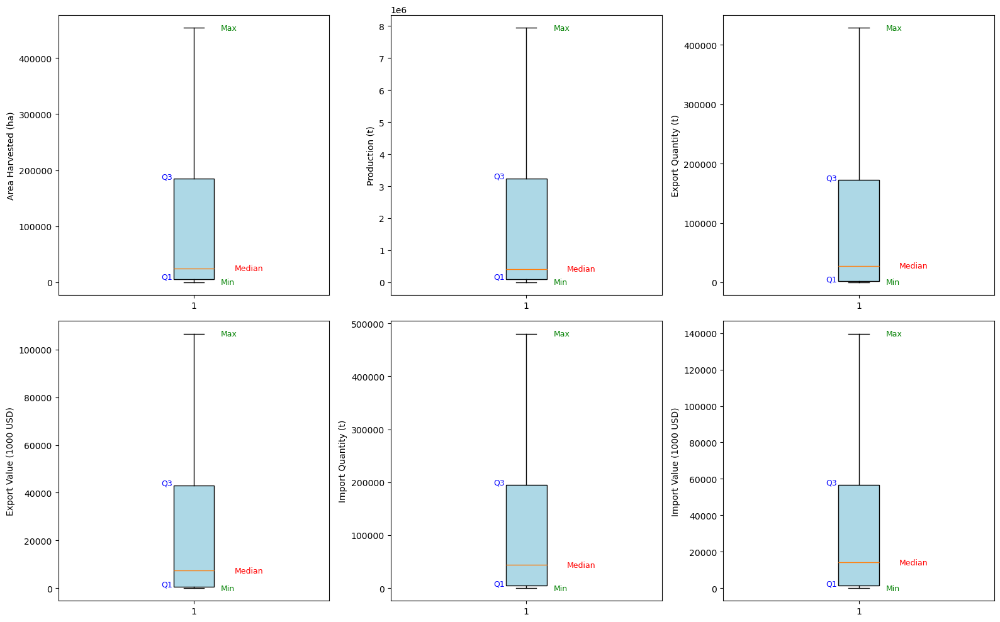

In [137]:
# Import matplotlib for plotting
import matplotlib.pyplot as plt

# Define column names for which boxplots will be created
columns_name = ["Area Harvested", "Production", "Export Quantity",
                "Export Value", "Import Quantity", "Import Value"]

# Define y-axis labels corresponding to each column
y_labels = [
    "Area Harvested (ha)",       # Label for Area Harvested
    "Production (t)",            # Label for Production
    "Export Quantity (t)",       # Label for Export Quantity
    "Export Value (1000 USD)",   # Label for Export Value
    "Import Quantity (t)",       # Label for Import Quantity
    "Import Value (1000 USD)"    # Label for Import Value
]

# Create a 2x3 grid of subplots for boxplots
fig, axs = plt.subplots(2, 3, figsize=(16, 10))  # Adjust figure size for better visualization

# Loop through each subplot to create a boxplot for the corresponding column
for i, ax in enumerate(axs.flat):  # Flatten the 2x3 grid for easier iteration
    # Extract data for the current column, dropping missing values
    data = df5_filtered[columns_name[i]].dropna()
    
    # Create a boxplot for the current data
    box = ax.boxplot(
        data, 
        patch_artist=True,  # Allows custom coloring of the box
        boxprops=dict(facecolor="lightblue")  # Set the box color to light blue
    )
    
    # Set y-axis label for the current subplot
    ax.set_ylabel(y_labels[i])
    
    # Compute statistics for the boxplot
    q1 = data.quantile(0.25)  # First quartile (Q1)
    median = data.median()    # Median (Q2)
    q3 = data.quantile(0.75)  # Third quartile (Q3)
    iqr = q3 - q1             # Interquartile range (IQR)
    lower_whisker = max(data.min(), q1 - 1.5 * iqr)  # Lower whisker (adjusted for outliers)
    upper_whisker = min(data.max(), q3 + 1.5 * iqr)  # Upper whisker (adjusted for outliers)

    # Annotate the boxplot with statistical values
    ax.text(0.65, median, "Median", transform=ax.get_yaxis_transform(),
            va='center', fontsize=9, color='red')  # Label the median in red
    ax.text(0.40, q1, "Q1", transform=ax.get_yaxis_transform(),
            ha='center', fontsize=9, color='blue')  # Label Q1 in blue
    ax.text(0.40, q3, "Q3", transform=ax.get_yaxis_transform(),
            ha='center', fontsize=9, color='blue')  # Label Q3 in blue
    ax.text(0.60, lower_whisker, "Min", transform=ax.get_yaxis_transform(),
            va='center', fontsize=9, color='green')  # Label the lower whisker in green
    ax.text(0.60, upper_whisker, "Max", transform=ax.get_yaxis_transform(),
            va='center', fontsize=9, color='green')  # Label the upper whisker in green

# Adjust layout to prevent overlapping labels and titles
plt.tight_layout()

# Display the boxplots
plt.show()

- The six boxplots above illustrate the spread, median, and outliers in the data. I chose boxplots because they effectively display the overall spread and shape of the data distribution. They are useful for identifying outliers, which are extreme values that lie beyond the whiskers, and for comparing multiple datasets side-by-side.
The median (red line) represents the middle value of the data. The box itself spans from Q1 (25th percentile) to Q3 (75th percentile), showing the interquartile range (IQR). The whiskers extend to the minimum and maximum values within 1.5 times the IQR, while values beyond the whiskers are considered potential outliers.

- All six variables have right-skewed distributions, meaning most data points are small, but there are a few very large values (outliers). These large outliers in production, exports, and imports can strongly affect the averages and trends.The wide range in Export Value and Import Value shows that trade activity is not even and varies a lot across the data.

## Measure to Describe Shape of Distribution


The shape of distribution provides informations about the distribution. This includes the distribution’s peaks, symmetry, uniformity, as well as its tendency to lean towards the left or right corner.Types of the shape of distribution are : 

`Skewness` : It measures the asymmetry of the data distribution:

`Kurtosis` : It measures the "tailedness" or peakedness of a distribution

In [141]:
# Compute mean, median, and mode
skew_values = df5_filtered.skew()
kurt_values = df5_filtered.kurt()

# Combine all statistics into a single DataFrame
measures_of_describe_shape_of_distribution = pd.DataFrame({
    'Skewness': skew_values,
    'Kurtosis': kurt_values
})

# Display the DataFrame
measures_of_describe_shape_of_distribution.head(7)

,Skewness,Kurtosis
Element,,
Year,0.000000,-1.200625
Area Harvested,1.108696,-0.477883
Production,1.217143,-0.319877
Export Quantity,1.193654,-0.274711
Export Value,1.193300,-0.261045
Import Quantity,1.226067,-0.028977
Import Value,1.219223,0.039352


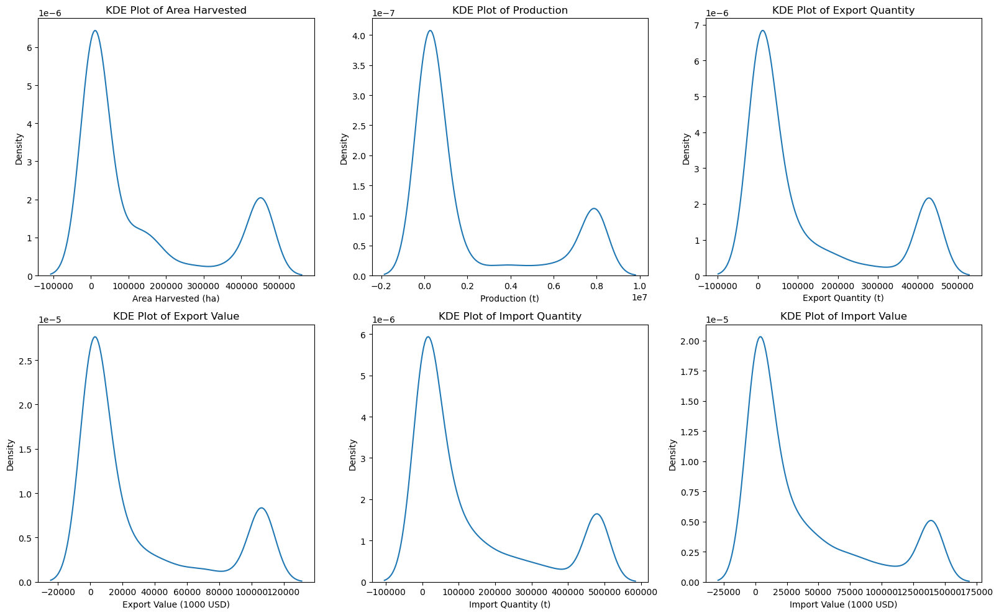

In [142]:
# Define the column names, x-axis labels, and bins for the histograms
columns_name = ["Area Harvested", "Production", "Export Quantity",
                "Export Value", "Import Quantity", "Import Value"]
x_labels = [
    "Area Harvested (ha)",
    "Production (t)",
    "Export Quantity (t)",
    "Export Value (1000 USD)",
    "Import Quantity (t)",
    "Import Value (1000 USD)"
]
# Create a 2x2 subplot layout
fig, axs = plt.subplots(2, 3, figsize=(16, 10))

for i, ax in enumerate(axs.flat):
    sns.kdeplot(df5_filtered[columns_name[i]], ax=ax)
    ax.set_xlabel(x_labels[i])
    ax.set_title(f"KDE Plot of {columns_name[i]}")

# Adjust layout and display the plot
plt.tight_layout()
plt.show()

- The six Kernel Density Estimation (KDE) plots above show the estimate of probability density function of a continuous variable. I chose KDE plot beacuse, it provides a smooth curve to understand the data distribution.KDE plots are particularly useful when dealing with continuous data or when you want to explore the distribution without making assumptions about a specific parametric form.

`Area Harvested (Top Left)` : The distribution is bimodal with two peaks.This suggests two groups: smaller farms with lower harvested areas and a few cases of farms with large-scale harvested areas.

`Production (Top Center)` : The distribution is right-skewed (positive skew).
This indicates that while most production values are small, a few very large values are presen

`Export Quantity (Top Right)` : It shows a bimodal distribution.This means most exports are small, with a few large ones.

`Export Value (Bottom Left)` : The distribution is right-skewed.This indicates that most export values are small, but there are instances of high-value exports.

`Import Quantity (Bottom Center)` : The distribution is bimodal, with two peaks.This shows a split between low and high import levels.

`Import Value (Bottom Right)` : The distribution is right-skewed. Most imports are of low value, but occasional high-value imports occur..


# Confidence Interval

`Problem` : How does Ireland's agricultural yield compare statistically with that of other countries?

- A confidence interval is the mean of your estimate plus and minus the variation in that estimate. This is the range of values you expect your estimate to fall between if you redo your test, within a certain level of confidence.

- In this section , I plan to compare confidence interval of the mean yield for Ireland with other countries. I chose %95 confidence level. it means there is a 95% probability that the calculated confidence intervals will contain the true mean.


In [147]:
# Create a new DataFrame by copying the existing DataFrame 'df5'
df6_filtered = pd.DataFrame(df5)
df6_filtered.head()

Element,Year,Area,Item,Area Harvested,Production,Export Quantity,Export Value,Import Quantity,Import Value
0,1961,France,Barley,453773.75,5412790.0,428706.53125,88680.0,300.0,40.0
1,1961,France,Cabbages,24993.00,596720.0,10534.00000,900.0,1625.0,106.0
2,1961,France,Carrots and turnips,25402.00,606350.0,8872.00000,814.0,7393.0,944.0
3,1961,France,Cauliflowers and broccoli,25279.00,429800.0,87561.00000,5449.0,71.0,9.0
4,1961,France,Leeks and allies,13281.00,392370.0,0.00000,0.0,0.0,0.0


In [148]:
# Calculate Yield as Production divided by Area Harvested
df6_filtered['Yield'] = df6_filtered['Production'] / df6_filtered['Area Harvested']

# Filter the data for Ireland and compute Yield
ireland_yield = df6_filtered[df6_filtered['Area'] == 'Ireland']['Yield'].dropna()  # Yields for Ireland only, dropping missing values

# Filter the data for other countries and compute Yield
other_yield = df6_filtered[df6_filtered['Area'] != 'Ireland']['Yield'].dropna()  # Yields for all other countries, dropping missing values

# Compute the mean Yield for Ireland
mean_ireland_yield = np.mean(ireland_yield)

# Compute the standard deviation of Yield for Ireland
std_dev_ireland_yield = np.std(ireland_yield, ddof=1)  # ddof=1 for sample standard deviation

# Count the sample size for Ireland
sample_size_ireland_yield = len(ireland_yield)

# Compute the mean Yield for other countries
mean_other_yield = np.mean(other_yield)

# Compute the standard deviation of Yield for other countries
std_dev_other_yield = np.std(other_yield, ddof=1)  # ddof=1 for sample standard deviation

# Count the sample size for other countries
sample_size_other_yield = len(other_yield)

# Set the confidence level (95%)
confidence_level = 0.95

# Calculate the z-score for a 95% confidence level (two-tailed test)
z_score = norm.ppf((1 + confidence_level) / 2)

# Calculate the margin of error for Ireland
margin_of_error_ireland_yield = z_score * (std_dev_ireland_yield / np.sqrt(sample_size_ireland_yield))

# Calculate the 95% confidence interval for Ireland
confidence_interval_ireland_yield = (
    mean_ireland_yield - margin_of_error_ireland_yield,  # Lower bound
    mean_ireland_yield + margin_of_error_ireland_yield   # Upper bound
)

# Calculate the margin of error for other countries
margin_of_error_other_yield = z_score * (std_dev_other_yield / np.sqrt(sample_size_other_yield))

# Calculate the 95% confidence interval for other countries
confidence_interval_other_yield = (
    mean_other_yield - margin_of_error_other_yield,  # Lower bound
    mean_other_yield + margin_of_error_other_yield   # Upper bound
)

# Display the results for Ireland
print("Ireland Yield:")
print(f"Mean Yield: {mean_ireland_yield}")
print(f"95% Confidence Interval: {confidence_interval_ireland_yield}")

# Display the results for other countries
print("\nOther Countries Yield:")
print(f"Mean Yield: {mean_other_yield}")
print(f"95% Confidence Interval: {confidence_interval_other_yield}")


Ireland Yield:
Mean Yield: 19.548980406572348
95% Confidence Interval: (18.385796106018354, 20.71216470712634)

Other Countries Yield:
Mean Yield: 23.41052151694148
95% Confidence Interval: (22.71794187336922, 24.103101160513738)


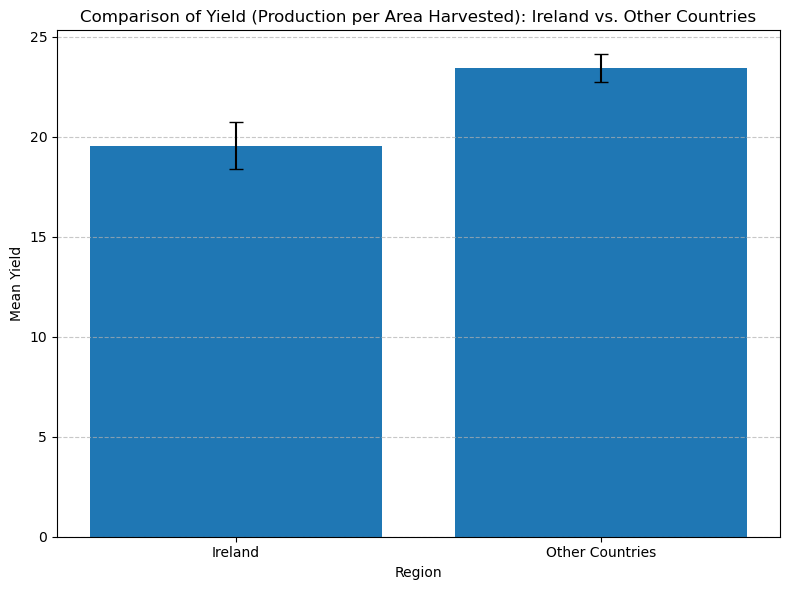

In [149]:
# Define categories for the bar plot
categories = ['Ireland', 'Other Countries']  # Labels for the regions

# Define mean values for each category
means = [mean_ireland_yield, mean_other_yield]  # Mean yield for Ireland and other countries

# Define the error values (upper confidence bound - mean)
errors = [
    (confidence_interval_ireland_yield[1] - mean_ireland_yield),  # Margin of error for Ireland
    (confidence_interval_other_yield[1] - mean_other_yield),     # Margin of error for other countries
]

# Create a bar plot with error bars
plt.figure(figsize=(8, 6))  # Set the figure size
plt.bar(categories, means, yerr=errors, capsize=5)  # Create bars with error bars, capsize controls the error cap width

# Add a title to the plot
plt.title("Comparison of Yield (Production per Area Harvested): Ireland vs. Other Countries")

# Label the y-axis
plt.ylabel("Mean Yield")

# Label the x-axis
plt.xlabel("Region")

# Add a grid to the y-axis for better readability
plt.grid(axis='y', linestyle='--', alpha=0.7)  # Dashed lines with some transparency

# Adjust layout for better spacing
plt.tight_layout()

# Display the plot
plt.show()


The bar plot shows the average agricultural yield for Ireland and Other Countries, along with their respective 95% confidence intervals. The black line on the bar plot represents the 95% confidence interval for the average yield of each group.This indicates that Ireland's yield is generally lower than the average yield of other countries within the dataset. In this case, there is very little overlap, supporting a significant difference between Ireland's yield and that of other countries.

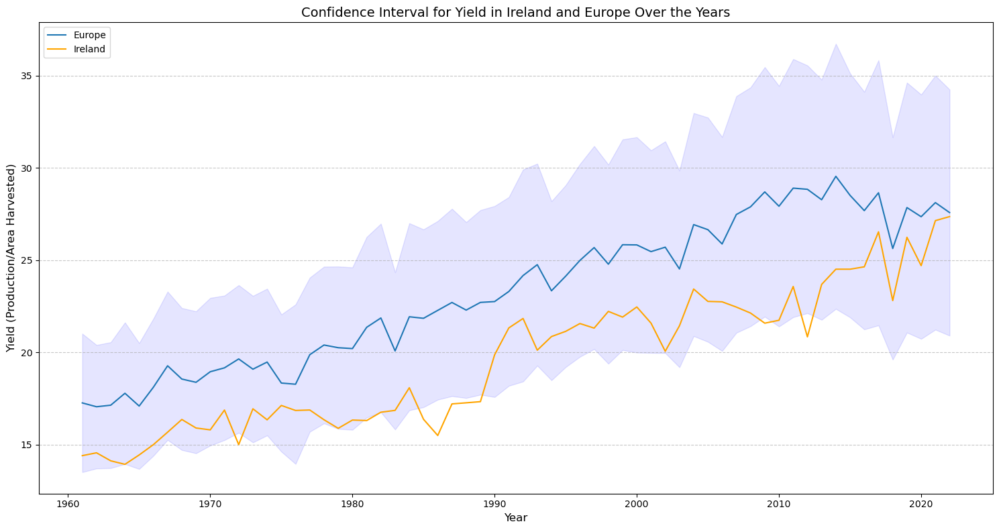

In [151]:
# Group the dataset by year for Ireland and other countries, focusing on Yield
ireland_yearly = df6_filtered[df6_filtered['Area'] == 'Ireland'].groupby('Year')['Yield']
others_yearly = df6_filtered[df6_filtered['Area'] != 'Ireland'].groupby('Year')['Yield']

# Initialize a dictionary to store statistics for other countries by year
stats_dict = {}

# Loop through each year and compute statistics for other countries
for year, values in others_yearly:
    mean = values.mean()  # Mean Yield
    std = values.std()    # Standard Deviation
    count = values.count()  # Sample size (number of data points)
    se = std / np.sqrt(count)  # Standard error of the mean

    # Calculate the 95% confidence intervals
    ci_lower = mean - z_score * se  # Lower bound
    ci_upper = mean + z_score * se  # Upper bound

    # Store statistics in the dictionary
    stats_dict[year] = {
        'mean': mean,
        'std': std,
        'count': count,
        'll': ci_lower,  # Lower confidence interval
        'ul': ci_upper   # Upper confidence interval
    }

# Compute mean yield for Ireland grouped by year
ireland_stats = ireland_yearly.mean()

# Extract data for plotting
x = np.array(list(stats_dict.keys()))  # Years for plotting
y = np.array([stats_dict[year]['mean'] for year in x])  # Mean yield for other countries
ll = np.array([stats_dict[year]['ll'] for year in x])  # Lower bound of confidence intervals
ul = np.array([stats_dict[year]['ul'] for year in x])  # Upper bound of confidence intervals
ire = ireland_stats.loc[x].values  # Ireland's yield, matched to the same years

# Create a plot
plt.figure(figsize=(15, 8))  # Set figure size
plt.plot(x, y, label='Europe')  # Plot mean yield for other countries
plt.fill_between(x, ll, ul, color='blue', alpha=0.1)  # Add confidence interval as shaded area
plt.plot(x, ire, label='Ireland', color='orange')  # Plot Ireland's mean yield

# Add title and labels
plt.title('Confidence Interval for Yield in Ireland and Europe Over the Years', fontsize=14)
plt.xlabel('Year', fontsize=12)
plt.ylabel('Yield (Production/Area Harvested)', fontsize=12)

# Add legend
plt.legend(loc='upper left')

# Add grid for better readability
plt.grid(axis='y', linestyle='--', alpha=0.7)

# Adjust layout to prevent overlap
plt.tight_layout()

# Show the plot
plt.show()


The graph highlights how Ireland's yield compares to the aggregate trend of other European countries.The orange line represents Ireland's specific yield trends over time, while the blue line with the confidence interval band shows Europe's average yield and its variability.The shaded area around Europe's line represents the 95% confidence interval. This accounts for variability in the data across European countries, showing the range within which the true mean yield is likely to fall.

# Hypothesis Testing 

`Problem -1` : Is the potatoes yield of Ireland from 1961 to 2022 different from potatoes yield of Germany in same interval year ?

Hypothesis statement:

**H0** : The potatoes yield of Ireland and Germany are equal

**H1** : The potatoes yield of Ireland and Germany are **not** equal

In [155]:
# Create a DataFrame which include some columns.
countries_yield = pd.concat([df5["Year"], df5["Area"], df5["Item"], df6_yield], axis=1)
countries_yield.head()

,Year,Area,Item,Yield
0,1961,France,Barley,11.928389
1,1961,France,Cabbages,23.875485
2,1961,France,Carrots and turnips,23.870168
3,1961,France,Cauliflowers and broccoli,17.002255
4,1961,France,Leeks and allies,29.543709


In [156]:
# Filter the dataset for Ireland's Potatoes Yield
ireland_potatoes_yield = countries_yield[(countries_yield['Area'] == 'Ireland') & (countries_yield['Item'] == 'Potatoes')]
# Filter the dataset for Germany's Potatoes Yield
germany_potatoes_yield = countries_yield[(countries_yield['Area'] == 'Germany') & (countries_yield['Item'] == 'Potatoes')]

In [157]:
# Perform Shapiro-Wilk test for Ireland's Potatoes Yield
stat, p = shapiro(ireland_potatoes_yield["Yield"])  # Test for normality of 'Yield' in Ireland's data
print('Ireland Potatoes Yield - Statistics=%.3f, p=%.3f' % (stat, p))  # Print test statistic and p-value

# Interpret the p-value for Ireland
alpha = 0.05  # Significance level
if p > alpha:
    print('Ireland: Sample looks Gaussian (fail to reject H0)')  # p > alpha: Fail to reject the null hypothesis (data is normal)
else:
    print('Ireland: Sample does not look Gaussian (reject H0)')  # p <= alpha: Reject the null hypothesis (data is not normal)

# Perform Shapiro-Wilk test for Germany's Potatoes Yield
stat, p = shapiro(germany_potatoes_yield["Yield"])  # Test for normality of 'Yield' in Germany's data
print('Germany Potatoes Yield - Statistics=%.3f, p=%.3f' % (stat, p))  # Print test statistic and p-value

# Interpret the p-value for Germany
if p > alpha:
    print('Germany: Sample looks Gaussian (fail to reject H0)')  # p > alpha: Fail to reject the null hypothesis (data is normal)
else:
    print('Germany: Sample does not look Gaussian (reject H0)')  # p <= alpha: Reject the null hypothesis (data is not normal)


Ireland Potatoes Yield - Statistics=0.924, p=0.001
Ireland: Sample does not look Gaussian (reject H0)
Germany Potatoes Yield - Statistics=0.794, p=0.000
Germany: Sample does not look Gaussian (reject H0)


**Significance level** : We will test our hypothesis at a 5% significance level.

**Test method** : We use the Mann-Whitney's test to determine whether one group has higher or lower yield than the other group. **Mann-Whitney U test** is a nonparametric statistical significance test for determining whether two independent samples were drawn from a population with the same distribution. The default assumption or null hypothesis is that there is no difference between the distributions of the data samples. Rejection of this hypothesis suggests that there is likely some difference between the samples. 

In [159]:
# summarize
print('Ireland Potatoes Yield: median = %.0f stdv = %.1f' % (np.median(ireland_potatoes_yield["Yield"]), np.std(ireland_potatoes_yield["Yield"])))
print('Germany Potatoes Yield: median = %.0f stdv = %.1f' % (np.median(germany_potatoes_yield["Yield"]), np.std(germany_potatoes_yield["Yield"])))

print(stats.mannwhitneyu(ireland_potatoes_yield["Yield"], germany_potatoes_yield["Yield"]))

if p > alpha:
	print('Means are not statistically different (We fail to reject H0)')
else:
	print('Means are statistically different (We reject H0)')  

Ireland Potatoes Yield: median = 28 stdv = 6.7
Germany Potatoes Yield: median = 23 stdv = 6.0
MannwhitneyuResult(statistic=2789.0, pvalue=1.2934949112255155e-05)
Means are statistically different (We reject H0)


`Result -1` : The p-value is inferior than the significance level of 5%, we can reject the null hypothesis.We can conclude that the potatoes yield of Ireland is different from the the potatoes yield of Germany at a 95% confidence level.


`Problem -2` : Is there a statistically significant correlation between Ireland Production and Area Harvested ?

Hypothesis statement :

**H0** : There is **no** significant correlation between Ireland Production and Area Harvested.

**H1** : There is a significant correlation between Ireland Production and Area Harvested.

In [162]:
# Create a DataFrame which include some columns.
countries_production_area = pd.concat([df5["Year"], df5["Area"], df5["Production"], df5["Area Harvested"]], axis=1)
countries_production_area.head()

,Year,Area,Production,Area Harvested
0,1961,France,5412790.0,453773.75
1,1961,France,596720.0,24993.00
2,1961,France,606350.0,25402.00
3,1961,France,429800.0,25279.00
4,1961,France,392370.0,13281.00


In [163]:
# Filter the dataset for Ireland's Production and Area data
ireland_production_area = countries_production_area[(countries_production_area['Area'] == 'Ireland')]
ireland_production_area.head()

,Year,Area,Production,Area Harvested
22,1961,Ireland,515400.0,146373.000000
23,1961,Ireland,25000.0,1300.000000
24,1961,Ireland,17000.0,500.000000
25,1961,Ireland,2000.0,100.000000
26,1961,Ireland,0.0,381364.742306


**Significance level** : We will test our hypothesis at 5% significance level.

**Test method** : We use the **Spearman Rank Correlation Test** to determine if our two variables are correlated. This statistical method quantifies the degree to which ranked variables are associated by a monotonic function, meaning an increasing or decreasing relationship. As a statistical hypothesis test, the method assumes that the samples are uncorrelated (fail to reject H0).
Therefore, if our assumption is correct, the result of the test should enable us to reject the null hypothesis.

In [165]:
# Calculate the Spearman rank correlation between Production and Area Harvested
cor, pval = stats.spearmanr(
    ireland_production_area[['Production']], ireland_production_area[['Area Harvested']]
)

# Print the results with interpretation
print("Non-Parametric Spearman correlation test : correlation coefficient : %.4f, pval: %.4f" % (cor, pval))

# Interpretation of the correlation coefficient
if 0.00 <= abs(cor) <= 0.19:
    interpretation = "Very weak correlation"
elif 0.20 <= abs(cor) <= 0.39:
    interpretation = "Weak correlation"
elif 0.40 <= abs(cor) <= 0.59:
    interpretation = "Moderate correlation"
elif 0.60 <= abs(cor) <= 0.79:
    interpretation = "Strong correlation"
elif 0.80 <= abs(cor) <= 1.00:
    interpretation = "Very strong correlation"

print("Interpretation: %s" % interpretation)

Non-Parametric Spearman correlation test : correlation coefficient : 0.6962, pval: 0.0000
Interpretation: Strong correlation


`Result -2` : The closer Rs is to +1 or -1, the stronger the likely correlation. A perfect positive correlation is +1 and a perfect negative correlation is -1. The Rs value of 0.6962 suggests a fairly strong positive relationship.
The high correlation coefficient induces a strong positive relationship between the two variables, confirming our alternative hypothesis.

`Problem -3` : Is there a statistically significant difference in oat export prices between Ireland and Germany from 1995 to 2020?

Hypothesis statement :

**H0** : There is **no** significant difference in oat export prices between Ireland and Germany from 1995 to 2020.

**H1** : There is a significant difference in oat export prices between Ireland and Germany from 1995 to 2020.

In [168]:
# Create a DataFrame which include some columns.
countries_export_price = pd.concat([df5["Year"], df5["Area"], df5["Item"], df6_export_price], axis=1)
# Filter the data for Oats in Ireland and Germany
countries_export_price = countries_export_price[(countries_export_price['Item'] == 'Oats') & 
                                                 (countries_export_price['Area'].isin(['Ireland', 'Germany'])) &
                                                  (countries_export_price['Year'].isin(range(1995, 2021))) ]
countries_export_price.head()

,Year,Area,Item,Export Price
1512,1995,Germany,Oats,0.189744
1523,1995,Ireland,Oats,0.188508
1556,1996,Germany,Oats,0.215365
1567,1996,Ireland,Oats,0.181133
1600,1997,Germany,Oats,0.199612


In [169]:
# Separate the data for Ireland and Germany
ireland_oats_export_price = countries_export_price[countries_export_price['Area'] == 'Ireland']
germany_oats_export_price = countries_export_price[countries_export_price['Area'] == 'Germany']

**Significance level** : We will test our hypothesis at 5% significance level.

**Test method** : We use the **T-Test**  to determine whether there is a significant difference between the means of two groups.It is commonly used when you are comparing two datasets to see if they are statistically different from each other and the sample sizes of groups n<30. In this problem , we use **Independent t-test (two-sample t-test)** which compares the means of two independent groups.

In [171]:
# Perform independent t-test
t_stat_oats_period, p_value_oats_period = ttest_ind(ireland_oats_export_price["Export Price"], 
                                                    germany_oats_export_price["Export Price"], equal_var=False)

# Display results and summary statistics
print(f"t-statistic: {t_stat_oats_period:.4f}, p-value (t-test): {p_value_oats_period:.4f}")

# Decision for t-test (using α = 0.05)
alpha = 0.05
if p_value_oats_period < alpha:
    print("Reject the null hypothesis: There is a significant difference in oat export prices between Ireland and Germany from 1995 to 2020.")
else:
    print("Fail to reject the null hypothesis: There is no significant difference in oat export prices between Ireland and Germany from 1995 to 2020.")


t-statistic: -0.2541, p-value (t-test): 0.8005
Fail to reject the null hypothesis: There is no significant difference in oat export prices between Ireland and Germany from 1995 to 2020.


`Result -3` : The t-statistic measures the size of the difference relative to the variation in the data. A small absolute value like -0.25 suggests that the means are very close.The p-value is much greater than the standard significance level (0.05).Therefore, there is no significant difference in oat export prices between Ireland and Germany from 1995 to 2020. Both countries have comparable average prices during this period.

`Problem -4` : Is there a statistically significant difference in onions and shallots import prices between Ireland and France in all year?

Hypothesis statement :

**H0** : There is **no** significant difference in onions and shallots import prices between Ireland and France in all year.

**H1** : There is a significant difference in onions and shallots import prices between Ireland and France in all year.

In [174]:
# Create a DataFrame which include some columns.
countries_import_price = pd.concat([df5["Year"], df5["Area"], df5["Item"], df6_import_price], axis=1)
countries_import_price.head()
# Filter the data for Onions and shallots in Ireland and France
countries_import_price = countries_import_price[(countries_import_price['Item'] == 'Onions and shallots') & 
                                                 (countries_import_price['Area'].isin(['Ireland', 'France'])) &
                                                  (countries_import_price['Year'])]
countries_import_price.head()

,Year,Area,Item,Import Price
6,1961,France,Onions and shallots,0.089163
28,1961,Ireland,Onions and shallots,0.105979
94,1963,France,Onions and shallots,0.082372
116,1963,Ireland,Onions and shallots,0.140603
182,1965,France,Onions and shallots,0.096015


In [175]:
# Separate the data for Ireland and France
ireland_onions_import_price = countries_import_price[countries_import_price['Area'] == 'Ireland']
france_onions_import_price = countries_import_price[countries_import_price['Area'] == 'France']

**Significance level** : We will test our hypothesis at 5% significance level.

**Test method** : We use the **Z-Test**  to determine whether there is a significant difference between the means of two groups or between a sample mean and a population mean. It is particularly useful when : the sample sizes of the groups n>=30 and the variance of the groups are known

In [177]:
# Calculate means, variances, and sample sizes
mean_ireland_onions = ireland_onions_import_price["Import Price"].mean()
mean_france_onions = france_onions_import_price["Import Price"].mean()
# Calculate variances
var_ireland_onions = ireland_onions_import_price["Import Price"].var()
var_france_onions = france_onions_import_price["Import Price"].var()
# Calculate sample sizes
n_ireland_onions = len(ireland_onions_import_price["Import Price"])
n_france_onions = len(france_onions_import_price["Import Price"])

# Standard error for the difference of means
se_diff_onions = np.sqrt((var_ireland_onions / n_ireland_onions) + 
                         (var_france_onions / n_france_onions))

# Z-test statistic and p-value
z_stat_onions = (mean_ireland_onions - mean_france_onions) / se_diff_onions
p_value_onions = 2 * (1 - norm.cdf(abs(z_stat_onions)))

print(f"Mean for Ireland: {mean_ireland_onions:.4f}, Mean for France: {mean_france_onions:.4f}")
print(f"z-statistic: {z_stat_onions:.4f}, p-value (z-test): {p_value_onions:.4f}")

# Decision for z-test (using α = 0.05)
alpha = 0.05
if p_value_onions < alpha:
    print("Reject the null hypothesis: There is no significant difference in onions and shallots import prices between Ireland and France in all year.")
else:
    print("Fail to reject the null hypothesis: There is no significant difference in onions and shallots import prices between Ireland and France in all year.")


Mean for Ireland: 0.3971, Mean for France: 0.3414
z-statistic: 0.9918, p-value (z-test): 0.3213
Fail to reject the null hypothesis: There is no significant difference in onions and shallots import prices between Ireland and France in all year.


`Result-4` : The p-value is 0.3213, which is greater than the standard significance level of 0.05.This indicates that there is no statistically significant difference between the mean import prices for onions and shallots in Ireland and France.

`Problem -5` : Is there a statistically significant difference in the average import prices of barley among Ireland, France, and the Netherlands?

Hypothesis statement :

**H0** : The mean of barley import prices among all countries are equal across all year.

**H1** : The mean of barley import prices among all countries are **not** equal across all year.(At least one is different).

In [180]:
# Create a DataFrame which include some columns.
countries_import_price2 = pd.concat([df5["Year"], df5["Area"], df5["Item"], df6_import_price], axis=1)
# Filter the data for Onions and shallots in Ireland, France and Netherlands.
countries_import_price2 = countries_import_price2[(countries_import_price2['Item'] == 'Barley') & 
                                                 (countries_import_price2['Area'].isin(['Ireland', 'France', 'Netherlands'])) &
                                                  (countries_import_price2['Year'])]
countries_import_price2.head()

,Year,Area,Item,Import Price
0,1961,France,Barley,0.133333
22,1961,Ireland,Barley,0.078345
33,1961,Netherlands,Barley,0.050316
88,1963,France,Barley,0.076471
110,1963,Ireland,Barley,0.083179


In [181]:
# Separate the data for Ireland, France and Netherlands.
ireland_barley_import_price = countries_import_price2[countries_import_price2['Area'] == 'Ireland']
france_barley_import_price = countries_import_price2[countries_import_price2['Area'] == 'France']
netherlands_barley_import_price = countries_import_price2[countries_import_price2['Area'] == 'Netherlands']

**Significance level** : We will test our hypothesis at 5% significance level.

**Test method** : We use the **Anova(Analysis of Variance) Test**  to determine whether there are significant differences between the means of two or more independent groups. In this problem, we use **One-Way Anova Test** which is used to test whether there is a significant difference between the means of three or more independent groups.

In [183]:
# Extract groups for each method
group_A = ireland_barley_import_price['Import Price']
group_B = france_barley_import_price['Import Price']
group_C = netherlands_barley_import_price['Import Price']

# Perform One-Way ANOVA
f_stat, p_value = stats.f_oneway(group_A, group_B, group_C)

# Display the F-statistic and p-value
print(f"f-statistic: {f_stat:.4f}, p-value: {p_value:.4f}")

# Set significance level (alpha)
alpha = 0.05

# Compare p-value with significance level to make a decision
if p_value < alpha:
    print("Reject the null hypothesis: The mean of barley import prices among all countries are equal across all year.")
else:
    print("Fail to reject the null hypothesis: The mean of barley import prices among all countries are equal across all year.")

f-statistic: 0.3961, p-value: 0.6741
Fail to reject the null hypothesis: The mean of barley import prices among all countries are equal across all year.


`Result -5` : A small F-statistic (close to 1) suggests that the groups variances are similar, meaning the group means are likely not significantly different.This small F-statistic value(0.3961) shows that the difference between the group averages (Ireland, France, Netherlands) is not much bigger than the differences within each group. ALso, the p-value (0.6741) is much larger than the common significance level (e.g., 0.05). This means there is no statistically significant difference in the Import Price of Barley among Ireland, France, and the Netherlands.

`Problem -6` : Is there a statistically significant difference in the average import prices of barley among Ireland, France, and the Netherlands?

- **Problem 6** will have the same question as **Problem 5** because I want to use a different test and see if I get the same result.

Hypothesis statement :

**H0** : The mean of barley import prices among all countries are equal across all year.

**H1** : The mean of barley import prices among all countries are not equal across all year.(At least one is different).

**Significance level** : We will test our hypothesis at 5% significance level.

**Test method** : We use the **Kruskal–Wallis Test** which is a non-parametric test is used to determine whether or not there is a statistically significant difference between the medians of three or more independent groups.The Kruskal-Wallis test is a non-parametric alternative to ANOVA.

In [187]:
# Perform Kruskal-Wallis test on Import Price
k_statistic, p_value = kruskal(group_A, group_B, group_C)

# Display the Kruskal Statisticc and p-value
print(f"Kruskal Statistic: {k_statistic:.4f}, p-value: {p_value:.4f}")

# Set significance level (alpha)
alpha = 0.05

# Compare p-value with significance level to make a decision
if p_value < alpha:
    print("Reject the null hypothesis: The mean of barley import prices among all countries are equal across all year.")
else:
    print("Fail to reject the null hypothesis: The mean of barley import prices among all countries are equal across all year.")

Kruskal Statistic: 2.2801, p-value: 0.3198
Fail to reject the null hypothesis: The mean of barley import prices among all countries are equal across all year.


`Result -6` : This small Kruskal statistic value(2.2801) suggests that the import price ranks for Ireland, France, and the Netherlands are quite similar, supporting the conclusion that there are no significant differences between the groups' medians. Also, the p-value (0.3198) is larger than the common significance level (0.05), indicating that there is no statistically significant difference in the Import Price of Barley among Ireland, France, and the Netherlands.

# Regression Models

`Problem -1` : I aimed to predict the export quantity of any item for any country based on export value and production. To achieve this, I compared four regression models to choose the best one: **Multiple Linear Regression**, **Polynomial Linear Regression**, **K-Nearest Neighbors (KNN) Regression**, and **Support Vector Regression (SVR)**.

For all models, I applied one of the hyperparameter tuning methods, **GridSearchCV**. R² scores and Mean Squared Error (MSE) scores were calculated and printed to compare the results. Scatter plots were created for all models to visualize the actual and predicted values. Additionally, the `K-Fold Cross-Validation` technique was applied to all models to ensure the reliability of the modeling outcomes.

In the final step, I selected the best model for prediction.

In [191]:
# Concatenate selected columns from df5 (Year, Area, Item) with the scaled data from df6
# The columns are combined along the horizontal axis (axis=1)
df7 = pd.concat([df5["Year"], df5["Area"], df5["Item"], df6_scaled], axis=1)
# Display the first 5 rows of the resulting dataframe to check the output
df7.head()

,Year,Area,Item,Area Harvested,Production,Export Quantity,Export Value,Import Quantity,Import Value
0,1961,France,Barley,1.000000,0.682014,1.000000,0.831123,0.000624,0.000286
1,1961,France,Cabbages,0.055078,0.075187,0.024572,0.008435,0.003381,0.000759
2,1961,France,Carrots and turnips,0.055979,0.076400,0.020695,0.007629,0.015382,0.006756
3,1961,France,Cauliflowers and broccoli,0.055708,0.054155,0.204245,0.051069,0.000148,0.000064
4,1961,France,Leeks and allies,0.029268,0.049439,0.000000,0.000000,0.000000,0.000000


### Model Comparison with GridsearchCV

Training MULT model...
Training POLY model...
Training KNN model...
Training SVR model...

Best Hyperparameters and Scores from Grid Search:
  Model                                    Best Parameters  Best CV R² Score  \
0  MULT  {'copy_X': True, 'fit_intercept': False, 'n_jo...          0.860179   
1  POLY  {'PolynomialFeatures__degree': 5, 'PolynomialF...          0.932090   
2   KNN  {'algorithm': 'ball_tree', 'leaf_size': 3, 'me...          0.924242   
3   SVR           {'C': 1000, 'gamma': 1, 'kernel': 'rbf'}          0.917867   

        MSE  
0  0.020245  
1  0.012750  
2  0.011668  
3  0.014800  


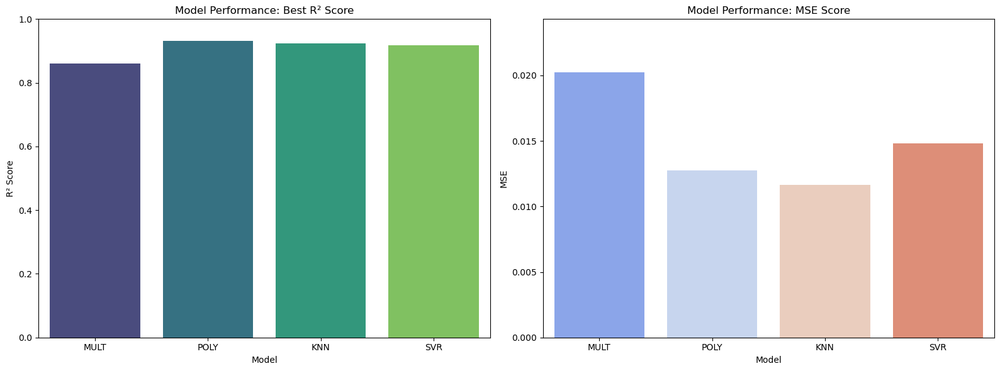

In [193]:
from sklearn.neighbors import KNeighborsRegressor
from sklearn.metrics import mean_squared_error, r2_score
import matplotlib.pyplot as plt
import numpy as np
from sklearn.model_selection import train_test_split, KFold, GridSearchCV
from sklearn.linear_model import LinearRegression
from sklearn.svm import SVR
from sklearn.preprocessing import PolynomialFeatures
from sklearn.pipeline import Pipeline
import pandas as pd
import seaborn as sns

# Define features (X) and target variable (y) for the regression task
try:
    X = df7[['Export Value', 'Production']]  # Predictor variables
    y = df7['Export Quantity']  # Target variable

    # Set up hyperparameter grids for each model
    param_grid = {
        'MULT': {  # Parameters for Multiple Linear Regression
            'copy_X': [True, False],
            'fit_intercept': [True, False],
            'n_jobs': [1, 5, 10, 15, None],
            'positive': [True, False]
        },
        'POLY': {  # Parameters for Polynomial Regression
            'PolynomialFeatures__degree': [1, 2, 3, 4, 5],
            'PolynomialFeatures__include_bias': [True, False],
            'PolynomialFeatures__interaction_only': [False, True],
            'PolynomialFeatures__order': ['C', 'F']
        },
        'KNN': {  # Parameters for K-Nearest Neighbors Regression
            'algorithm': ['auto', 'ball_tree'],
            'leaf_size': [3, 5, 10],
            'metric': ['minkowski', 'euclidean', 'manhattan', 'chebyshev'],
            'metric_params': [None],
            'n_jobs': [None],
            'n_neighbors': [1, 5, 15],
            'p': [1, 2],
            'weights': ['uniform', 'distance']
        },
        'SVR': {  # Parameters for Support Vector Regression
            'C': [1, 10, 100, 1000],
            'gamma': [1, 0.5, 0.1, 0.01],
            'kernel': ['rbf']
        }
    }

    # Define the models to be tested
    models = {
        'MULT': LinearRegression(),  # Multiple Linear Regression
        'POLY': Pipeline([  # Polynomial Regression (as a pipeline)
            ('PolynomialFeatures', PolynomialFeatures()),
            ('LinearRegression', LinearRegression())
        ]),
        'KNN': KNeighborsRegressor(),  # K-Nearest Neighbors Regression
        'SVR': SVR()  # Support Vector Regression
    }

    # Split the dataset into training and testing sets (80% train, 20% test)
    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

    # Initialize containers for storing results and predictions
    results = []
    predictions = {}

    # Iterate over each model, perform hyperparameter tuning, and evaluate performance
    for name, model in models.items():
        print(f"Training {name} model...")
        try:
            # Perform Grid Search with cross-validation
            grid_search = GridSearchCV(
                model, param_grid[name], cv=5, scoring='r2', n_jobs=-1
            )
            grid_search.fit(X_train, y_train)

            # Get the best model, its parameters, and performance score
            best_model = grid_search.best_estimator_
            best_params = grid_search.best_params_
            best_score = grid_search.best_score_

            # Evaluate the best model on the test set
            y_pred = best_model.predict(X_test)
            mse = mean_squared_error(y_test, y_pred)

            # Save results for this model
            results.append({
                'Model': name,
                'Best Parameters': best_params,
                'Best CV R² Score': best_score,
                'MSE': mse
            })
            predictions[name] = y_pred
        except Exception as e:
            print(f"An error occurred during grid search for the {name} model:", e)

    # Convert results into a DataFrame for easy display
    results_df = pd.DataFrame(results)
    print("\nBest Hyperparameters and Scores from Grid Search:")
    print(results_df)

    # Visualization of cross-validation results
    try:
        fig, axes = plt.subplots(1, 2, figsize=(16, 6), sharey=False)

        # Plot Best CV R² Scores on the first subplot
        sns.barplot(
            ax=axes[0],
            x='Model',
            y='Best CV R² Score',
            hue='Model',
            data=results_df,
            palette='viridis',
            dodge=False  # Single bars per model
        )
        axes[0].set_title('Model Performance: Best R² Score')
        axes[0].set_xlabel('Model')
        axes[0].set_ylabel('R² Score')
        axes[0].set_ylim(0, 1)  # R² score ranges from 0 to 1

        # Plot Mean Squared Error (MSE)
        sns.barplot(
            ax=axes[1],
            x='Model',
            y='MSE',
            hue='Model',
            data=results_df,
            palette='coolwarm',
            dodge=False  # Single bars per model
        )
        axes[1].set_title('Model Performance: MSE Score')
        axes[1].set_xlabel('Model')
        axes[1].set_ylabel('MSE')
        axes[1].set_ylim(0, results_df['MSE'].max() * 1.2)  # Adjust y-axis for better visualization

        # Adjust layout for better spacing
        plt.tight_layout()

        # Display the plots
        plt.show()
    except Exception as e:
        print("An error occurred during plotting:", e)

except KeyError as e:
    print("A KeyError occurred. Please check the column names in the dataset:", e)
except Exception as e:
    print("An unexpected error occurred:", e)


These bar charts display the best R² scores and MSE values obtained during GridSearchCV for all models.

The R² score (coefficient of determination) measures how well the model explains the variance in the target variable. Models with R² values closer to 1 perform better in explaining the variance of the target variable. All models seem to perform well, as they exhibit relatively high R² scores (closer to 1), although there is some variation across the models.

The Mean Squared Error (MSE) quantifies the average squared difference between the predicted and actual values. Lower MSE values indicate better performance, as they reflect higher prediction accuracy on the test set. There is noticeable variation in MSE across models, with some performing significantly better (having lower MSE) than others.

By comparing these metrics, the Polynomial Regression (POLY) and K-Nearest Neighbors (KNN) models appear to be the most promising for this task. They demonstrate both high explanatory power (high R² scores) and accurate predictions (low MSE values).

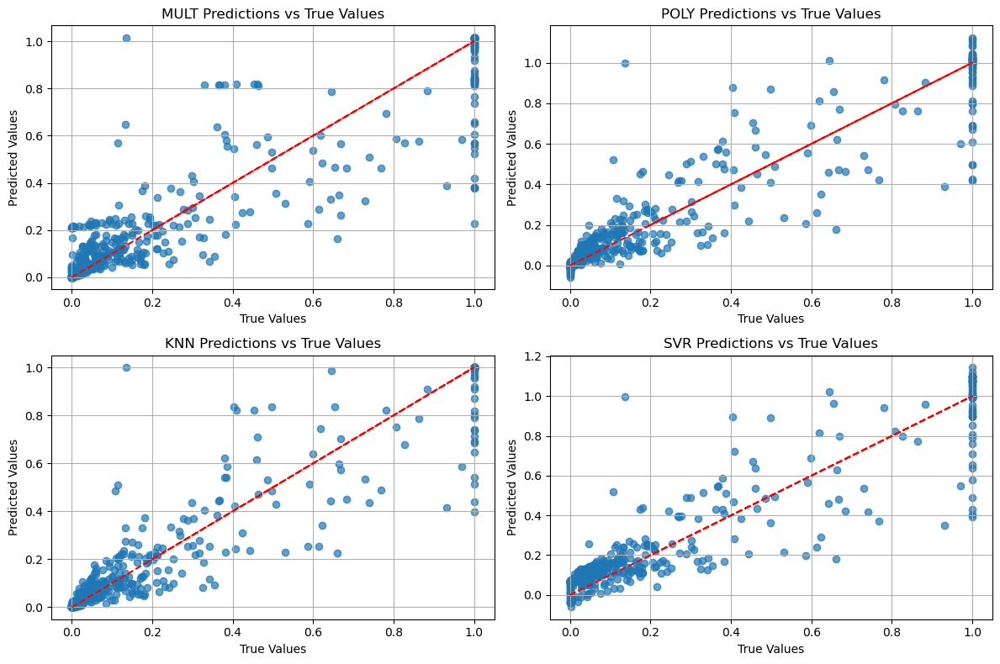

In [195]:
# Define the grid size based on the number of models
n_models = len(predictions)  # Total number of models
n_rows = (n_models + 1) // 2  # Calculate the number of rows needed for a 2x2 grid layout
fig, axes = plt.subplots(n_rows, 2, figsize=(12, 8))  # Create subplots

# Flatten the axes array for easier iteration
axes = axes.flatten()

# Iterate over each model and its predictions to create scatter plots
for idx, (model_name, y_pred) in enumerate(predictions.items()):
    ax = axes[idx]  # Select the current subplot
    ax.scatter(y_test, y_pred, alpha=0.7)  # Scatter plot of true vs predicted values
    ax.plot(y_test, y_test, color='red', linestyle='--')  # Add the ideal prediction line
    ax.set_title(f'{model_name} Predictions vs True Values')  # Set the subplot title
    ax.set_xlabel('True Values')  # Label for the x-axis
    ax.set_ylabel('Predicted Values')  # Label for the y-axis
    ax.grid()  # Add a grid for better visualization

# Remove any unused subplots from the grid
for idx in range(len(predictions), len(axes)):
    fig.delaxes(axes[idx])

# Adjust the layout to ensure subplots do not overlap
plt.tight_layout()

# Display the final grid of scatter plots
plt.show()

The image shows scatterplots comparing the predicted values and true values for four regression models: Multiple Linear Regression (MULT), Polynomial Regression (POLY), K-Nearest Neighbors Regression (KNN), and Support Vector Regression (SVR). X-Axis represents the actual observed values of the target variable.Y-Axis represents the values predicted by the regression model.Red Diagonal Line represents the ideal case where predicted values perfectly match the true values.KNN appears to align most closely with the diagonal line, indicating strong predictive performance. MULT and SVR show significant deviations, suggesting poorer predictive accuracy. POLY performs moderately well but exhibits some deviations for extreme values, likely due to the effects of higher-order polynomial terms.

### Model Comparison with K-Fold Cross Validation

Evaluating MULT model with K-Fold cross-validation...
Evaluating POLY model with K-Fold cross-validation...
Evaluating KNN model with K-Fold cross-validation...
Evaluating SVR model with K-Fold cross-validation...

Model Evaluation Results with K-Fold Cross-Validation:
  Model  Mean CV R² Score  Mean CV MSE Score
0  MULT          0.858634           0.019876
1  POLY          0.880761           0.016784
2   KNN          0.923328           0.010789
3   SVR          0.868885           0.018438


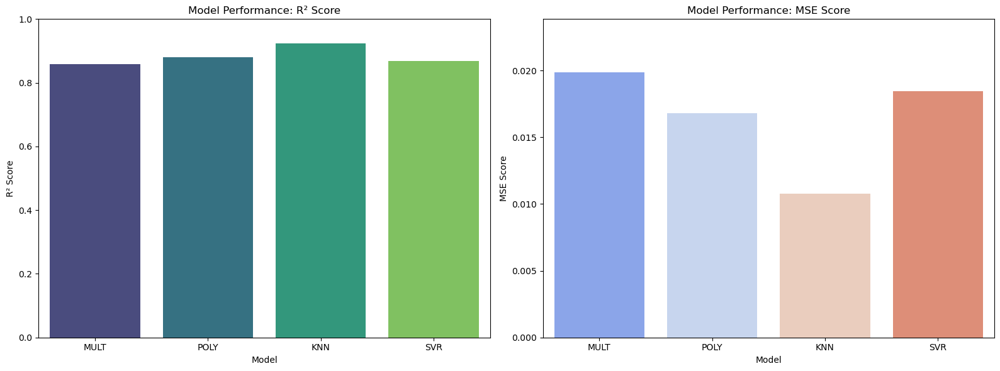

In [198]:
# Define features (X) and target variable (y) for the regression task
try:
    X = df7[['Export Value', 'Production']]  # Predictor variables
    y = df7['Export Quantity']  # Target variable

    # Define the models with fixed hyperparameters
    models = {
        'MULT': LinearRegression(),  # Multiple Linear Regression
        'POLY': Pipeline([  # Polynomial Regression
            ('PolynomialFeatures', PolynomialFeatures(degree=2, include_bias=False)),
            ('LinearRegression', LinearRegression())
        ]),
        'KNN': KNeighborsRegressor(n_neighbors=5, weights='uniform'),  # K-Nearest Neighbors Regression
        'SVR': SVR(C=1, gamma=0.1, kernel='rbf')  # Support Vector Regression
    }

    # Define K-Fold Cross-Validation setup
    kf = KFold(n_splits=5, shuffle=True, random_state=42)  # 5 splits with shuffling for randomness

    # Initialize containers for storing results and predictions
    results = []
    predictions = {}

    # Train and evaluate each model using K-Fold Cross-Validation
    for name, model in models.items():
        print(f"Evaluating {name} model with K-Fold cross-validation...")
        try:
            fold_scores_r2 = []  # Store R² scores for each fold
            fold_scores_mse = []  # Store MSE scores for each fold
            fold_predictions = []  # Store predictions for each fold

            # Perform cross-validation manually for each fold
            for train_index, test_index in kf.split(X):
                X_train, X_test = X.iloc[train_index], X.iloc[test_index]  # Split predictors
                y_train, y_test = y.iloc[train_index], y.iloc[test_index]  # Split target variable

                # Fit the model on the training set
                model.fit(X_train, y_train)

                # Evaluate the model on the test set
                y_pred = model.predict(X_test)
                fold_scores_r2.append(r2_score(y_test, y_pred))  # Calculate R² score
                fold_scores_mse.append(mean_squared_error(y_test, y_pred))  # Calculate MSE
                fold_predictions.extend(y_pred)  # Save predictions

            # Calculate the mean R² and MSE scores across all folds
            mean_r2_score = np.mean(fold_scores_r2)
            mean_mse_score = np.mean(fold_scores_mse)

            # Save results for this model
            results.append({
                'Model': name,
                'Mean CV R² Score': mean_r2_score,
                'Mean CV MSE Score': mean_mse_score
            })
            predictions[name] = fold_predictions
        except Exception as e:
            print(f"An error occurred while evaluating the {name} model:", e)

    # Convert results into a DataFrame for easy display
    results_df = pd.DataFrame(results)
    print("\nModel Evaluation Results with K-Fold Cross-Validation:")
    print(results_df)

    # Visualization of cross-validation results
    try:
        fig, axes = plt.subplots(1, 2, figsize=(16, 6), sharey=False)

        # Plot Mean CV R² Scores on the first subplot
        sns.barplot(
            ax=axes[0],
            x='Model',
            y='Mean CV R² Score',
            hue='Model',
            data=results_df,
            palette='viridis',
            dodge=False  # Single bars per model
        )
        axes[0].set_title('Model Performance: R² Score')
        axes[0].set_xlabel('Model')
        axes[0].set_ylabel('R² Score')
        axes[0].set_ylim(0, 1)  # R² score ranges from 0 to 1

        # Plot Mean CV MSE Scores on the second subplot
        sns.barplot(
            ax=axes[1],
            x='Model',
            y='Mean CV MSE Score',
            hue='Model',
            data=results_df,
            palette='coolwarm',
            dodge=False  # Single bars per model
        )
        axes[1].set_title('Model Performance: MSE Score')
        axes[1].set_xlabel('Model')
        axes[1].set_ylabel('MSE Score')
        axes[1].set_ylim(0, results_df['Mean CV MSE Score'].max() * 1.2)  # Adjust y-axis for better visualization

        # Adjust layout for better spacing
        plt.tight_layout()

        # Display the plots
        plt.show()
    except Exception as e:
        print("An error occurred during plotting:", e)

except KeyError as e:
    print("A KeyError occurred. Please check the column names in the dataset:", e)
except Exception as e:
    print("An unexpected error occurred:", e)


These bar charts show the best R² scores and MSE values during K-Fold Cross Validation for all models.

The R² score (coefficient of determination) measures how well the model explains the variance in the target variable. Models with R² values closer to 1 perform better at explaining this variance during K-Fold Cross Validation. Overall, all models perform well, with relatively high R² scores, though there is some variation among them.

The Mean Squared Error (MSE) measures the average squared difference between the predicted and actual values. Lower MSE values indicate better performance, as they reflect more accurate predictions on the test set. There is noticeable variation in MSE across the models, with some performing significantly better (lower MSE) than others.

KNN and SVR achieve the highest mean R² scores, indicating they generalize better during cross-validation.

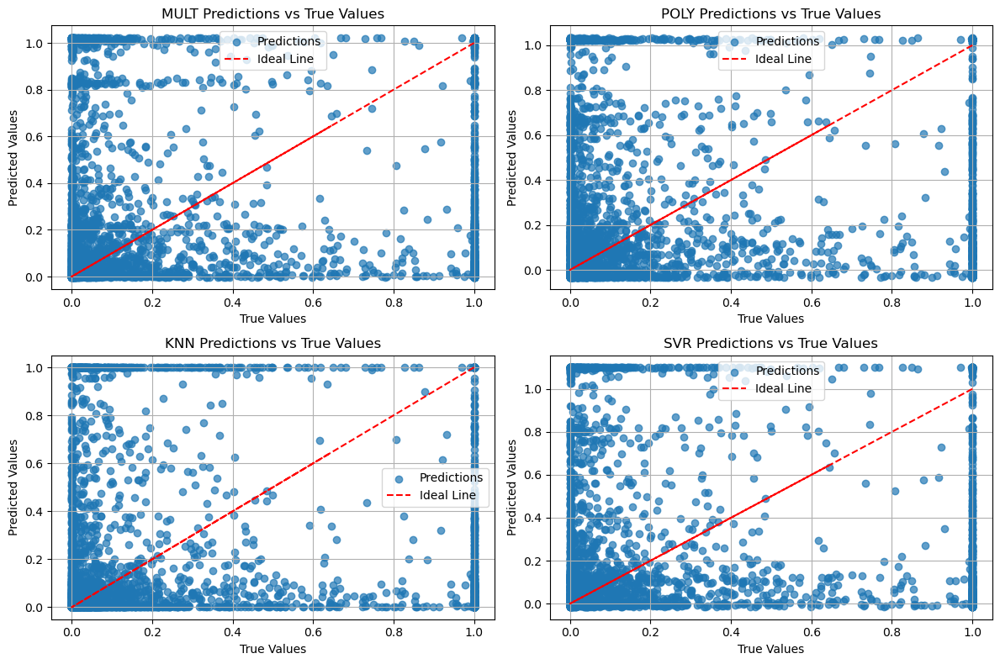

In [200]:
# Define the grid size for plotting
n_models = len(predictions)  # Total number of models
n_rows = (n_models + 1) // 2  # Calculate the number of rows needed for a 2x2 layout
fig, axes = plt.subplots(n_rows, 2, figsize=(12, 8))  # Create subplots

# Flatten the axes array for easier iteration
axes = axes.flatten()

# Plot each model's predictions in the grid
for idx, (model_name, y_pred) in enumerate(predictions.items()):
    ax = axes[idx]  # Select the current subplot
    ax.scatter(y, y_pred, alpha=0.7, label='Predictions')  # Scatter plot of actual vs predicted values
    ax.plot(y, y, color='red', linestyle='--', label='Ideal Line')  # Ideal prediction line
    ax.set_title(f'{model_name} Predictions vs True Values')  # Set title for each subplot
    ax.set_xlabel('True Values')  # Label for the x-axis
    ax.set_ylabel('Predicted Values')  # Label for the y-axis
    ax.legend()  # Add legend
    ax.grid()  # Add grid for better visualization

# Remove any unused subplots if the grid has extra spaces
for idx in range(len(predictions), len(axes)):
    fig.delaxes(axes[idx])

# Adjust layout to prevent overlapping of plots
plt.tight_layout()

# Display the final grid of scatter plots
plt.show()


This image shows scatterplots comparing the predicted values and true values for four regression models: Multiple Linear Regression (MULT), Polynomial Regression (POLY), K-Nearest Neighbors Regression (KNN), and Support Vector Regression (SVR). X-Axis represents the actual observed values of the target variable.Y-Axis represents the values predicted by the regression model.Red Diagonal Line represents the ideal case where predicted values perfectly match the true values.KNN demonstrates the closest fit to the diagonal line, indicating high accuracy and consistency. MULT struggles to predict accurately across the range of true values, suggesting limitations in capturing data variability. POLY shows improvement over MULT but still lacks consistency, especially for extreme values. SVR performs decently, though its scattered predictions highlight possible difficulties with generalization.

### Prediction with Polynomial Lineer Regression

Model Evaluation for Area: Germany, Item: Oats
Mean Squared Error: 108060081.63288301
R² Score: 0.26319274475665533

Prediction for the specified input:
Area: Germany, Item: Oats
Export Quantity: 17305.121986851063


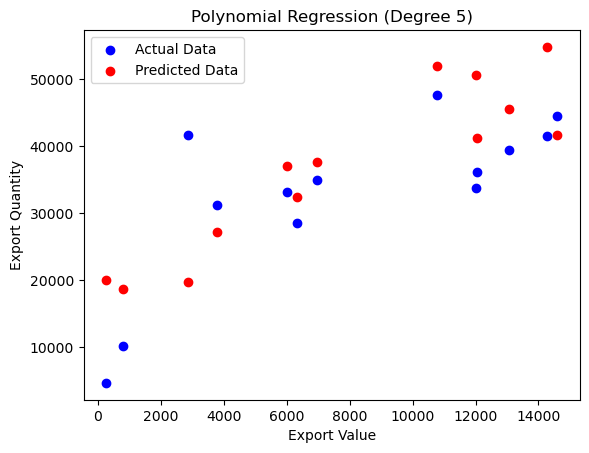

In [203]:
# Define the new input parameters for prediction
new_input = {
    "Area": "Germany",  # Area to filter
    "Item": "Oats",  # Item to filter
    "Export Value": 1120,  # Export Value for prediction
    "Production": 3386253.0  # Production for prediction
}

try:
    # Filter the dataset for the specified area and item
    filtered_data = df5[(df5['Area'] == new_input["Area"]) & (df5['Item'] == new_input["Item"])]

    # Check if any data is available for the specified area and item
    if filtered_data.empty:
        print("No data available for the specified area and item.")
    else:
        try:
            # Select features (X) and target (y) from the filtered dataset
            X_filtered = filtered_data[['Export Value', 'Production']].values  # Features
            y_filtered = filtered_data['Export Quantity'].values  # Target

            # Split the filtered data into training and testing sets
            X_train_filtered, X_test_filtered, y_train_filtered, y_test_filtered = train_test_split(
                X_filtered, y_filtered, test_size=0.2, random_state=42
            )

            # Apply polynomial features transformation (degree 5)
            poly = PolynomialFeatures(degree=5, include_bias=False, interaction_only=False, order='C')
            X_train_poly_filtered = poly.fit_transform(X_train_filtered)  # Transform training data
            X_test_poly_filtered = poly.transform(X_test_filtered)  # Transform testing data

            # Fit the Polynomial Regression model
            model_filtered = LinearRegression()
            model_filtered.fit(X_train_poly_filtered, y_train_filtered)

            # Evaluate the model's performance on the test set
            y_pred_filtered = model_filtered.predict(X_test_poly_filtered)  # Predictions on test data
            mse_filtered = mean_squared_error(y_test_filtered, y_pred_filtered)  # Mean Squared Error
            r2_filtered = r2_score(y_test_filtered, y_pred_filtered)  # R² Score

            # Print evaluation metrics
            print(f"Model Evaluation for Area: {new_input['Area']}, Item: {new_input['Item']}")
            print(f"Mean Squared Error: {mse_filtered}")
            print(f"R² Score: {r2_filtered}")

            # Prepare the new input for prediction
            prediction_input = np.array([[new_input["Export Value"], new_input["Production"]]])
            prediction_input_poly = poly.transform(prediction_input)  # Apply polynomial transformation
            predicted_export_quantity = model_filtered.predict(prediction_input_poly)  # Predict export quantity

            # Print the prediction
            print("\nPrediction for the specified input:")
            print(f"Area: {new_input['Area']}, Item: {new_input['Item']}")
            print(f"Export Quantity: {predicted_export_quantity[0]}")

            # Plot the actual vs predicted values for the test set
            plt.scatter(X_test_filtered[:, 0], y_test_filtered, color='blue', label='Actual Data')  # Actual values
            plt.scatter(X_test_filtered[:, 0], y_pred_filtered, color='red', label='Predicted Data')  # Predicted values
            plt.title('Polynomial Regression (Degree 5)')
            plt.xlabel('Export Value')
            plt.ylabel('Export Quantity')
            plt.legend()
            plt.show()
        except Exception as e:
            print("An error occurred during model training, evaluation, or prediction:", e)
except KeyError as e:
    print("A KeyError occurred. Please check the column names in the dataset:", e)
except Exception as e:
    print("An unexpected error occurred:", e)


### Prediction with K-Nearest Neighbors (KNN) Regression

Model Evaluation for Area: Ireland, Item: Potatoes
Mean Squared Error: 63519617.44408977
R² Score: 0.8154499070257849

Prediction for the specified input:
Area: Ireland, Item: Potatoes
Export Quantity: 43240.86666666667


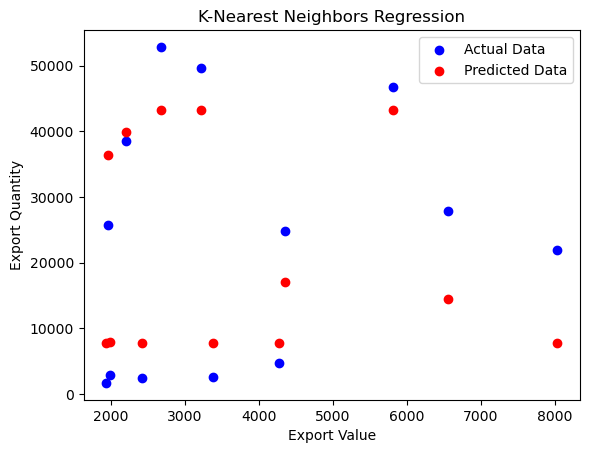

In [205]:
# Define the new input parameters for prediction
new_input = {
    "Area": "Ireland",  # Area to filter
    "Item": "Potatoes",  # Item to filter
    "Export Value": 3966.0,  # Export Value for prediction
    "Production": 1969400.0  # Production for prediction
}

try:
    # Filter the dataset for the specified area and item
    filtered_data = df5[(df5['Area'] == new_input["Area"]) & (df5['Item'] == new_input["Item"])]

    # Check if any data is available for the specified area and item
    if filtered_data.empty:
        print("No data available for the specified area and item.")
    else:
        try:
            # Select features (X) and target (y) from the filtered dataset
            X_filtered = filtered_data[['Export Value', 'Production']].values  # Features
            y_filtered = filtered_data['Export Quantity'].values  # Target

            # Split the filtered data into training and testing sets
            X_train_filtered, X_test_filtered, y_train_filtered, y_test_filtered = train_test_split(
                X_filtered, y_filtered, test_size=0.2, random_state=42
            )

            # Initialize and fit the KNN Regressor
            knn_model = KNeighborsRegressor(
                weights='uniform',
                algorithm='ball_tree',
                leaf_size=3,
                p=1,
                metric='minkowski',
                metric_params=None,
                n_jobs=None,
                n_neighbors=15
            )  # You can adjust the number of neighbors
            knn_model.fit(X_train_filtered, y_train_filtered)

            # Evaluate the model's performance on the test set
            y_pred_filtered = knn_model.predict(X_test_filtered)  # Predictions on test data
            mse_filtered = mean_squared_error(y_test_filtered, y_pred_filtered)  # Mean Squared Error
            r2_filtered = r2_score(y_test_filtered, y_pred_filtered)  # R² Score

            # Print evaluation metrics
            print(f"Model Evaluation for Area: {new_input['Area']}, Item: {new_input['Item']}")
            print(f"Mean Squared Error: {mse_filtered}")
            print(f"R² Score: {r2_filtered}")

            # Prepare the new input for prediction
            prediction_input = np.array([[new_input["Export Value"], new_input["Production"]]])
            predicted_export_quantity = knn_model.predict(prediction_input)  # Predict export quantity

            # Print the prediction
            print("\nPrediction for the specified input:")
            print(f"Area: {new_input['Area']}, Item: {new_input['Item']}")
            print(f"Export Quantity: {predicted_export_quantity[0]}")

            # Plot the actual vs predicted values for the test set
            plt.scatter(X_test_filtered[:, 0], y_test_filtered, color='blue', label='Actual Data')  # Actual values
            plt.scatter(X_test_filtered[:, 0], y_pred_filtered, color='red', label='Predicted Data')  # Predicted values
            plt.title('K-Nearest Neighbors Regression')
            plt.xlabel('Export Value')
            plt.ylabel('Export Quantity')
            plt.legend()
            plt.show()
        except Exception as e:
            print("An error occurred during model training, evaluation, or prediction:", e)
except KeyError as e:
    print("A KeyError occurred. Please check the column names in the dataset:", e)
except Exception as e:
    print("An unexpected error occurred:", e)

### Prediction Dashboard

In [207]:
app = Dash(__name__)

# Layout of the Dash app
app.layout = html.Div([
    html.H1("Export Quantity Prediction Dashboard"),
    html.Div([
        html.Label("Select Area:"),
        dcc.Dropdown(
            id='area-dropdown',
            options=[{'label': area, 'value': area} for area in df5['Area'].unique()],
            value=df5['Area'].unique()[0]
        ),
        html.Label("Select Item:"),
        dcc.Dropdown(
            id='item-dropdown',
            options=[{'label': item, 'value': item} for item in df5['Item'].unique()],
            value=df5['Item'].unique()[0]
        ),
        html.Label("Select Model:"),
        dcc.Dropdown(
            id='model-dropdown',
            options=[
                {'label': 'Polynomial Regression', 'value': 'polynomial'},
                {'label': 'K-Nearest Neighbors (KNN) Regression', 'value': 'knn'}
            ],
            value='polynomial'
        ),
        html.Label("Enter Export Value:"),
        dcc.Input(id='export-value', type='number', value=1000, step=1),
        html.Label("Enter Production:"),
        dcc.Input(id='production', type='number', value=500000, step=1),
        html.Button("Predict", id='predict-button', n_clicks=0)
    ]),
    html.Div(id='prediction-output', style={'marginTop': '20px'}),
    dcc.Graph(id='prediction-graph')
])

# Callback for prediction and graph update
@app.callback(
    [Output('prediction-output', 'children'),
     Output('prediction-graph', 'figure')],
    [Input('predict-button', 'n_clicks')],
    [State('area-dropdown', 'value'),
     State('item-dropdown', 'value'),
     State('model-dropdown', 'value'),
     State('export-value', 'value'),
     State('production', 'value')]
)
def predict_export_quantity(n_clicks, area, item, model_type, export_value, production):
    if n_clicks == 0:
        return "", {}

    # Filter dataset
    filtered_data = df5[(df5['Area'] == area) & (df5['Item'] == item)]

    if filtered_data.empty:
        return "No data available for the specified area and item.", {}

    try:
        # Features and target
        X = filtered_data[['Export Value', 'Production']].values
        y = filtered_data['Export Quantity'].values

        # Split dataset
        X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

        if model_type == 'polynomial':
            # Polynomial transformation
            poly = PolynomialFeatures(degree=5, include_bias=False)
            X_train_poly = poly.fit_transform(X_train)
            X_test_poly = poly.transform(X_test)

            # Model training
            model = LinearRegression()
            model.fit(X_train_poly, y_train)

            # Model evaluation
            y_pred = model.predict(X_test_poly)

            # Predict for new input
            input_data = np.array([[export_value, production]])
            input_poly = poly.transform(input_data)
            predicted_quantity = model.predict(input_poly)[0]
        elif model_type == 'knn':
            # Model training
            model = KNeighborsRegressor(n_neighbors=5)
            model.fit(X_train, y_train)

            # Model evaluation
            y_pred = model.predict(X_test)

            # Predict for new input
            input_data = np.array([[export_value, production]])
            predicted_quantity = model.predict(input_data)[0]
        else:
            return "Invalid model type selected.", {}

        # Calculate metrics
        mse = mean_squared_error(y_test, y_pred)
        r2 = r2_score(y_test, y_pred)

        # Generate graph
        fig = go.Figure()
        fig.add_trace(go.Scatter(x=X_test[:, 0], y=y_test, mode='markers', name='Actual Data'))
        fig.add_trace(go.Scatter(x=X_test[:, 0], y=y_pred, mode='markers', name='Predicted Data'))
        fig.update_layout(title=f"{model_type.capitalize()} Regression",
                          xaxis_title="Export Value",
                          yaxis_title="Export Quantity")

        # Output text
        output_text = (
            f"Prediction for Area: {area}, Item: {item}\n"
            f"Export Value: {export_value}, Production: {production}\n"
            f"Predicted Export Quantity: {predicted_quantity:.2f}\n"
            f"Mean Squared Error: {mse:.2f}, R² Score: {r2:.2f}"
        )

        return output_text, fig

    except Exception as e:
        return f"An error occurred: {e}", {}

# Run the Dash app
if __name__ == '__main__':
    app.run_server(debug=True)


# K-Means Clustering

`Problem -2`: I used K-Means clustering combined with Principal Component Analysis (PCA) to identify similarities between data instances. K-Means clustering with PCA is a powerful method for finding patterns in complex data. PCA simplifies the data by reducing it to fewer dimensions while retaining the most important information, making it easier to identify patterns and relationships. K-Means then groups similar data points into clusters based on this simplified data.

Together, PCA and K-Means make it easier to understand and visualize the data. For example, in this case, I grouped countries based on their production and export quantities, allowing us to see which countries are similar and what makes them different.

In [210]:
# Combine the scaled numerical data (df6_scaled) and the encoded categorical data (df6_encoded)
# This creates a new dataframe with both types of features for further analysis
df8 = pd.concat([df6_scaled, df5["Area"]], axis=1)
# Encoding the categorical variables to numerical varianles for classifacition
encoder = LabelEncoder()
df8['Area'] = encoder.fit_transform(df8['Area'])
# Display the first 5 rows of the combined dataframe to check the structure and contents
df8.head()

,Area Harvested,Production,Export Quantity,Export Value,Import Quantity,Import Value,Area
0,1.000000,0.682014,1.000000,0.831123,0.000624,0.000286,0
1,0.055078,0.075187,0.024572,0.008435,0.003381,0.000759,0
2,0.055979,0.076400,0.020695,0.007629,0.015382,0.006756,0
3,0.055708,0.054155,0.204245,0.051069,0.000148,0.000064,0
4,0.029268,0.049439,0.000000,0.000000,0.000000,0.000000,0


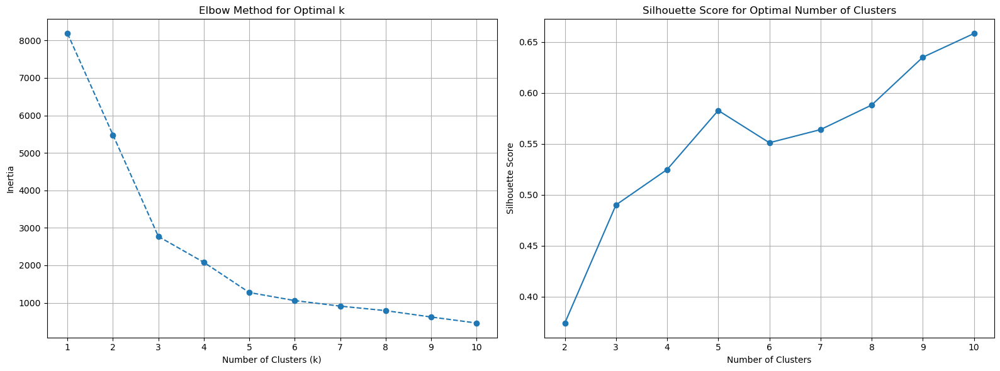

In [211]:
# Select relevant columns for clustering: 'Export Value', 'Export Quantity' and 'Area'
selected_data = df8[['Production', 'Export Quantity', 'Area']].dropna()  # Remove rows with missing values

# Scale the data for better clustering performance
scaler = StandardScaler()  # Initialize the StandardScaler
scaled_data = scaler.fit_transform(selected_data)  # Scale the selected data

# Initialize lists to store inertia and silhouette scores
inertia = []  # To track inertia for each value of k
silhouette_scores = []  # To track silhouette scores (only for k > 1)
k_values = range(1, 11)  # Range of cluster numbers to evaluate (1 to 10)

# Iterate over the range of cluster numbers
for k in k_values:
    kmeans = KMeans(n_clusters=k, random_state=42)  # Initialize KMeans with k clusters
    kmeans.fit(scaled_data)  # Fit KMeans to the scaled data
    inertia.append(kmeans.inertia_)  # Append inertia for the current k
    if k > 1:  # Silhouette scores are only valid when k > 1
        silhouette_scores.append(silhouette_score(scaled_data, kmeans.labels_))  # Append silhouette score

# Create subplots to visualize inertia and silhouette scores
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(16, 6))

# Plot inertia to identify the "elbow" point
ax1.plot(k_values, inertia, marker='o', linestyle='--')  # Line plot with markers
ax1.set_title('Elbow Method for Optimal k')  # Set title
ax1.set_xlabel('Number of Clusters (k)')  # Label x-axis
ax1.set_ylabel('Inertia')  # Label y-axis
ax1.set_xticks(k_values)  # Set x-ticks
ax1.grid(True)  # Add grid for better readability

# Plot silhouette scores to evaluate clustering quality
ax2.plot(k_values[1:], silhouette_scores, marker='o')  # Line plot for silhouette scores
ax2.set_title('Silhouette Score for Optimal Number of Clusters')  # Set title
ax2.set_xlabel('Number of Clusters')  # Label x-axis
ax2.set_ylabel('Silhouette Score')  # Label y-axis
ax2.grid(True)  # Add grid for better readability

# Adjust layout to prevent overlapping of plots
plt.tight_layout()

# Display the plots
plt.show()

- The first plot(Elbow Method) shows the relationship between the number of clusters (k) and the inertia (within-cluster sum of squares).X-Axis represents number of clusters (k). Y-Axis represents inertia, which measures the sum of squared distances between samples and their closest cluster center. Lower values of inertia indicate tighter clusters.The "elbow point" is where the rate of decrease in inertia slows significantly. It indicates the optimal number of clusters.
- The second plot ( Silhouett Score) evaluates the silhouette score for different numbers of clusters (k). The silhouette score measures how similar a data point is to its own cluster (cohesion) compared to other clusters (separation).X-Axis represents number of clusters (k). Y-Axis represents Silhouette score, which ranges from -1 to 1. Higher values indicate better-defined clusters.The peak of the curve represents the k value that produces the most well-defined clusters.
- Overall, Both the Elbow Method and Silhouette Score suggest that **K=4** is a strong candidate for the optimal number of clusters. K=3 is also worth considering based on the elbow method but has a lower silhouette score compared to K=4.

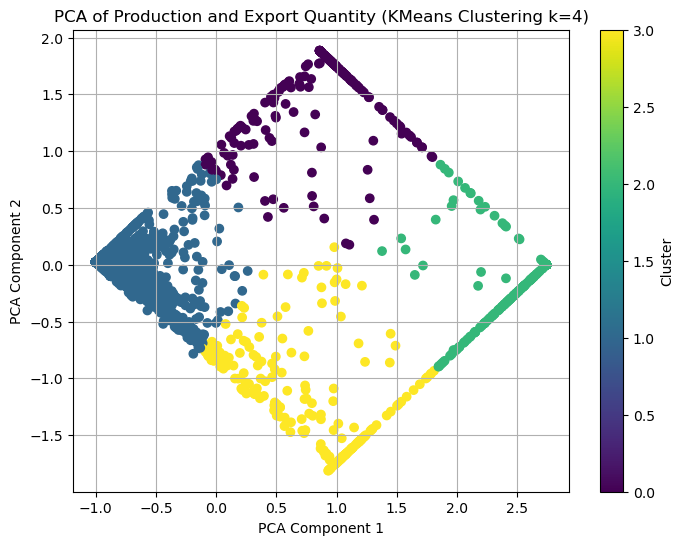

In [213]:
# --- Step 1: Data Selection and KMeans Clustering ---

# Select relevant columns for clustering: 'Production' and 'Export Quantity'
selected_data = df8[['Production', 'Export Quantity']].dropna()  # Remove missing values

# Scale the data using StandardScaler for better clustering performance
scaler = StandardScaler()  # Initialize the scaler
scaled_data = scaler.fit_transform(selected_data)  # Scale the selected data

# Perform KMeans clustering with 3 clusters (k=3)
kmeans = KMeans(n_clusters=4, random_state=42)  # Initialize KMeans with k=3
data = selected_data.copy()  # Create a copy of the selected data for modification
data['Cluster'] = kmeans.fit_predict(scaled_data)  # Add cluster labels to the data

# --- Step 2: Dimensionality Reduction with PCA ---

# Apply PCA to reduce data to 2 components for visualization
pca = PCA(n_components=2)  # Initialize PCA with 2 components
pca_components = pca.fit_transform(scaled_data)  # Apply PCA to scaled data

# Add the PCA components to the data for visualization
data['PCA1'] = pca_components[:, 0]  # First principal component
data['PCA2'] = pca_components[:, 1]  # Second principal component

# --- Step 3: Visualization of Clusters in PCA Space ---

# Scatter plot of the first two PCA components, colored by cluster labels
plt.figure(figsize=(8, 6))  # Set figure size
plt.scatter(
    data['PCA1'],  # PCA Component 1
    data['PCA2'],  # PCA Component 2
    c=data['Cluster'],  # Color points by cluster labels
    cmap='viridis',  # Colormap for clusters
    marker='o'  # Marker style
)
plt.title('PCA of Production and Export Quantity (KMeans Clustering k=4)')  # Plot title
plt.xlabel('PCA Component 1')  # Label for the x-axis
plt.ylabel('PCA Component 2')  # Label for the y-axis
plt.colorbar(label='Cluster')  # Add a colorbar for cluster labels
plt.grid(True)  # Add grid for better visualization
plt.show()  # Display the plot

This visualization represents the results of a k-means clustering analysis projected into a two-dimensional space using Principal Component Analysis (PCA).Axes (PCA Component 1 and PCA Component 2) represent the two principal components derived from the dataset.PCA reduces the dimensionality of the data while retaining the most variance, allowing for a two-dimensional representation of multi-dimensional data.Each color represents a different cluster identified by the k-means algorithm.Points belonging to the same cluster share similar characteristics in the original multi-dimensional space.

**Cluster 0 (Dark Blue)**:These points form a moderately dense group around the middle of the plot.Likely represents areas with moderate production and export quantities.These areas might have a balance between local agricultural activity and exports.

**Cluster 1 (Yellow)**:This cluster is more spread out towards the upper right.Represents areas with high production and high export quantities.Likely includes regions or crops that are significant exporters or large-scale producers.

**Cluster 2 (Green)**:This cluster is located towards the bottom right and is more compact.Represents areas with low production and low export quantities.
Likely smaller-scale producers or areas focusing on local consumption.

**Cluster 3 (Purple)**:This cluster is on the upper left side and forms a moderately dense group.Likely represents areas that are moderate producers but might not export large quantities.

# Sentiment Analysis

`Problem -3`: In this section, I aimed to analyze people's attitudes toward Ireland's agriculture. Specifically, I sought to determine whether their perspectives were positive, negative, or neutral on this topic. Additionally, I wanted to identify the types of words people use when discussing Ireland's agriculture.

To achieve this, I collected data from Reddit that included posts containing the words "Ireland" and "agriculture." The dataset consisted of several columns, such as "Title," "Top Comments," and "Polarity Score."

For text preprocessing, I applied techniques including tokenization, removal of stop words, stemming, and lemmatization. Additionally, I used a function to remove special characters from the text.

Once the data was prepared, I utilized two sentiment analysis techniques: Vader and Bag of Words. This approach allowed me to compare the accuracy of these models in analyzing sentiment.


### Preperation of Dataset

In [218]:
import nltk
from nltk.sentiment.vader import SentimentIntensityAnalyzer
from nltk.corpus import stopwords
from nltk.tokenize import word_tokenize
from nltk.stem import WordNetLemmatizer
import re
from nltk.stem import PorterStemmer
from vaderSentiment.vaderSentiment import SentimentIntensityAnalyzer
from sklearn.metrics import confusion_matrix
from sklearn.feature_extraction.text import CountVectorizer
from nltk.tokenize import RegexpTokenizer
from sklearn.metrics import accuracy_score, classification_report
from sklearn.naive_bayes import MultinomialNB
from sklearn import metrics
from wordcloud import WordCloud
from collections import Counter

In [219]:
#nltk.download('all')

In [220]:
df_sentiment = pd.read_csv("sentiment_data.csv")  # Reads the sentiment_data.csv file into a DataFrame.
df_sentiment.head()  # Displays the first 5 rows of the DataFrame to preview the data.

,Title,Score,Subreddit,URL,Created,Selftext,Top Comments,Polarity,Subjectivity,Polarity Score
0,"Cognitive dissonance, a data-based example: 85...",442,vegan,https://i.redd.it/wz56jygwhrcc1.jpeg,1.705394e+09,NaN,['Do you want to help build a more compassiona...,0.134649,0.405201,1
1,Looking at purchasing this land in Ireland to ...,529,Permaculture,https://i.redd.it/rojklyu625zb1.jpg,1.699456e+09,NaN,"[""how many acres is it? most foresters won't l...",0.321296,0.528704,1
2,Have you joined the boycott? r/loblawsisoutofc...,3575,ontario,https://www.reddit.com/r/ontario/comments/1cjl...,1.714775e+09,Almost 70k If your still on the fence here is ...,['Don’t forget Loblaw’s owned Shoppers Drug Ma...,0.167689,0.337421,1
3,Ireland has the fourth highest agricultural em...,233,ireland,https://i.redd.it/l026la1uk3e91.jpg,1.658922e+09,NaN,"[""Netherlands is top of that list (and Belgium...",0.101003,0.345238,1
4,Open Letter to Steve Huffman and the Board of ...,29146,AgainstHateSubreddits,https://www.reddit.com/r/AgainstHateSubreddits...,1.591621e+09,**Open Letter to Steve Huffman and the Board o...,"['This is going to fall on deaf ears, Steve ""C...",-0.022848,0.483992,-1


In [221]:
# Drop specified columns from the DataFrame
df_sentiment = df_sentiment.drop(['Score', 'Subreddit', 'URL', 'Created', 'Selftext'], axis=1)
# Preview the updated DataFrame
df_sentiment.head()

,Title,Top Comments,Polarity,Subjectivity,Polarity Score
0,"Cognitive dissonance, a data-based example: 85...",['Do you want to help build a more compassiona...,0.134649,0.405201,1
1,Looking at purchasing this land in Ireland to ...,"[""how many acres is it? most foresters won't l...",0.321296,0.528704,1
2,Have you joined the boycott? r/loblawsisoutofc...,['Don’t forget Loblaw’s owned Shoppers Drug Ma...,0.167689,0.337421,1
3,Ireland has the fourth highest agricultural em...,"[""Netherlands is top of that list (and Belgium...",0.101003,0.345238,1
4,Open Letter to Steve Huffman and the Board of ...,"['This is going to fall on deaf ears, Steve ""C...",-0.022848,0.483992,-1


- I created two text preprocessing functions: one using a lemmatizer and the other using a stemmer. My goal was to evaluate which method is more suitable for each sentiment analysis technique.

In [223]:
# Create a new DataFrame from the existing one to apply preprocessing
df_sentiment_lemmatizer = pd.DataFrame(df_sentiment)

# Define a function to preprocess text data
def preprocess_text(text):
    # Tokenize the text (split text into individual words and convert to lowercase)
    tokens = word_tokenize(text.lower())
    
    # Remove stop words (common words like "the", "is", "and" that add little meaning)
    filtered_tokens = [token for token in tokens if token not in stopwords.words('english')]
    
    # Initialize the lemmatizer (reduces words to their base or root form)
    lemmatizer = WordNetLemmatizer()
    # Lemmatize the tokens (e.g., "running" becomes "run")
    lemmatized_tokens = [lemmatizer.lemmatize(token) for token in filtered_tokens]
    
    # Join the lemmatized tokens back into a single string
    processed_text = ' '.join(lemmatized_tokens)
    return processed_text

# Apply the preprocess_text function to the "Top Comments" column
df_sentiment_lemmatizer["Top Comments"] = df_sentiment["Top Comments"].apply(preprocess_text)

# Apply the preprocess_text function to the "Title" column
df_sentiment_lemmatizer["Title"] = df_sentiment["Title"].apply(preprocess_text)

In [224]:
# Create a new DataFrame from the existing one to apply preprocessing
df_sentiment_stemmer = pd.DataFrame(df_sentiment)

# Define a function to preprocess text data using stemming
def preprocess_text2(text):
    # Tokenize the text (split text into individual words and convert to lowercase)
    tokens = word_tokenize(text.lower())
    
    # Remove stop words (common words like "the", "is", "and" that add little meaning)
    filtered_tokens = [token for token in tokens if token not in stopwords.words('english')]
    
    # Initialize the stemmer (reduces words to their base form by cutting suffixes)
    stemmer = PorterStemmer()
    # Stem the tokens (e.g., "running" becomes "run", "better" becomes "better")
    stemmed_tokens = [stemmer.stem(token) for token in filtered_tokens]
    
    # Join the stemmed tokens back into a single string
    processed_text = ' '.join(stemmed_tokens)
    return processed_text

# Apply the preprocess_text2 function to the "Top Comments" column
df_sentiment_stemmer["Top Comments"] = df_sentiment["Top Comments"].apply(preprocess_text2)

# Apply the preprocess_text2 function to the "Title" column
df_sentiment_stemmer["Title"] = df_sentiment["Title"].apply(preprocess_text2)

- This function helps clean special characters in the selected columns. I applied this function to the "Title" and "Top Comments" columns for each dataset I created (the lemmatizer dataset and the stemmer dataset).

In [226]:
# Function to clean text in the column
def clean_comments(comments):
    try:
        # Convert string representation of a list back to an actual Python list
        comments_list = eval(comments)  
        
        # Remove special characters from each comment in the list
        cleaned_comments = [
            re.sub(r'[^\w\s]', '', comment) for comment in comments_list  
        ]
        
        # Convert the cleaned list back to a string representation for storage
        return str(cleaned_comments)  
    except:
        # If any error occurs (e.g., the input is not a list), return the original comments
        return comments

# Apply cleaning to the 'Top Comments' column for the lemmatized DataFrame
df_sentiment_lemmatizer['Top Comments'] = df_sentiment_lemmatizer['Top Comments'].apply(clean_comments)
# Apply cleaning to the 'Title' column for the lemmatized DataFrame
df_sentiment_lemmatizer['Title'] = df_sentiment_lemmatizer['Title'].apply(clean_comments)
# Apply cleaning to the 'Top Comments' column for the stemmed DataFrame
df_sentiment_stemmer['Top Comments'] = df_sentiment_stemmer['Top Comments'].apply(clean_comments)
# Apply cleaning to the 'Title' column for the stemmed DataFrame
df_sentiment_stemmer['Title'] = df_sentiment_stemmer['Title'].apply(clean_comments)

- I created a function to generate a new column that classifies text as a string label ("Positive," "Negative," or "Neutral") based on the polarity score(1, -1, 0).

In [228]:
# Creating a new column in the lemmatized DataFrame to label polarity based on 'Polarity Score'
df_sentiment_lemmatizer['Polarity Label'] = df_sentiment_lemmatizer['Polarity Score'].apply(
    lambda x: 'positive' if x == 1 else 'negative' if x == -1 else 'neutral'
)

# Creating a new column in the stemmed DataFrame to label polarity based on 'Polarity Score'
df_sentiment_stemmer['Polarity Label'] = df_sentiment_stemmer['Polarity Score'].apply(
    lambda x: 'positive' if x == 1 else 'negative' if x == -1 else 'neutral'
)

In [229]:
# Last version of Lemmatizer DataFrame.
df_sentiment_lemmatizer.head()

,Title,Top Comments,Polarity,Subjectivity,Polarity Score,Polarity Label
0,"cognitive dissonance , data-based example : 85...",[ 'do want help build compassionate world ? pl...,0.134649,0.405201,1,positive
1,looking purchasing land ireland grow native wo...,[ `` many acre ? forester wo n't look le 18 ac...,0.321296,0.528704,1,positive
2,joined boycott ? r/loblawsisoutofcontrol,['don forget loblaw owned shopper drug mart ...,0.167689,0.337421,1,positive
3,ireland fourth highest agricultural emission p...,[ `` netherlands top list ( belgium 2nd ) . 6t...,0.101003,0.345238,1,positive
4,open letter steve huffman board director reddi...,"[ 'this going fall deaf ear , steve `` cryptof...",-0.022848,0.483992,-1,negative


In [230]:
# Last version of Stemmer DataFrame.
df_sentiment_stemmer.head()

,Title,Top Comments,Polarity,Subjectivity,Polarity Score,Polarity Label
0,"cognit disson , data-bas exampl : 85 % ireland...",[ 'do want help build compassion world ? pleas...,0.134649,0.405201,1,positive
1,look purchas land ireland grow nativ woodland ...,[ `` mani acr ? forest wo n't look less 18 acr...,0.321296,0.528704,1,positive
2,join boycott ? r/loblawsisoutofcontrol,['don forget loblaw own shopper drug mart u...,0.167689,0.337421,1,positive
3,ireland fourth highest agricultur emiss per sq...,[ `` netherland top list ( belgium 2nd ) . 6th...,0.101003,0.345238,1,positive
4,open letter steve huffman board director reddi...,"[ 'thi go fall deaf ear , steve `` cryptofasci...",-0.022848,0.483992,-1,negative


### Vader Sentiment Analysis 

- `Vader (Valence Aware Dictionary and Sentiment Reasoner)` is specifically designed to handle sentiment analysis in social media text and informal language.Unlike traditional sentiment analysis methods, VADER is tailored to detect sentiment in short pieces of text, such as tweets, product reviews, or other user-generated content that often contains slang, emojis, and abbreviations. It utilizes a pre-built lexicon of words associated with sentiment values and applies a rule-based approach to calculate sentiment scores.es

- For Vader Sentiment Analysis, I tested the Lemmatizer and Stemmer methods separately. The results were 0.619 and 0.566, respectively. Therefore, I decided to use the Lemmatizer dataset.

In [233]:
# Create a new DataFrame from df_sentiment_lemmatizer for Vader analysis
df_sentiment_vader = pd.DataFrame(df_sentiment_lemmatizer)

# Initialize the SentimentIntensityAnalyzer from Vader
analyzer = SentimentIntensityAnalyzer()

# Function to map Vader's output dictionary to a polarity label
def format_output(output_dict):
    # Initialize the default polarity as "neutral"
    polarity = "neutral"

    # Determine polarity based on the compound score
    if output_dict['compound'] >= 0.05:  # Compound score threshold for positive sentiment
        polarity = "positive"
    elif output_dict['compound'] <= -0.05:  # Compound score threshold for negative sentiment
        polarity = "negative"

    # Return the determined polarity
    return polarity

# Function to predict sentiment for a given text using Vader
def predict_sentiment(text):
    # Get the sentiment scores (e.g., compound, pos, neu, neg) for the text
    output_dict = analyzer.polarity_scores(text)
    # Format the output to return a single polarity label
    return format_output(output_dict)

In [234]:
# applies the predict_sentiment function to the "Top Comments" column.
df_sentiment_vader["Vader Prediction"] = df_sentiment_vader["Top Comments"].apply(predict_sentiment)

In [235]:
# New DataFrame with "Vader PRediction" column.
df_sentiment_vader.head()

,Title,Top Comments,Polarity,Subjectivity,Polarity Score,Polarity Label,Vader Prediction
0,"cognitive dissonance , data-based example : 85...",[ 'do want help build compassionate world ? pl...,0.134649,0.405201,1,positive,positive
1,looking purchasing land ireland grow native wo...,[ `` many acre ? forester wo n't look le 18 ac...,0.321296,0.528704,1,positive,positive
2,joined boycott ? r/loblawsisoutofcontrol,['don forget loblaw owned shopper drug mart ...,0.167689,0.337421,1,positive,positive
3,ireland fourth highest agricultural emission p...,[ `` netherlands top list ( belgium 2nd ) . 6t...,0.101003,0.345238,1,positive,negative
4,open letter steve huffman board director reddi...,"[ 'this going fall deaf ear , steve `` cryptof...",-0.022848,0.483992,-1,negative,negative


In [236]:
# Count the occurrences of each label in the Polarity Label and Vader Prediction columns
label_counts = df_sentiment_vader['Polarity Label'].value_counts()
label_counts_vader = df_sentiment_vader['Vader Prediction'].value_counts()

# Combine the counts into a single DataFrame for side-by-side display
comparison_df = pd.DataFrame({
    'Polarity Label Counts': label_counts,
    'Vader Prediction Counts': label_counts_vader
}).fillna(0)  # Fill NaN with 0 if one category is missing in a column

# Display the combined counts
print(comparison_df)

          Polarity Label Counts  Vader Prediction Counts
positive                    165                      111
neutral                      33                       76
negative                     28                       39


- According to the polarity results above, people generally have positive thoughts about Ireland's agriculture.

In [238]:
# generate a matrix comparing the true labels (Polarity Label) with the predicted labels (Vader Prediction).
print(confusion_matrix(df_sentiment_vader['Polarity Label'], df_sentiment_vader['Vader Prediction']))

[[  5  18   5]
 [  0  31   2]
 [ 34  27 104]]


In [239]:
from sklearn.metrics import accuracy_score, classification_report

# Calculate accuracy by comparing true labels with predicted labels
accuracy = accuracy_score(df_sentiment_vader['Polarity Label'], df_sentiment_vader['Vader Prediction'])

# Print accuracy score
print("Accuracy: {}\n".format(accuracy))

# Display detailed classification metrics (precision, recall, F1-score)
print(classification_report(df_sentiment_vader['Polarity Label'], df_sentiment_vader['Vader Prediction']))

Accuracy: 0.6194690265486725

              precision    recall  f1-score   support

    negative       0.13      0.18      0.15        28
     neutral       0.41      0.94      0.57        33
    positive       0.94      0.63      0.75       165

    accuracy                           0.62       226
   macro avg       0.49      0.58      0.49       226
weighted avg       0.76      0.62      0.65       226



### Bag of Words

- `Bag of Words (BoW)` model is a technique used in natural language processing (NLP) to represent text data as numerical features. In this model, each document or piece of text is represented as a "bag" of words, where each unique word in the text corresponds to a separate feature or dimension in the resulting vector. The value of each feature is determined by the frequency of the corresponding word in the text.

- For Bag of Words Analysis, I tested the Lemmatizer and Stemmer methods separately. The results were 0.666 and 0.701, respectively. Therefore, I decided to use the Stemmer dataset.

In [242]:
# Create a DataFrame for sentiment data
df_sentiment_bagow = pd.DataFrame(df_sentiment_stemmer)

# Pre-processing and Bag of Words vectorization using CountVectorizer

# Define a tokenizer to extract alphanumeric tokens
token = RegexpTokenizer(r'[a-zA-Z0-9]+')

# Initialize CountVectorizer with English stop words and unigram configuration
cv = CountVectorizer(
    stop_words='english',  # Remove common English stop words
    ngram_range=(1, 1),    # Use unigrams (single words)
    tokenizer=token.tokenize  # Use custom tokenizer
)

# Apply CountVectorizer to transform the 'Top Comments' column into a sparse matrix
text_counts = cv.fit_transform(df_sentiment_bagow['Top Comments'])

# Result is a sparse matrix representation of the document-term frequencies
text_counts

<226x4266 sparse matrix of type '<class 'numpy.int64'>'
	with 10312 stored elements in Compressed Sparse Row format>

In [243]:
#Splitting the data into trainig and testing
X_train, X_test, Y_train, Y_test = train_test_split(text_counts, df_sentiment_bagow['Polarity Label'], test_size=0.25, random_state=5)

In [244]:
# the shapes of the variables
text_counts.shape, X_train.shape, X_test.shape, Y_train.shape, Y_test.shape

((226, 4266), (169, 4266), (57, 4266), (169,), (57,))

In [245]:
# Initialize the Multinomial Naive Bayes model
MNB = MultinomialNB()

# Train the model using the training data
MNB.fit(X_train, Y_train)

# Predict the target values for the test data
predicted = MNB.predict(X_test)

# Calculate and print the accuracy score of the model
accuracy_score = metrics.accuracy_score(predicted, Y_test)
print("Accuracy Score: ", accuracy_score)

Accuracy Score:  0.7017543859649122


### Visualization of Word Frequency

 - I created some visualization to identify the most frequently used words when people discuss Ireland's agriculture. For this visualization, I used the WordCloud library.Word Cloud is a data visualization technique used for representing text data in which the size of each word indicates its frequency or importance. Significant textual data points can be highlighted using a word cloud. Word clouds are widely used for analyzing data from social network websites.

In [248]:
#pip install wordcloud

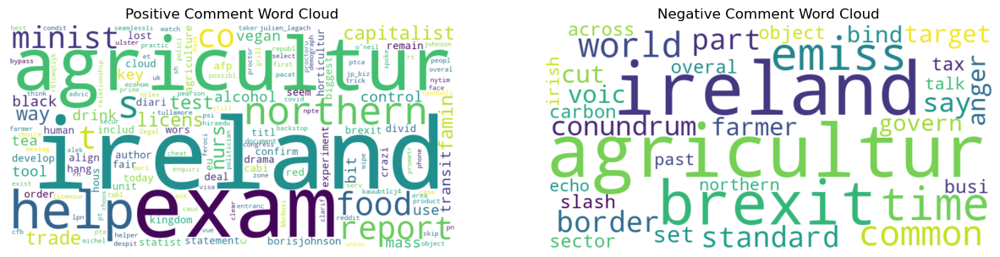

In [249]:
# Separate positive and negative comments based on sentiment
positive_comments = df_sentiment_stemmer[df_sentiment_lemmatizer['Polarity Score'] == 1]['Title']
negative_comments = df_sentiment_stemmer[df_sentiment_lemmatizer['Polarity Score'] == -1]['Title']

# Sample 10% of positive and negative comments
sample_positive_text = " ".join(text for text in positive_comments.sample(frac=0.1, random_state=23))
sample_negative_text = " ".join(text for text in negative_comments.sample(frac=0.1, random_state=23))

# Generate word clouds
wordcloud_positive = WordCloud(width=800, height=400, max_words=200, background_color="white").generate(sample_positive_text)
wordcloud_negative = WordCloud(width=800, height=400, max_words=200, background_color="white").generate(sample_negative_text)

# Plot word clouds
plt.figure(figsize=(15, 7.5))

# Positive word cloud
plt.subplot(1, 2, 1)
plt.imshow(wordcloud_positive, interpolation='bilinear')
plt.title('Positive Comment Word Cloud')
plt.axis("off")

# Negative word cloud
plt.subplot(1, 2, 2)
plt.imshow(wordcloud_negative, interpolation='bilinear')
plt.title('Negative Comment Word Cloud')
plt.axis("off")

plt.show()

- Both clouds highlight "Ireland" and "agriculture," signifying that these are widely discussed topics in both positive and negative contexts.The tone and associated words differ significantly, with "exam" and "help" being positive, while "brexit" and "anger" are negative.Positive comments emphasize progress, tools, and assistance.
Negative comments focus on political dissatisfaction, challenges, and frustration.

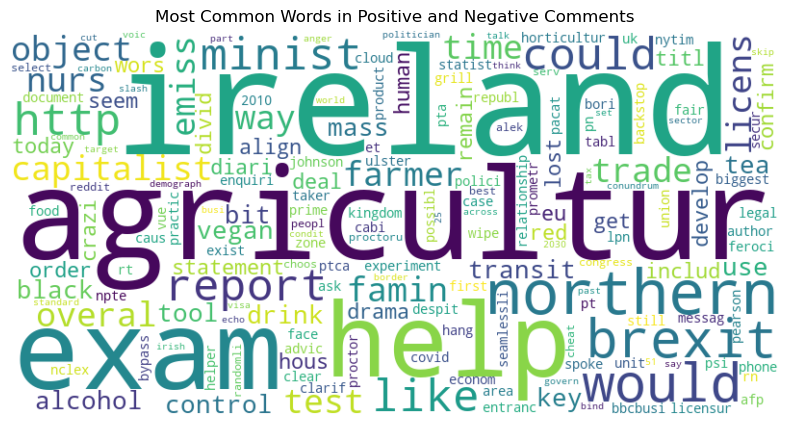

In [251]:
# Sample data from both positive and negative comments
sample_positive_text = " ".join(text for text in positive_comments.sample(frac=0.1, random_state=23))
sample_negative_text = " ".join(text for text in negative_comments.sample(frac=0.1, random_state=23))

# Combine both texts
combined_text = sample_positive_text + " " + sample_negative_text

# Tokenize the combined text and remove stopwords
stop_words = set(stopwords.words('english'))
tokens = word_tokenize(combined_text.lower())
filtered_words = [word for word in tokens if word.isalnum() and word not in stop_words]

# Count the frequency of each word
word_counts = Counter(filtered_words)

# Create a WordCloud
wordcloud = WordCloud(width=800, height=400, max_words=200, background_color="white").generate_from_frequencies(word_counts)

# Plot the word cloud
plt.figure(figsize=(10, 5))
plt.imshow(wordcloud, interpolation='bilinear')
plt.title('Most Common Words in Positive and Negative Comments')
plt.axis("off")
plt.show()

- Words like "agriculture," "Ireland," "exam," "help," and "northern" appear prominently, indicating they are central topics across both sentiments.
Specific terms such as "brexit," "report," "capitalist," "time," and "trade" suggest a mix of political, economic, and social discussions.Central themes, likely reflecting the significance of these topics in the comments. Words like "brexit," "trade," "deal," and "capitalist" highlight discussions on political and economic matters.Words like "help" and "control" vs. "anger" and "lost" suggest a contrast between problem-solving and grievances.

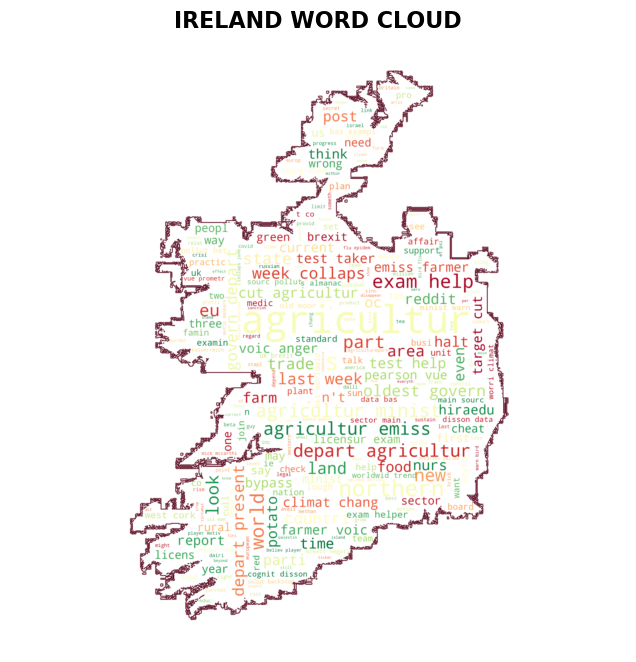

In [253]:
from wordcloud import WordCloud, STOPWORDS
from PIL import Image
# Create the mask
ireland_mask = np.array(Image.open('ireland.jpg'))

# Define stopwords (if not already defined)
stopwords = set(STOPWORDS)
stopwords.update(['ireland', 'irish'])  # Add custom stopwords if needed

# Function to generate a word cloud with a map shape
def generate_better_wordcloud(data, title, mask=None):
    cloud = WordCloud(
        scale=3,
        max_words=250,
        colormap='RdYlGn',          # Custom color scheme
        mask=mask,                  # Use the Ireland-shaped mask
        background_color='white',
        stopwords=stopwords,        # Exclude stopwords
        contour_color='#5d0f24',    # Contour color for the mask
        contour_width=3             # Thickness of the contour
    ).generate(data)  # Generate from text
    
    plt.figure(figsize=(10, 8))    # Adjust figure size
    plt.imshow(cloud, interpolation='bilinear')  # Smooth rendering
    plt.axis('off')                # Remove axes for better display
    plt.title(title, fontsize=16, fontweight='bold')  # Add title
    plt.show()

# Example usage (assuming `df_sentiment_lemmatizer` is a text column of your dataframe)
# Combine all text from the dataset into one large string
data_text = " ".join(df_sentiment_stemmer['Title'])  # Ensure this is the correct text data source

# Generate the word cloud
generate_better_wordcloud(data_text, 'IRELAND WORD CLOUD', mask=ireland_mask)


- I created a visualization of the most common words about Ireland's agriculture, displayed in the shape of Ireland's map.

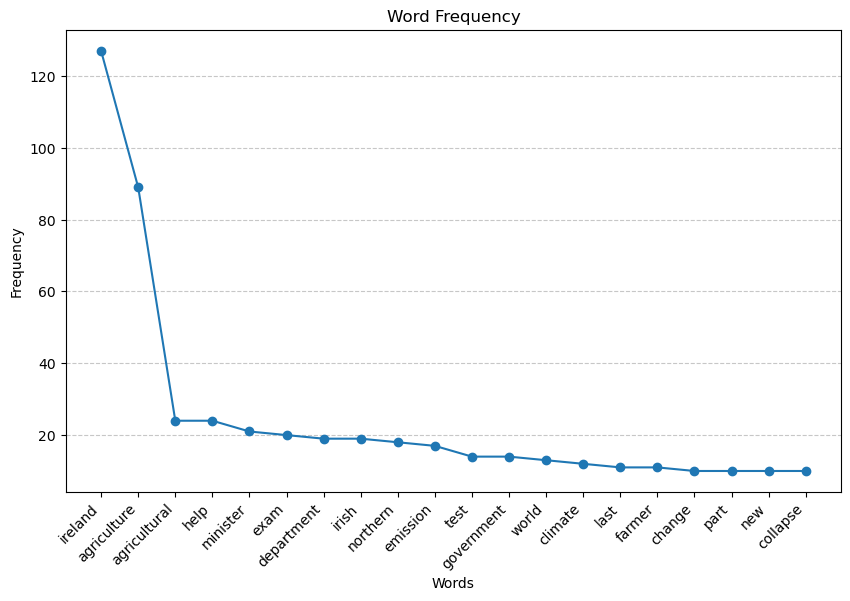

In [255]:
from nltk.tokenize import word_tokenize
from nltk.corpus import stopwords
from collections import Counter
import pandas as pd
import matplotlib.pyplot as plt

# Combine all text data from the 'Title' column
all_text = ' '.join(df_sentiment_lemmatizer['Title'].dropna())

# Tokenize words from the combined text
words = word_tokenize(all_text.lower())

# Remove stopwords and non-alphanumeric characters
stop_words = set(stopwords.words('english'))
filtered_words = [word for word in words if word.isalnum() and word not in stop_words]

# Count word frequencies
word_counts = Counter(filtered_words)

# Create a DataFrame for word frequencies
word_freq_df = pd.DataFrame(word_counts.items(), columns=['Word', 'Frequency']).sort_values(by='Frequency', ascending=False)

# Plot the top 20 most frequent words
top_n = 20
top_words = word_freq_df.head(top_n)

plt.figure(figsize=(10, 6))
plt.plot(top_words['Word'], top_words['Frequency'], marker='o')
plt.xticks(rotation=45, ha='right')
plt.title('Word Frequency')
plt.xlabel('Words')
plt.ylabel('Frequency')
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.show()

- This line plot visualizes the word frequency distribution of the most common words in the comments.The x-axis represents the top words from the comments, ranked in decreasing order of their frequency.The y-axis represents the frequency of each word, showing how often these words appear in the comments.